In [1]:
import brian2 as b2 # used for neural simulation
from brian2 import *

import numpy as np # used for array operations
from scipy.stats import poisson, binom, f, multivariate_normal, stats # used for stats (mean, s.d.)
from scipy import stats
from scipy.special import gammaln

import matplotlib.pyplot as plt # used for plotting
from matplotlib import gridspec
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D

import math
import random
import warnings
import json

b2.prefs.codegen.target = "numpy" # set Brian2 to use numpy backend

# from sklearn.feature_selection import f_classif
# from brian2 import NeuronGroup, Synapses, PoissonGroup, SpikeMonitor, run, ms, Hz, PoissonInput, clear_cache, device, get_unit, second

In [2]:
%run neural_simulation_functions.py
# %run neural_simulation_functions.ipynb

#fix it to be a .py file not a .ipynb file

In [3]:
#import the python file
# once everything is good run this

#from neural_simulation_functions import *

Parameters.

In [5]:
num_neurons = 10 # try 10 just to see covariance matrices
rate = 10 # change back to 10
rates = np.linspace(5, 15, num_neurons) # change back to np.linspace(5, 14, num_neurons)
time = 1000
num_samples = 1000 # change to 100 to show Alex next time, but plot the first five trajectories or random five 
t0 = 200
time_points = np.arange(0, 1000)

In [6]:
rates

array([ 5.        ,  6.11111111,  7.22222222,  8.33333333,  9.44444444,
       10.55555556, 11.66666667, 12.77777778, 13.88888889, 15.        ])

In [7]:
# Single rate absolute (perturbation magnitude with rate): std_dev = perturbation_magnitude * base_rates[neuron]
#perturbed_rate1 = generate_perturbed_rates(num_neurons, rate, perturbation_magnitude = 0.1, relative=True)
# each neuron has a rate of 10 hz
#print(perturbed_rate1)

# Single rate relative (perturbation magnitude without rate): std_dev = perturbation_magnitude
#perturbed_rate2 = generate_perturbed_rates(num_neurons, rate, perturbation_magnitude = 0.1, relative=False)
# each neuron has a rate of 10 hz
#print(perturbed_rate2)

In [8]:
perturbed_rates1 = generate_perturbed_rates(num_neurons, rates, perturbation_magnitude = 0.1, relative=True)
print(perturbed_rates1)

#perturbed_rates2 = generate_perturbed_rates(num_neurons, rates, perturbation_magnitude = 0.1, relative=False)
#print(perturbed_rates2)

[ 5.99763973  4.47589203  6.975722   10.2808757   8.26864171 11.72170961
 13.66618601 12.88057749 18.06379712 15.26393833]


In [9]:
# Simulation control parameters

# Network parameters
N_E = 1000
#gamma = 0.25                    # ratio of inhibitory to excitatory neurons
#N_I = round(gamma * N_E)
#N = N_E + N_I
epsilon = 0.5                   # Sparsity of connections.  changed from 0.1, 0.2 was fine...
#C_E = epsilon * N_E             # number of excitatory connections per neuron
#C_ext = C_E                     # external connections per neuron


# Neuron parameters
#tau = 20  * ms                  # Membrane time constant. previously 20, tried 50 it was weird, larger numbers more spikes, smaller numbers less spikes
                                # Higher Tau means slower decay, more spikes.
                                # Lower Tau means faster decay, fewer spikes
#theta = 20  * mV                # spike threshold voltage, neuron fires when hitting this value
#V_r = 10  * mV                  # reset potential, voltage neuron goes back to after firing
#tau_rp = 2  * ms                # refractory period (neuron needs to wait some time before spiking again)

# Synapse parameters
#J = 0.1 * mV                    # Synaptic strength # Previously 0.1 * mV, previouysly 0.075, 0.2 was too varied need to be more consistent
                                # larger J, stronger synaptic input, higher firing rate
                                # smaller J, weaker input, lower firing rates
#D = 1.5  * ms                   # synaptic delay, time between a pre spike and its effect on postsynap neuron

# Simulation settings
#dt = 0.1  * ms
g = 4                           # g is a good control for manipulating the firing rate, smaller numbers more spikes, bigger numbers less spikes
                                # Higher g, stronger inhibition, suppresses network activity
                                # Lower g, weaker inhibition, increase network activity
nu_ext_over_nu_thr = 1          # Previously 2, 1.2 was weird, 1 (made 2d plot nice), 0.5 not good,
# t_range = [1000, 1200]
# rate_range = [0, 200]
# rate_tick_step = 50

#nu_thr = theta / (J * C_E * tau) # minimal input rate needed to reach threshold
#nu_ext = nu_ext_over_nu_thr * nu_thr # external input rate

# adjust g and nu_ext so that nu_ext is approximately the number of spikes that are occuring, influenced by g. 
# epsilon 0.2 and g = 2.6, g = 2.8 is too much,tau = 50
# epsilon 0.5 and g = 4, tau = 20

Generating spike trains, then counting the spikes.

In [11]:
raw_spike_train = independent_poisson_processes(num_neurons, time, num_samples, rate = rate)
# print(raw_spike_train)

In [12]:
save_spike_trains(raw_spike_train, "spike_trains.json")
loaded_spike_trains = load_spike_trains("spike_trains.json")
# print(loaded_spike_trains)

Spike trains saved to spike_trains.json


In [13]:
spike_train = standardize_units(raw_spike_train)
# print(spike_train)

In [14]:
raw_multi_rate_spike_train = multivariate_constant_poisson(num_neurons, time, num_samples, rates = rates)

WARNING    'rates' is an internal variable of group 'poissongroup', but also exists in the run namespace with the value array([ 5.        ,  6.11111111,  7.22222222,  8.33333333,  9.44444444,
       10.55555556, 11.66666667, 12.77777778, 13.88888889, 15.        ]). The internal variable will be used. [brian2.groups.group.Group.resolve.resolution_conflict]


In [15]:
save_spike_trains(raw_multi_rate_spike_train, "multi_rate_spike_trains.json")
loaded_spike_trains = load_spike_trains("multi_rate_spike_trains.json")

Spike trains saved to multi_rate_spike_trains.json


In [16]:
multi_rate_spike_train = standardize_units(raw_multi_rate_spike_train)

In [17]:
raw_perturbed_rate_spike_train = multivariate_constant_poisson(num_neurons, time, num_samples, rates = perturbed_rates1)

WARNING    'rates' is an internal variable of group 'poissongroup', but also exists in the run namespace with the value array([ 5.99763973,  4.47589203,  6.975722  , 10.2808757 ,  8.26864171,
       11.72170961, 13.66618601, 12.88057749, 18.06379712, 15.26393833]). The internal variable will be used. [brian2.groups.group.Group.resolve.resolution_conflict]


In [18]:
save_spike_trains(raw_perturbed_rate_spike_train, "perturbed_rate_spike_trains.json")
loaded_spike_trains = load_spike_trains("perturbed_rate_spike_trains.json")

Spike trains saved to perturbed_rate_spike_trains.json


In [19]:
perturbed_rate_spike_train = standardize_units(raw_perturbed_rate_spike_train)

In [20]:
# first_spike = find_nth_earliest_spike(spike_train, n=2)

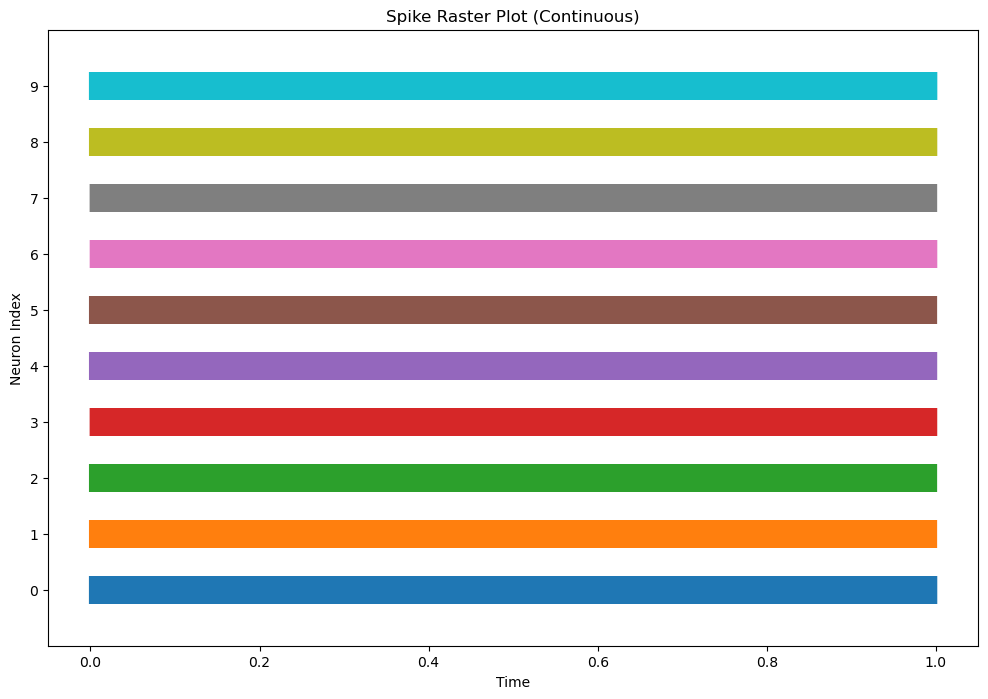

In [21]:
raster_plot(spike_train, colors=None, linelengths=None, figsize=(12,8))

In [22]:
binary_spikes = spikes_to_binary(spike_train, num_neurons, time)
multi_rate_binary_spikes = spikes_to_binary(multi_rate_spike_train, num_neurons, time)
perturbed_rate_binary_spikes = spikes_to_binary(perturbed_rate_spike_train, num_neurons, time)

In [23]:
spike_count = count_spikes(binary_spikes)
count = np.array(spike_count)
# print(count)
# print(count.shape)
multi_rate_spike_count = count_spikes(multi_rate_binary_spikes)
multi_rate_count = np.array(multi_rate_spike_count)

perturbed_rate_spike_count = count_spikes(perturbed_rate_binary_spikes)
perturbed_rate_count = np.array(perturbed_rate_spike_count)

In [24]:
random_indices = np.random.choice(count.shape[0], size=5, replace=False)  # No duplicates
random_samples = count[random_indices]  # Shape: (5, neurons, time)

Getting spike trains from excitatory and inhibitory neurons, then counting the spikes.

In [26]:
# results = sim(params["g"], params["nu_ext_over_nu_thr"], params["t_range"][1] * ms, ax_spikes, ax_rates, params["rate_tick_step"], num_neurons, num_samples)
results = sim(N_E, epsilon, g, nu_ext_over_nu_thr, time, num_neurons, num_samples)

raw_excitatory_spike_trains = results['excitatory']['spike_trains']
raw_inhibitory_spike_trains = results['inhibitory']['spike_trains']
# print(raw_excitatory_spike_trains)

In [27]:
save_spike_trains(raw_excitatory_spike_trains, "spike_trains_ex.json")
loaded_spike_trains_ex = load_spike_trains("spike_trains_ex.json")

save_spike_trains(raw_inhibitory_spike_trains, "spike_trains_in.json")
loaded_spike_trains_in = load_spike_trains("spike_trains_in.json")

Spike trains saved to spike_trains_ex.json
Spike trains saved to spike_trains_in.json


In [28]:
excitatory_spike_trains = standardize_units(raw_excitatory_spike_trains)
inhibitory_spike_trains = standardize_units(raw_inhibitory_spike_trains)

#print(excitatory_spike_trains[0])
#print(inhibitory_spike_trains[0])

In [29]:
#first_spike_ex = find_nth_earliest_spike(excitatory_spike_trains, n=2)
#first_spike_in = find_nth_earliest_spike(inhibitory_spike_trains, n=2)

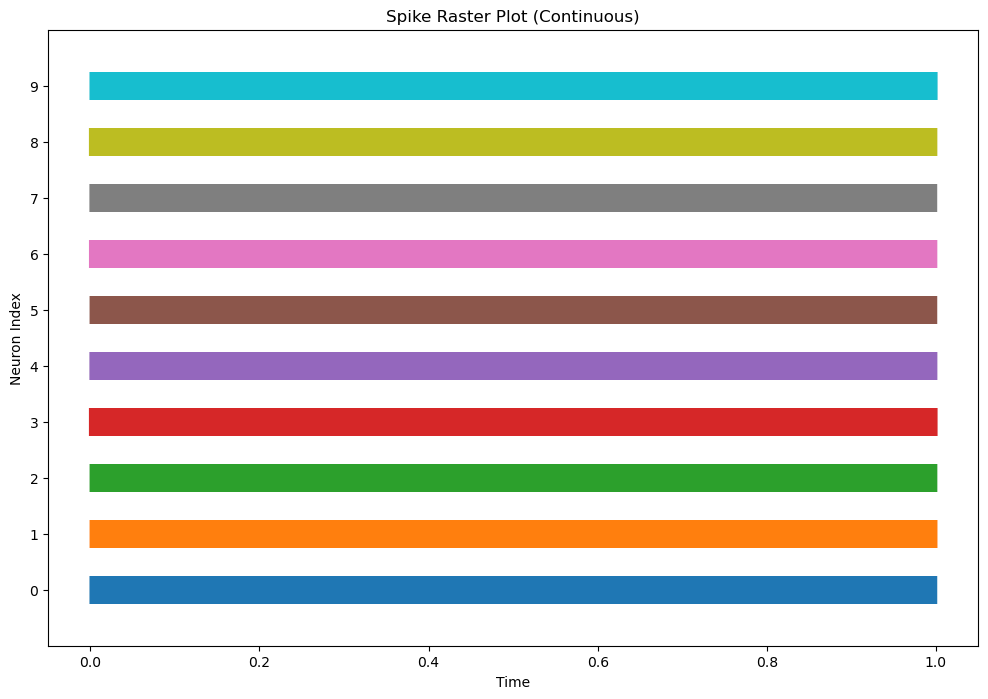

In [30]:
raster_plot(excitatory_spike_trains, colors=None, linelengths=None, figsize=(12,8))

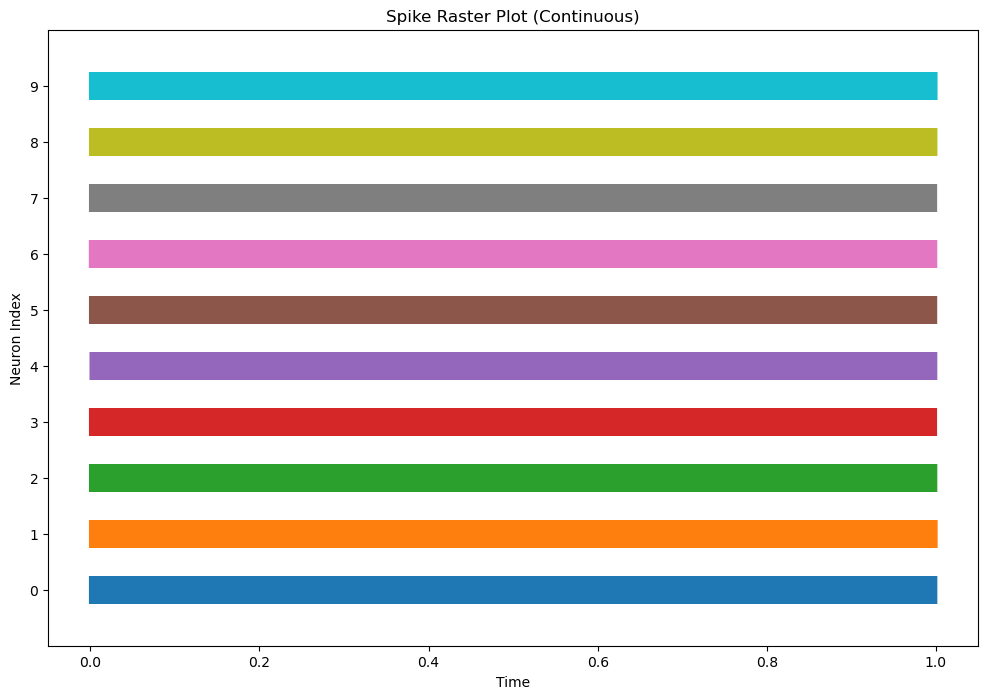

In [31]:
raster_plot(inhibitory_spike_trains, colors=None, linelengths=None, figsize=(12,8))

In [32]:
binary_ex_spikes = spikes_to_binary(excitatory_spike_trains, num_neurons, time)
binary_in_spikes = spikes_to_binary(inhibitory_spike_trains, num_neurons, time)
# print(binary_ex_spikes[0][0]) # first sample of first neuron

In [33]:
spike_count_ex = count_spikes(binary_ex_spikes)
count_ex = np.array(spike_count_ex)
#print(spike_count_ex[0])
#print(count_ex[0])
#print(count_ex[1])
#print(count_ex.shape)

spike_count_in = count_spikes(binary_in_spikes)
count_in = np.array(spike_count_in)
#print(count_in.shape)

In [34]:
random_indices_ex = np.random.choice(count_ex.shape[0], size=5, replace=False)  # No duplicates
random_samples_ex = count_ex[random_indices_ex]  # Shape: (5, neurons, time)

random_indices_in = np.random.choice(count_in.shape[0], size=5, replace=False)  # No duplicates
random_samples_in = count_in[random_indices_in]  # Shape: (5, neurons, time)

Theoretical and Empirical stats of raw counts.

In [36]:
# empirical_mean = empirical_means(count) # np.mean(count, axis=0), count.mean(axis=0)
empirical_mean = count.mean(axis=0)
#print(empirical_mean.shape)
count_rate = empirical_mean[:, -1]
#print(count_rate.shape)
#print(empirical_mean)
#print(empirical_mean.shape)
#print(count_rate)

# empirical_std_dev = std_dev_empirical_mean(empirical_mean, num_samples, count)
empirical_std_dev = np.sqrt(empirical_mean) #count.std(axis=0, ddof=1)
# empirical_std_dev = (count.std(axis=0)) #newly added, should be the same but isn't
# i fixed the above by using empirical_std_dev = (count.std(axis=0, ddof=1))
#print(empirical_std_dev)
#print(empirical_std_dev.shape)

empirical_lower_bound, empirical_upper_bound = confidence_intervals(empirical_mean, empirical_std_dev, num_samples, confidence_level=0.95)
# print(empirical_lower_bound)
# print(empirical_upper_bound)

In [37]:
multi_rate_empirical_mean = multi_rate_count.mean(axis=0)
multi_rate_count_rate = multi_rate_empirical_mean[:, -1]
multi_rate_empirical_std_dev = np.sqrt(multi_rate_empirical_mean) #count.std(axis=0, ddof=1)

multi_rate_empirical_lower_bound, multi_rate_empirical_upper_bound = confidence_intervals(multi_rate_empirical_mean, multi_rate_empirical_std_dev, num_samples, confidence_level=0.95)

In [38]:
perturbed_rate_empirical_mean = perturbed_rate_count.mean(axis=0)
perturbed_rate_count_rate = perturbed_rate_empirical_mean[:, -1]
perturbed_rate_empirical_std_dev = np.sqrt(perturbed_rate_empirical_mean) #count.std(axis=0, ddof=1)

perturbed_rate_empirical_lower_bound, perturbed_rate_empirical_upper_bound = confidence_intervals(perturbed_rate_empirical_mean, perturbed_rate_empirical_std_dev, num_samples, confidence_level=0.95)

In [39]:
exclude_times, global_exclude = last_zero_std_time(empirical_std_dev, verbose=True)

Neuron 0: last zero std at t=-1, recommended exclude=0
Neuron 1: last zero std at t=-1, recommended exclude=0
Neuron 2: last zero std at t=-1, recommended exclude=0
Neuron 3: last zero std at t=-1, recommended exclude=0
Neuron 4: last zero std at t=-1, recommended exclude=0
Neuron 5: last zero std at t=-1, recommended exclude=0
Neuron 6: last zero std at t=-1, recommended exclude=0
Neuron 7: last zero std at t=-1, recommended exclude=0
Neuron 8: last zero std at t=-1, recommended exclude=0
Neuron 9: last zero std at t=-1, recommended exclude=0

Global exclude (safest): t=0


In [40]:
multi_rate_exclude_times, multi_rate_global_exclude = last_zero_std_time(multi_rate_empirical_std_dev, verbose=True)

Neuron 0: last zero std at t=-1, recommended exclude=0
Neuron 1: last zero std at t=-1, recommended exclude=0
Neuron 2: last zero std at t=-1, recommended exclude=0
Neuron 3: last zero std at t=-1, recommended exclude=0
Neuron 4: last zero std at t=-1, recommended exclude=0
Neuron 5: last zero std at t=-1, recommended exclude=0
Neuron 6: last zero std at t=-1, recommended exclude=0
Neuron 7: last zero std at t=-1, recommended exclude=0
Neuron 8: last zero std at t=-1, recommended exclude=0
Neuron 9: last zero std at t=-1, recommended exclude=0

Global exclude (safest): t=0


In [41]:
perturbed_rate_exclude_times, perturbed_rate_global_exclude = last_zero_std_time(perturbed_rate_empirical_std_dev, verbose=True)

Neuron 0: last zero std at t=-1, recommended exclude=0
Neuron 1: last zero std at t=-1, recommended exclude=0
Neuron 2: last zero std at t=-1, recommended exclude=0
Neuron 3: last zero std at t=-1, recommended exclude=0
Neuron 4: last zero std at t=-1, recommended exclude=0
Neuron 5: last zero std at t=-1, recommended exclude=0
Neuron 6: last zero std at t=-1, recommended exclude=0
Neuron 7: last zero std at t=-1, recommended exclude=0
Neuron 8: last zero std at t=-1, recommended exclude=0
Neuron 9: last zero std at t=-1, recommended exclude=0

Global exclude (safest): t=0


In [42]:
theoretical_means = calculate_theoretical_mean(count_rate, time)
#print(theoretical_means)
#print(theoretical_means.shape)

theoretical_std_dev = calculate_theoretical_std_dev(theoretical_means)
#print(theoretical_std_dev)
#print(theoretical_std_dev.shape)

theoretical_lower_bound, theoretical_upper_bound = confidence_intervals(theoretical_means, theoretical_std_dev, num_samples, confidence_level=0.95)
# print(theoretical_lower_bound)
# print(theoretical_upper_bound)

In [43]:
multi_rate_theoretical_means = calculate_theoretical_mean(multi_rate_count_rate, time)
multi_rate_theoretical_std_dev = calculate_theoretical_std_dev(multi_rate_theoretical_means)

multi_rate_theoretical_lower_bound, multi_rate_theoretical_upper_bound = confidence_intervals(multi_rate_theoretical_means, multi_rate_theoretical_std_dev, num_samples, confidence_level=0.95)

In [44]:
perturbed_rate_theoretical_means = calculate_theoretical_mean(perturbed_rate_count_rate, time)
perturbed_rate_theoretical_std_dev = calculate_theoretical_std_dev(perturbed_rate_theoretical_means)

perturbed_rate_theoretical_lower_bound, perturbed_rate_theoretical_upper_bound = confidence_intervals(perturbed_rate_theoretical_means, perturbed_rate_theoretical_std_dev, num_samples, confidence_level=0.95)

In [45]:
res_var = variance_of_residuals(empirical_mean, theoretical_means)
#print(res_var)

In [46]:
centers = center_counts_loop(count, theoretical_means, num_samples, num_neurons)

centers_mean = np.mean(centers, axis = 0)
centers_std_dev = np.std(centers, axis = 0, ddof = 1)

centers_emp = center_counts_loop(count, empirical_mean, num_samples, num_neurons)

centers_mean_emp = np.mean(centers_emp, axis = 0)
centers_std_dev_emp = np.std(centers_emp, axis = 0, ddof = 1)

In [47]:
multi_rate_centers = center_counts_loop(multi_rate_count, theoretical_means, num_samples, num_neurons)
# multi_rate_centers = center_counts_loop(multi_rate_count, multi_rate_theoretical_means, num_samples, num_neurons)

multi_rate_centers_mean = np.mean(multi_rate_centers, axis = 0)
multi_rate_centers_std_dev = np.std(multi_rate_centers, axis = 0, ddof = 1)

multi_rate_centers_emp = center_counts_loop(multi_rate_count, empirical_mean, num_samples, num_neurons)
# multi_rate_centers_emp = center_counts_loop(multi_rate_count, multi_rate_empirical_mean, num_samples, num_neurons)

multi_rate_centers_mean_emp = np.mean(multi_rate_centers_emp, axis = 0)
multi_rate_centers_std_dev_emp = np.std(multi_rate_centers_emp, axis = 0, ddof = 1)

In [48]:
perturbed_rate_centers = center_counts_loop(perturbed_rate_count, theoretical_means, num_samples, num_neurons)
# perturbed_rate_centers = center_counts_loop(perturbed_rate_count, perturbed_rate_theoretical_means, num_samples, num_neurons)

perturbed_rate_centers_mean = np.mean(perturbed_rate_centers, axis = 0)
perturbed_rate_centers_std_dev = np.std(perturbed_rate_centers, axis = 0, ddof = 1)

perturbed_rate_centers_emp = center_counts_loop(perturbed_rate_count, empirical_mean, num_samples, num_neurons)
#perturbed_rate_centers_emp = center_counts_loop(perturbed_rate_count, perturbed_rate_empirical_mean, num_samples, num_neurons)

perturbed_rate_centers_mean_emp = np.mean(perturbed_rate_centers_emp, axis = 0)
perturbed_rate_centers_std_dev_emp = np.std(perturbed_rate_centers_emp, axis = 0, ddof = 1)

Poisson Standardization 

In [50]:
stands = standardize_counts_loop(count, theoretical_means, theoretical_std_dev, num_samples, num_neurons, exclude = 1)
#print(stands)
#print(stands.shape)
# we removed the very first time point for this dataset

stands_emp = standardize_counts_loop(count, empirical_mean, empirical_std_dev, num_samples, num_neurons, global_exclude)
#print(stands_emp)
# cleaned_stands_emp = stands_emp[:, ~np.isnan(stands_emp).all(axis=0)]

#print(stands_emp.shape)
# we need to remove a few of the first time points for this dataset

# WHENEVER WE CHANGE TIME, WE NEED TO HAVE IT BE KNOWN, 

# when i do covariance, i should reshape from num_samples, num_neurons, time , assume poisson but not assume independent, the variance and covariance should be equal
# time to something with time as replicate. replicate (num_samples) times time in dimension, num_neurons
# covariance, num_neurons by num_neurons, data to produce this should be num_samples times num_neurons
# reformat the current matrix, use reshape with the matrix, maybe with loops 

standardized_mean_global = np.mean(stands)
standardized_std_global = np.std(stands)

standardized_mean_emp_global = np.mean(stands_emp)
standardized_std_emp_global = np.std(stands_emp)

standardized_mean = np.mean(stands, axis=0)
standardized_std = np.std(stands, axis=0, ddof = 1)

standardized_mean_emp = np.mean(stands_emp, axis = 0)
standardized_std_emp = np.std(stands_emp, axis = 0, ddof = 1)

In [51]:
has_negatives = np.any(stands < 0)
print(f"Array has negative numbers: {has_negatives}")
# this is why log-likelihood doesn't like me

Array has negative numbers: True


In [52]:
multi_rate_stands = standardize_counts_loop(multi_rate_count, theoretical_means, theoretical_std_dev, num_samples, num_neurons, exclude = 1)
# multi_rate_stands = standardize_counts_loop(multi_rate_count, multi_rate_theoretical_means, multi_rate_theoretical_std_dev, num_samples, num_neurons, exclude = 1)
# standardize relative to theoretical means is above

## from Alex: for multirate, standardize relative to theoretical means and empirical means ##

multi_rate_stands_emp = standardize_counts_loop(multi_rate_count, empirical_mean, empirical_std_dev, num_samples, num_neurons, multi_rate_global_exclude)
# multi_rate_stands_emp = standardize_counts_loop(multi_rate_count, multi_rate_empirical_mean, multi_rate_empirical_std_dev, num_samples, num_neurons, multi_rate_global_exclude)
# standardize relative to empirical means is above

multi_rate_standardized_mean_global = np.mean(multi_rate_stands)
multi_rate_standardized_std_global = np.std(multi_rate_stands)

multi_rate_standardized_mean_emp_global = np.mean(multi_rate_stands_emp)
multi_rate_standardized_std_emp_global = np.std(multi_rate_stands_emp)

multi_rate_standardized_mean = np.mean(multi_rate_stands, axis=0)
multi_rate_standardized_std = np.std(multi_rate_stands, axis=0, ddof = 1)

multi_rate_standardized_mean_emp = np.mean(multi_rate_stands_emp, axis = 0)
multi_rate_standardized_std_emp = np.std(multi_rate_stands_emp, axis = 0, ddof = 1)

In [53]:
perturbed_rate_stands = standardize_counts_loop(perturbed_rate_count, theoretical_means, theoretical_std_dev, num_samples, num_neurons, exclude = 1)
# perturbed_rate_stands = standardize_counts_loop(perturbed_rate_count, perturbed_rate_theoretical_means, perturbed_rate_theoretical_std_dev, num_samples, num_neurons, exclude = 1)
# standardize relative to theoretical means is above

## from Alex: for perturbation, standardize relative to theoretical means and empirical means ##
# these only gets used later in the cov matrix, it doesn't appear in plot_stats

perturbed_rate_stands_emp = standardize_counts_loop(perturbed_rate_count, empirical_mean, empirical_std_dev, num_samples, num_neurons, perturbed_rate_global_exclude)
# perturbed_rate_stands_emp = standardize_counts_loop(perturbed_rate_count, perturbed_rate_empirical_mean, perturbed_rate_empirical_std_dev, num_samples, num_neurons, perturbed_rate_global_exclude)
# standardize relative to empirical means is above
# this only gets used later in the cov matrix, it doesn't appear in plot_stats

perturbed_rate_standardized_mean_global = np.mean(perturbed_rate_stands)
perturbed_rate_standardized_std_global = np.std(perturbed_rate_stands)

perturbed_rate_standardized_mean_emp_global = np.mean(perturbed_rate_stands_emp)
perturbed_rate_standardized_std_emp_global = np.std(perturbed_rate_stands_emp)

perturbed_rate_standardized_mean = np.mean(perturbed_rate_stands, axis=0)
perturbed_rate_standardized_std = np.std(perturbed_rate_stands, axis=0, ddof = 1)

perturbed_rate_standardized_mean_emp = np.mean(perturbed_rate_stands_emp, axis = 0)
perturbed_rate_standardized_std_emp = np.std(perturbed_rate_stands_emp, axis = 0, ddof = 1)

In [54]:
## Then try the 3rd option: center with their own mean, scale by the null std.  ##
# Only empirical here
multi_rate_stands_emp_test = standardize_counts_loop(multi_rate_count, multi_rate_empirical_mean, empirical_std_dev, num_samples, num_neurons, multi_rate_global_exclude)

multi_rate_standardized_mean_emp_test = np.mean(multi_rate_stands_emp_test, axis = 0)
multi_rate_standardized_std_emp_test = np.std(multi_rate_stands_emp_test, axis = 0, ddof = 1)


perturbed_rate_stands_emp_test = standardize_counts_loop(perturbed_rate_count, perturbed_rate_empirical_mean, empirical_std_dev, num_samples, num_neurons, perturbed_rate_global_exclude)

perturbed_rate_standardized_mean_emp_test = np.mean(perturbed_rate_stands_emp_test, axis = 0)
perturbed_rate_standardized_std_emp_test = np.std(perturbed_rate_stands_emp_test, axis = 0, ddof = 1)

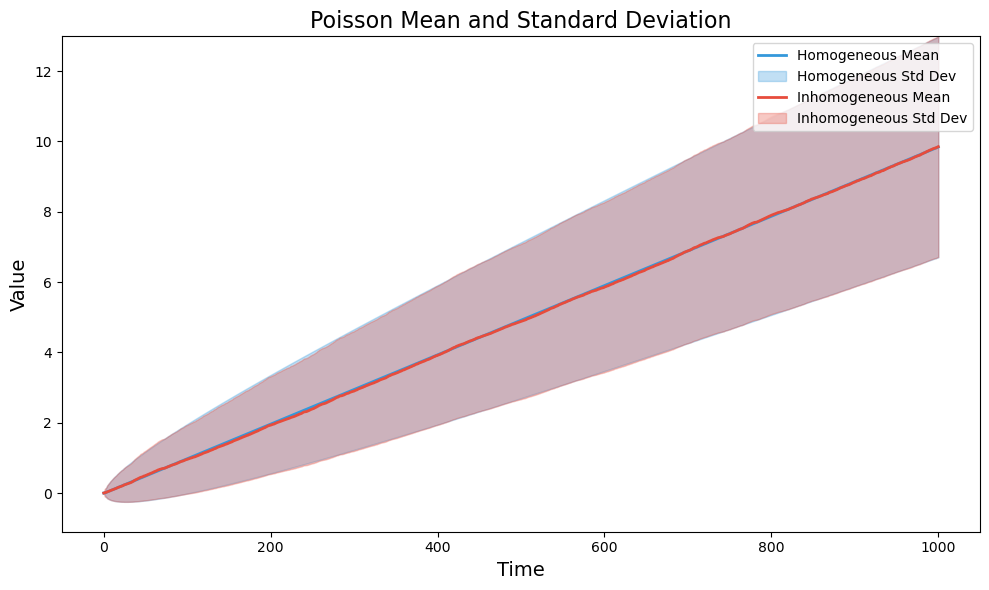

In [55]:
plot_stats(theoretical_means, empirical_mean, theoretical_std_dev, empirical_std_dev, title = 'Poisson Mean and Standard Deviation', show_hline=False, data_type='standardized')

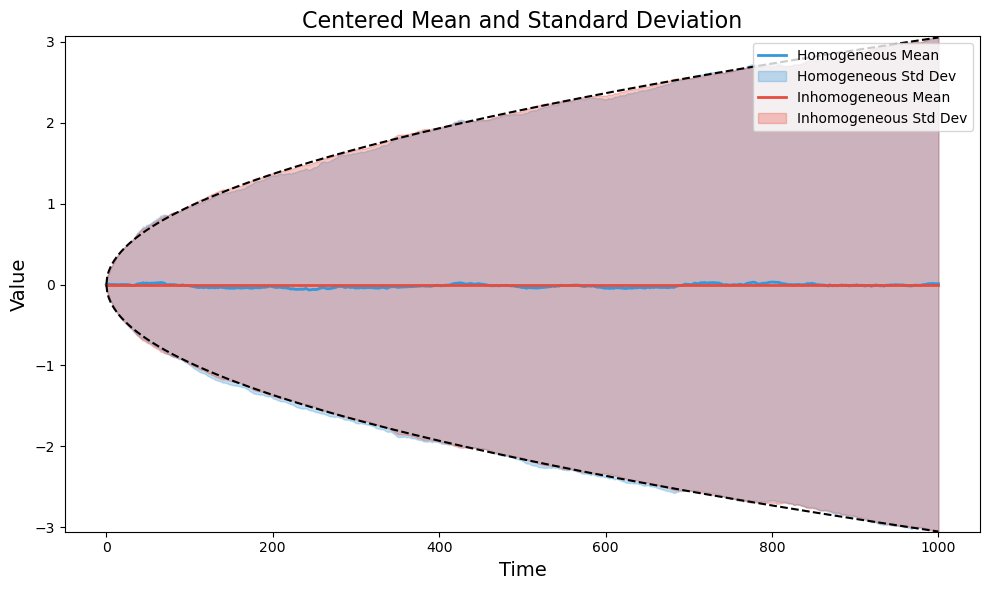

In [56]:
plot_stats(centers_mean, centers_mean_emp, centers_std_dev, centers_std_dev_emp, title = 'Centered Mean and Standard Deviation', show_hline=True, data_type='centered')

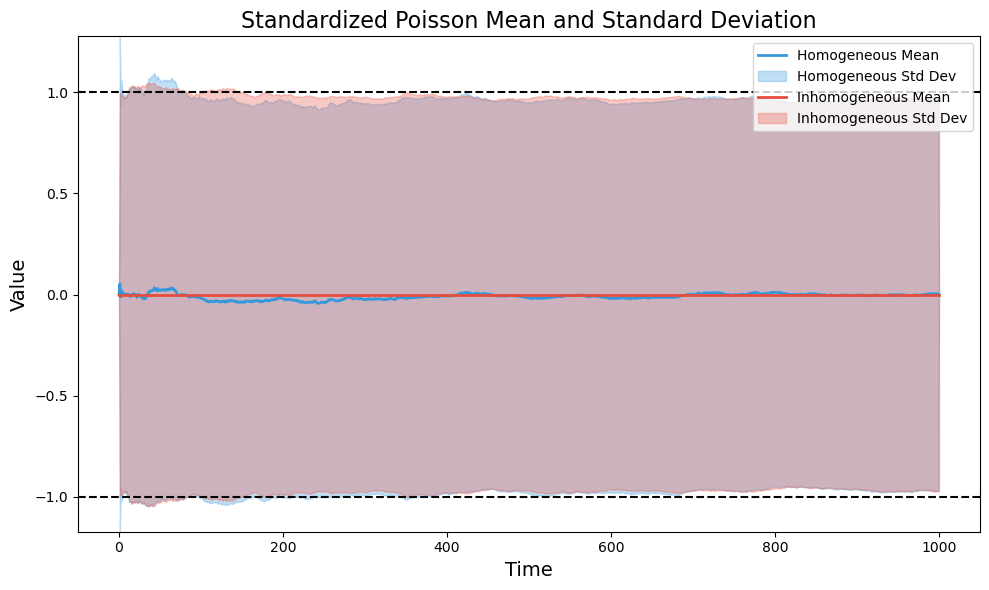

In [57]:
plot_stats(standardized_mean, standardized_mean_emp, standardized_std, standardized_std_emp, title = 'Standardized Poisson Mean and Standard Deviation', show_hline=True, data_type='standardized')

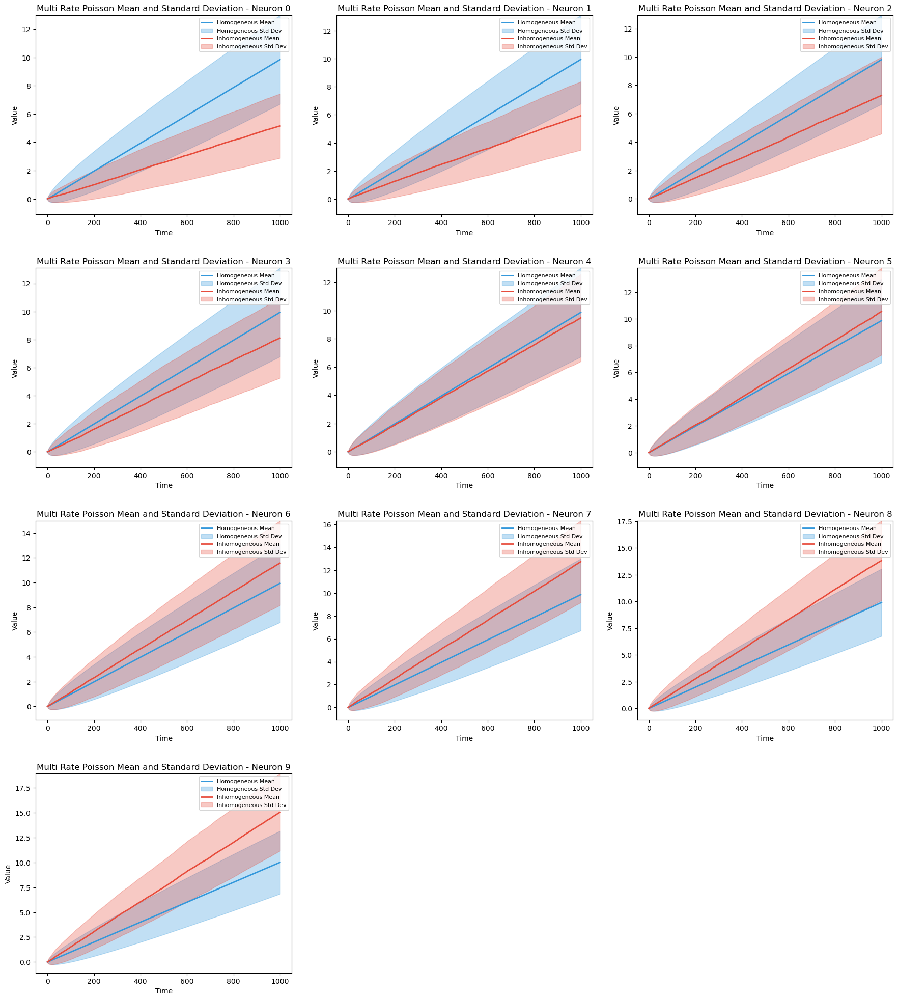

In [58]:
plot_multiple_stats(theoretical_means, multi_rate_empirical_mean, theoretical_std_dev, multi_rate_empirical_std_dev, title = 'Multi Rate Poisson Mean and Standard Deviation', show_hline=False, data_type='standardized')
# plot_multiple_stats(multi_rate_theoretical_means, multi_rate_empirical_mean, multi_rate_theoretical_std_dev, multi_rate_empirical_std_dev, title = 'Multi Rate Poisson Mean and Standard Deviation')
# Note in presentation highlight the difference y axis values between plots. For more precise plots we can go with isoclines.
# Aka lines with fixed probabilities

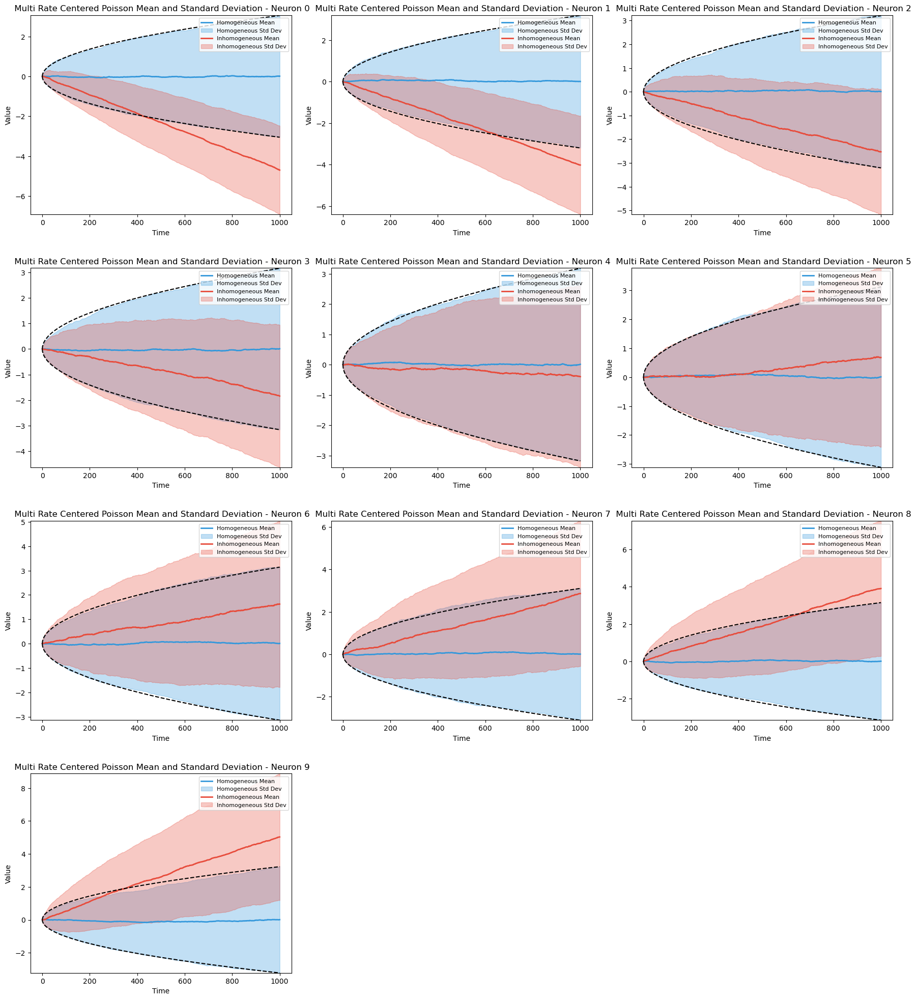

In [59]:
plot_multiple_stats(centers_mean, multi_rate_centers_mean_emp, centers_std_dev, multi_rate_centers_std_dev_emp, title = ' Multi Rate Centered Poisson Mean and Standard Deviation', show_hline=True, data_type='centered')
# plot_multiple_stats(multi_rate_centers_mean, multi_rate_centers_mean_emp, multi_rate_centers_std_dev, multi_rate_centers_std_dev_emp, title = ' Multi Rate Centered Poisson Mean and Standard Deviation')
# Note in presentation highlight the difference y axis values between plots

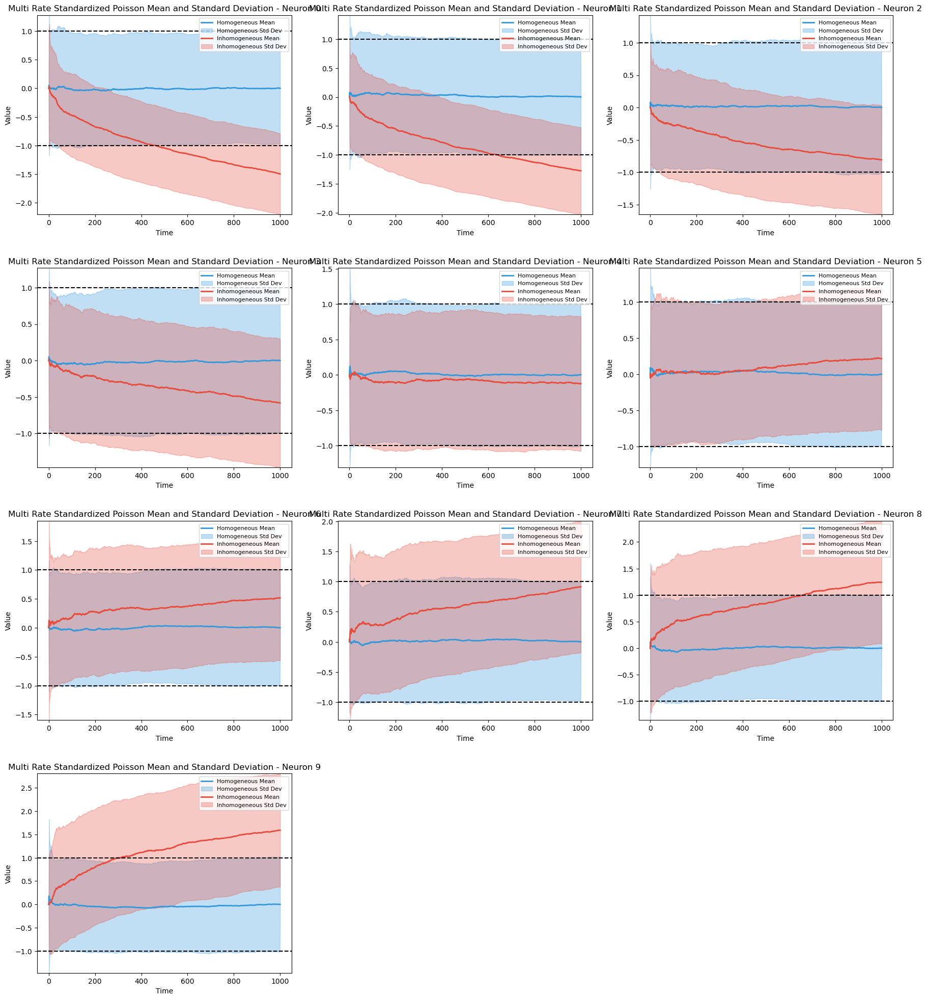

In [60]:
plot_multiple_stats(standardized_mean, multi_rate_standardized_mean_emp, standardized_std, multi_rate_standardized_std_emp, title = 'Multi Rate Standardized Poisson Mean and Standard Deviation', show_hline=True, data_type='standardized')
# plot_multiple_stats(multi_rate_standardized_mean, multi_rate_standardized_mean_emp, multi_rate_standardized_std, multi_rate_standardized_std_emp, title = 'Multi Rate Standardized Poisson Mean and Standard Deviation')
# Note in presentation highlight the difference y axis values between plots

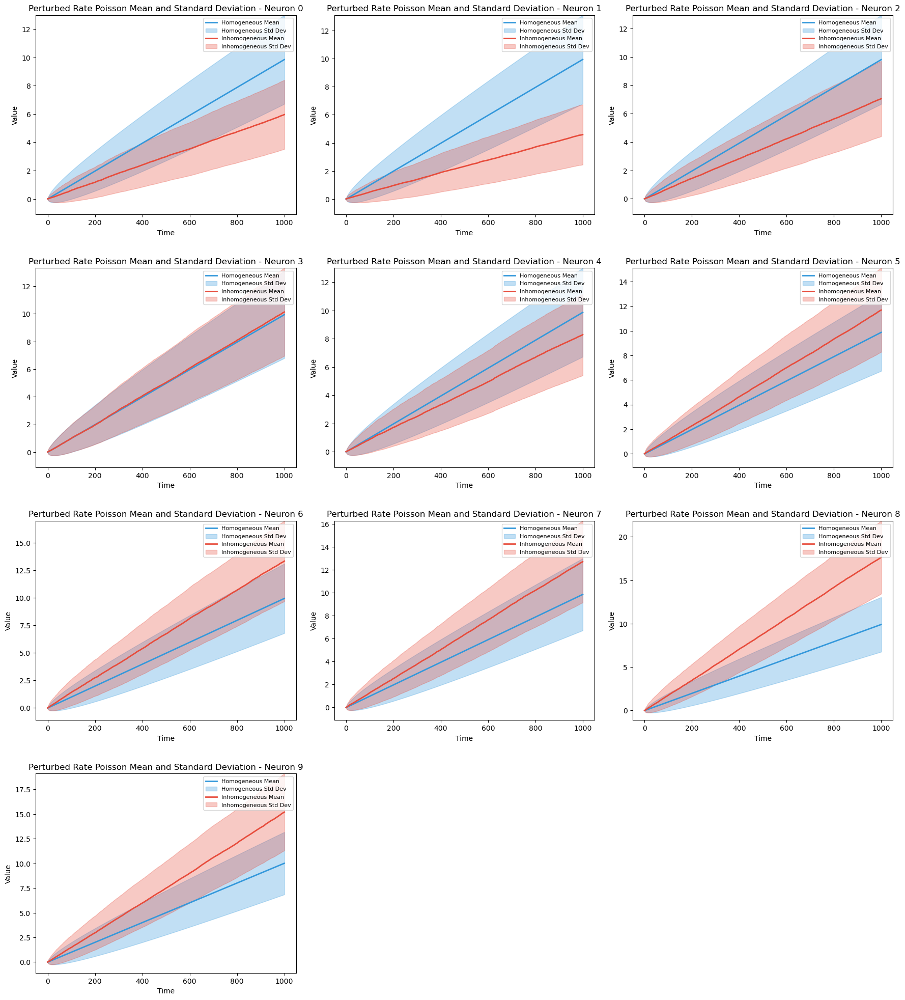

In [61]:
plot_multiple_stats(theoretical_means, perturbed_rate_empirical_mean, theoretical_std_dev, perturbed_rate_empirical_std_dev, title = 'Perturbed Rate Poisson Mean and Standard Deviation', show_hline=False, data_type='standardized')
# plot_multiple_stats(perturbed_rate_theoretical_means, perturbed_rate_empirical_mean, perturbed_rate_theoretical_std_dev, perturbed_rate_empirical_std_dev, title = 'Perturbed Rate Poisson Mean and Standard Deviation')
# Note in presentation highlight the difference y axis values between plots. For more precise plots we can go with isoclines.
# Aka lines with fixed probabilities

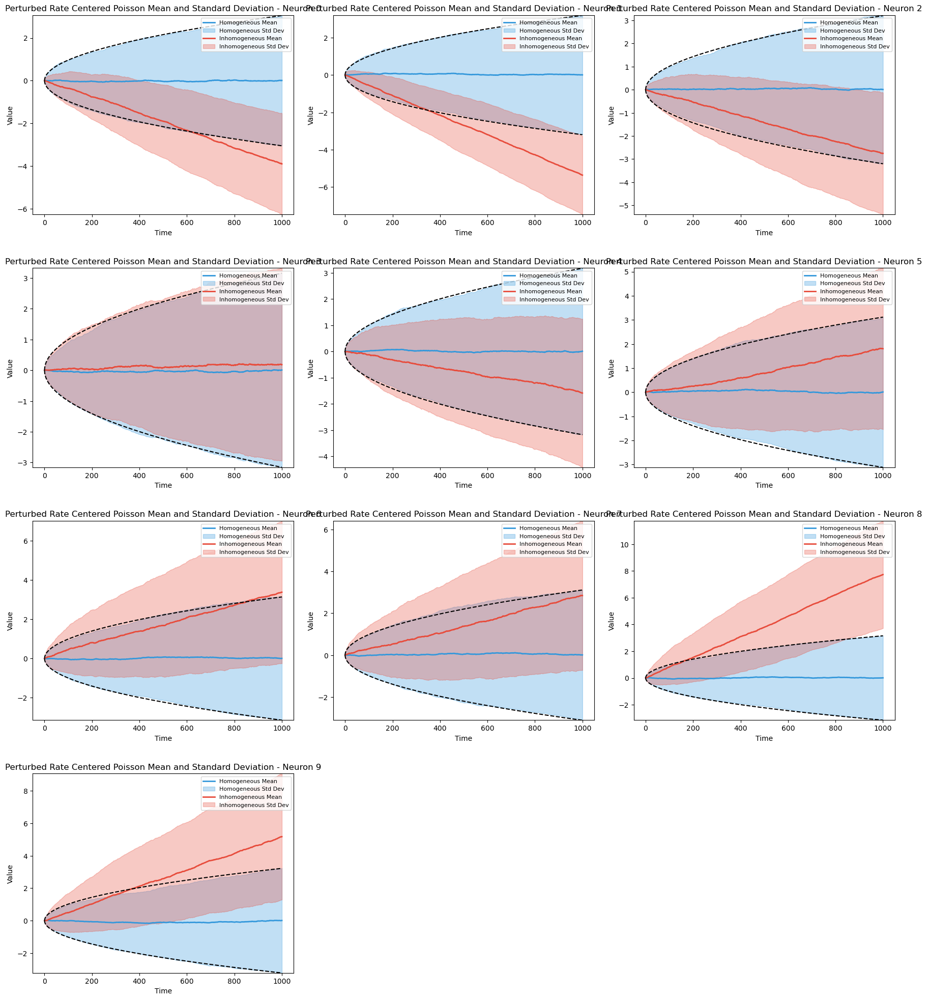

In [62]:
plot_multiple_stats(centers_mean, perturbed_rate_centers_mean_emp, centers_std_dev, perturbed_rate_centers_std_dev_emp, title = 'Perturbed Rate Centered Poisson Mean and Standard Deviation', show_hline=True, data_type='centered')
# plot_multiple_stats(perturbed_rate_centers_mean, perturbed_rate_centers_mean_emp, perturbed_rate_centers_std_dev, perturbed_rate_centers_std_dev_emp, title = 'Perturbed Rate Centered Poisson Mean and Standard Deviation')
# Note in presentation highlight the difference y axis values between plots

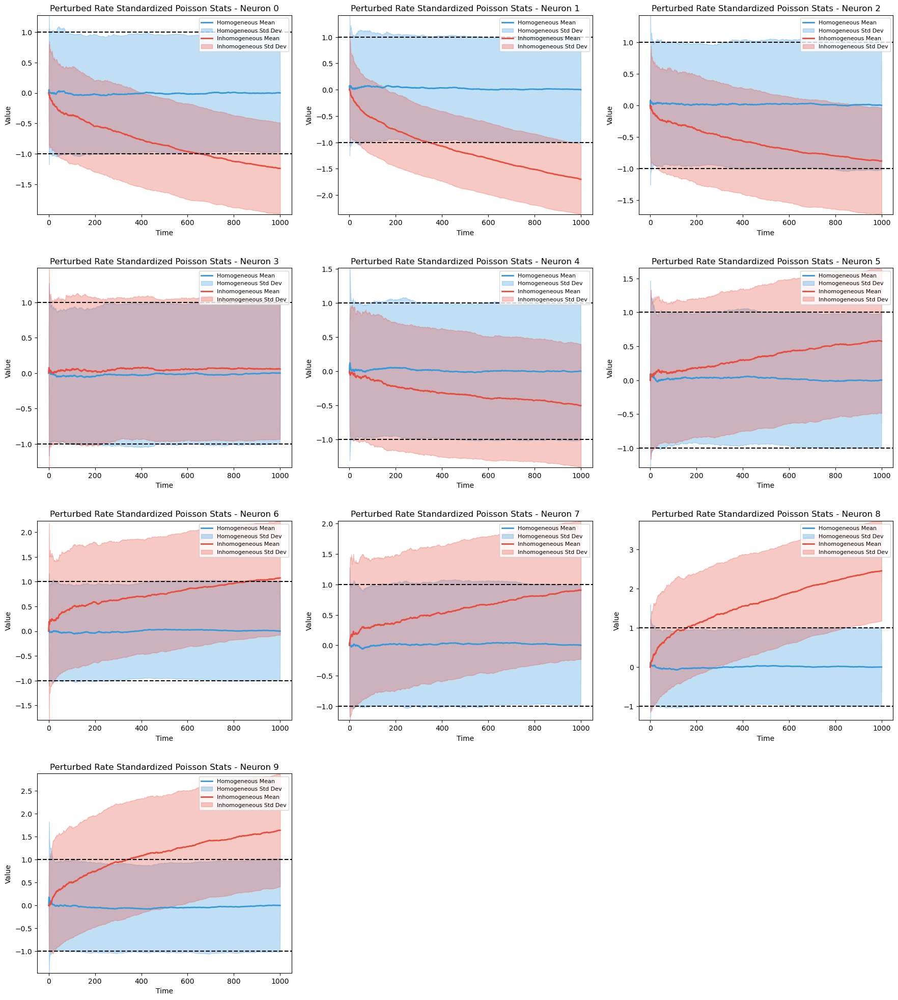

In [63]:
plot_multiple_stats(standardized_mean, perturbed_rate_standardized_mean_emp, standardized_std, perturbed_rate_standardized_std_emp, title = 'Perturbed Rate Standardized Poisson Stats', show_hline=True, data_type='standardized')
# plot_multiple_stats(perturbed_rate_standardized_mean, perturbed_rate_standardized_mean_emp, perturbed_rate_standardized_std, perturbed_rate_standardized_std_emp, title = 'Perturbed Rate Standardized Poisson Mean and Standard Deviation')
# Note in presentation highlight the difference y axis values between plots

center with their own mean, scale by the null std

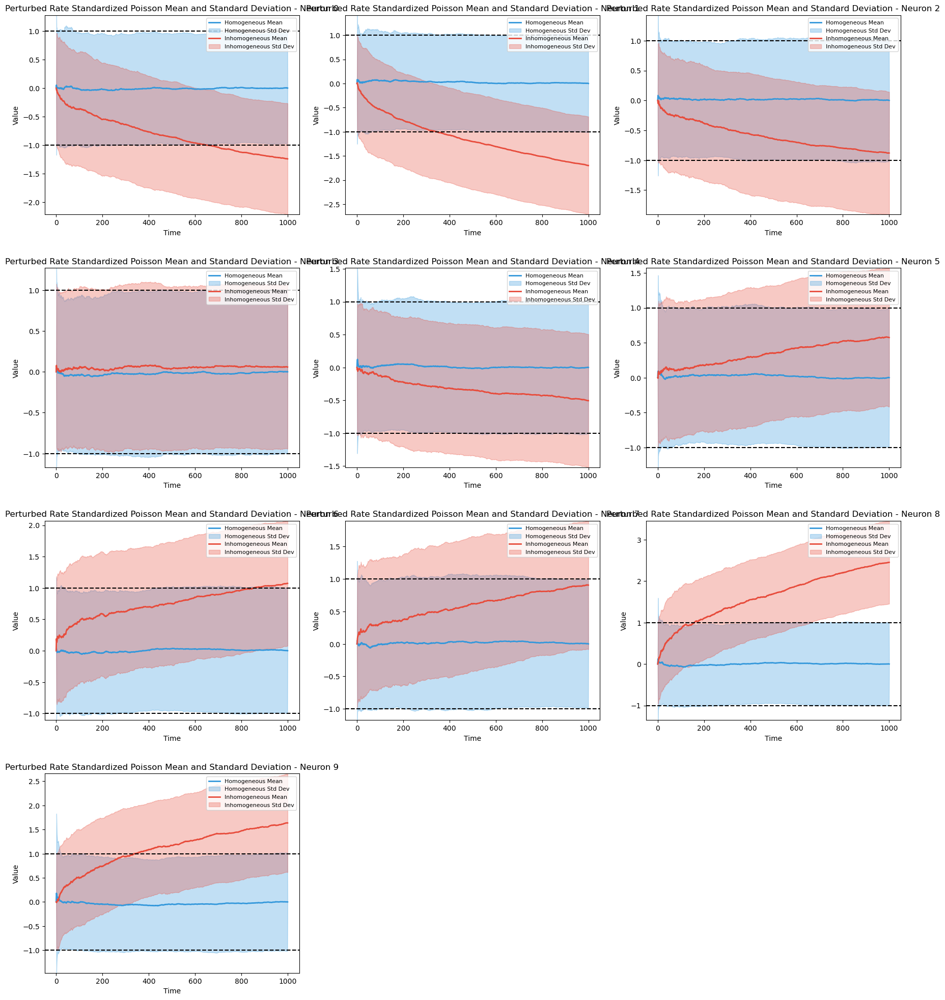

In [65]:
plot_multiple_stats(standardized_mean, perturbed_rate_standardized_mean_emp, standardized_std, standardized_std_emp, title = 'Perturbed Rate Standardized Poisson Mean and Standard Deviation', show_hline=True, data_type='standardized')

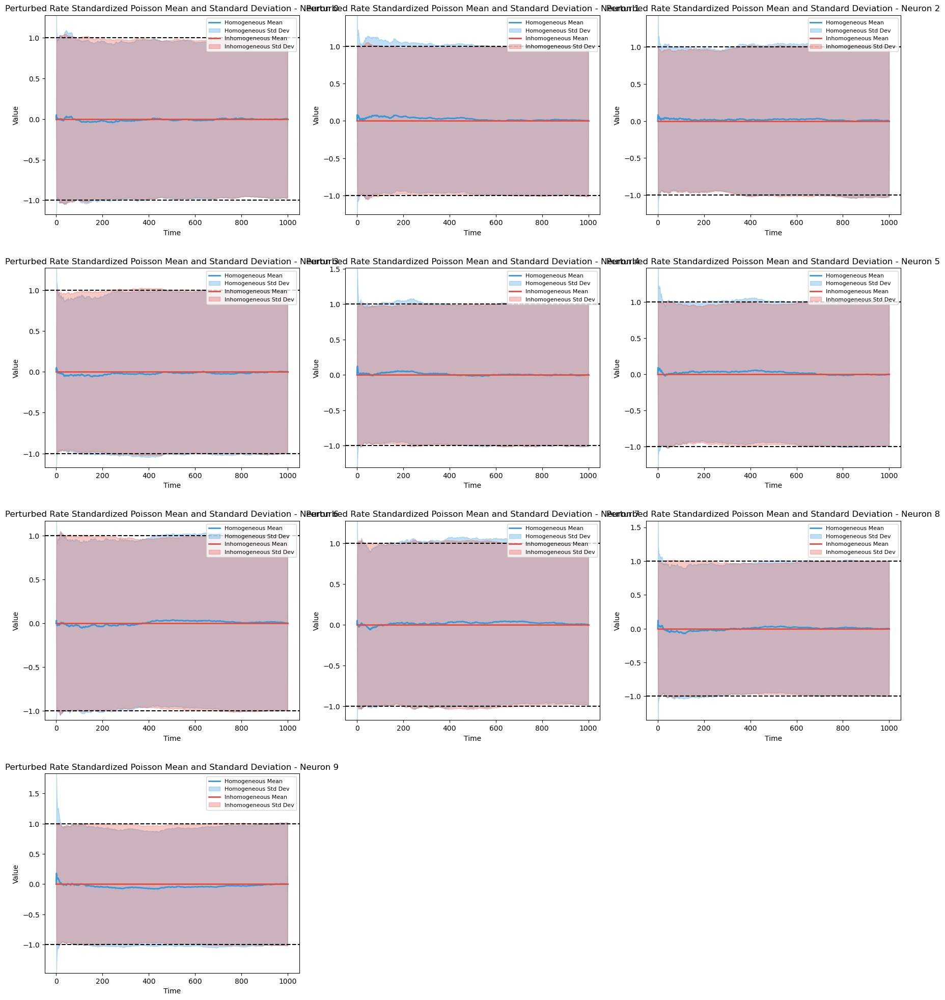

In [66]:
plot_multiple_stats(standardized_mean, perturbed_rate_standardized_mean_emp_test, standardized_std, standardized_std_emp, title = 'Perturbed Rate Standardized Poisson Mean and Standard Deviation', show_hline=True, data_type='standardized')

In [67]:
mean_check = check_mean_with_se(stands, expected_mean=0, confidence=0.95)
#print(mean_check)

mean_check_emp = check_mean_with_se(stands_emp, expected_mean=0, confidence=0.95)
#print(mean_check_emp)

In [68]:
multi_rate_mean_check = check_mean_with_se(multi_rate_stands, expected_mean=0, confidence=0.95)
multi_rate_mean_check_emp = check_mean_with_se(multi_rate_stands_emp, expected_mean=0, confidence=0.95)

In [69]:
perturbed_rate_mean_check = check_mean_with_se(perturbed_rate_stands, expected_mean=0, confidence=0.95)
perturbed_rate_mean_check_emp = check_mean_with_se(perturbed_rate_stands_emp, expected_mean=0, confidence=0.95)

In [70]:
serialized_count = serialize_counts(stands) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count.shape)
#print(np.mean(serialized_count))
t_stat, p_val_mean = stats.ttest_1samp(serialized_count, np.mean(serialized_count))
#print(t_stat)
#print(p_val_mean)

    ## per neuron, check that is it doing per neuron
    ## check assumptions if i'm using count, check for data replicate and check for variables


serialized_count_emp = serialize_counts(stands_emp)
#print(serialized_count_emp.shape)
#print(np.mean(serialized_count_emp))
t_stat_emp, p_val_mean_emp = stats.ttest_1samp(serialized_count, np.mean(serialized_count))
#print(t_stat_emp)
#print(p_val_mean_emp)

In [71]:
multi_rate_serialized_count = serialize_counts(multi_rate_stands) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
multi_rate_t_stat, multi_rate_p_val_mean = stats.ttest_1samp(multi_rate_serialized_count, np.mean(multi_rate_serialized_count))

multi_rate_serialized_count_emp = serialize_counts(multi_rate_stands_emp)

multi_rate_t_stat_emp, multi_rate_p_val_mean_emp = stats.ttest_1samp(multi_rate_serialized_count_emp, np.mean(multi_rate_serialized_count_emp))

In [72]:
perturbed_rate_serialized_count = serialize_counts(perturbed_rate_stands) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
perturbed_rate_t_stat, perturbed_rate_p_val_mean = stats.ttest_1samp(perturbed_rate_serialized_count, np.mean(perturbed_rate_serialized_count))

perturbed_rate_serialized_count_emp = serialize_counts(perturbed_rate_stands_emp)

perturbed_rate_t_stat_emp, perturbed_rate_p_val_mean_emp = stats.ttest_1samp(perturbed_rate_serialized_count_emp, np.mean(perturbed_rate_serialized_count_emp))

In [73]:
#reshaped_stands = np.reshape(stands, (-1, stands.shape[1]), order='F')
# reshaped_stands = stands.transpose(1, 0, 2).reshape(stands.shape[1], -1)
reshaped_stands = np.transpose(stands, (1, 0, 2)).reshape(stands.shape[1], -1)
# transpose_stands = np.transpose(stands, (1, 0, 2))
#print(stands.shape)
#print(reshaped_stands.shape)

#reshaped_stands_emp = np.reshape(stands_emp, (-1, stands_emp.shape[1]), order='F')
# reshaped_stands_emp = stands.transpose(1, 0, 2).reshape(stands_emp.shape[1], -1)
reshaped_stands_emp = np.transpose(stands_emp, (1, 0, 2)).reshape(stands_emp.shape[1], -1)
#print(stands_emp.shape)
#print(reshaped_stands_emp.shape)

In [74]:
multi_rate_reshaped_stands = np.transpose(multi_rate_stands, (1, 0, 2)).reshape(multi_rate_stands.shape[1], -1)
multi_rate_reshaped_stands_emp = np.transpose(multi_rate_stands_emp, (1, 0, 2)).reshape(multi_rate_stands_emp.shape[1], -1)

In [75]:
perturbed_rate_reshaped_stands = np.transpose(perturbed_rate_stands, (1, 0, 2)).reshape(perturbed_rate_stands.shape[1], -1)
perturbed_rate_reshaped_stands_emp = np.transpose(perturbed_rate_stands_emp, (1, 0, 2)).reshape(perturbed_rate_stands_emp.shape[1], -1)

In [76]:
#print(transpose_stands.shape)
#print(transpose_stands[:,:,0])

In [77]:
#print(transpose_stands[:,:,0:3])

In [78]:
#print(reshaped_stands.shape)
#print(reshaped_stands[:,0])

In [79]:
#print(reshaped_stands[:,:5])

In [80]:
#### TESTING #####

In [81]:
test_stand = standardize_per_neuron(count, exclude=global_exclude)


=== Post-standardization checks (excluded t < 0 ) ===
Max |mean|: 1.259e-16 (should be close to 0)
Max |std - 1|: 1.110e-15 (should be close to 0)


In [82]:
#print(test_stand.shape)

In [83]:
cov_matrix = cov_standardized_data(reshaped_stands)
cov_matrix_emp = cov_standardized_data(reshaped_stands_emp)

In [84]:
multi_rate_cov_matrix = cov_standardized_data(multi_rate_reshaped_stands)
multi_rate_cov_matrix_emp = cov_standardized_data(multi_rate_reshaped_stands_emp)

In [85]:
perturbed_rate_cov_matrix = cov_standardized_data(perturbed_rate_reshaped_stands)
perturbed_rate_cov_matrix_emp = cov_standardized_data(perturbed_rate_reshaped_stands_emp)

array([[ 9.53680993e-01, -3.20090376e-03,  3.26398290e-02,
         8.78818947e-03, -3.04816313e-02, -4.84473340e-02,
         4.24682608e-03,  1.32590899e-02, -1.13947909e-02,
        -1.30246651e-03],
       [-3.20090376e-03,  1.01294314e+00, -5.86553924e-03,
         1.24034626e-03,  6.67737706e-03,  5.78401676e-03,
        -4.30286222e-05,  3.46885130e-02,  8.57363196e-03,
         2.93387526e-02],
       [ 3.26398290e-02, -5.86553924e-03,  1.00974804e+00,
        -1.04069214e-02,  1.27115983e-03,  3.04251942e-02,
         2.10461678e-02, -4.41972929e-03, -4.22462965e-03,
         3.33284620e-02],
       [ 8.78818947e-03,  1.24034626e-03, -1.04069214e-02,
         9.82722682e-01,  4.25114583e-02,  1.62451291e-02,
        -5.16269354e-03, -1.14217271e-03, -3.36722514e-02,
        -3.36856212e-03],
       [-3.04816313e-02,  6.67737706e-03,  1.27115983e-03,
         4.25114583e-02,  1.00545584e+00,  2.87368101e-02,
        -8.59196766e-05, -1.27057843e-03, -1.76219889e-03,
         3.

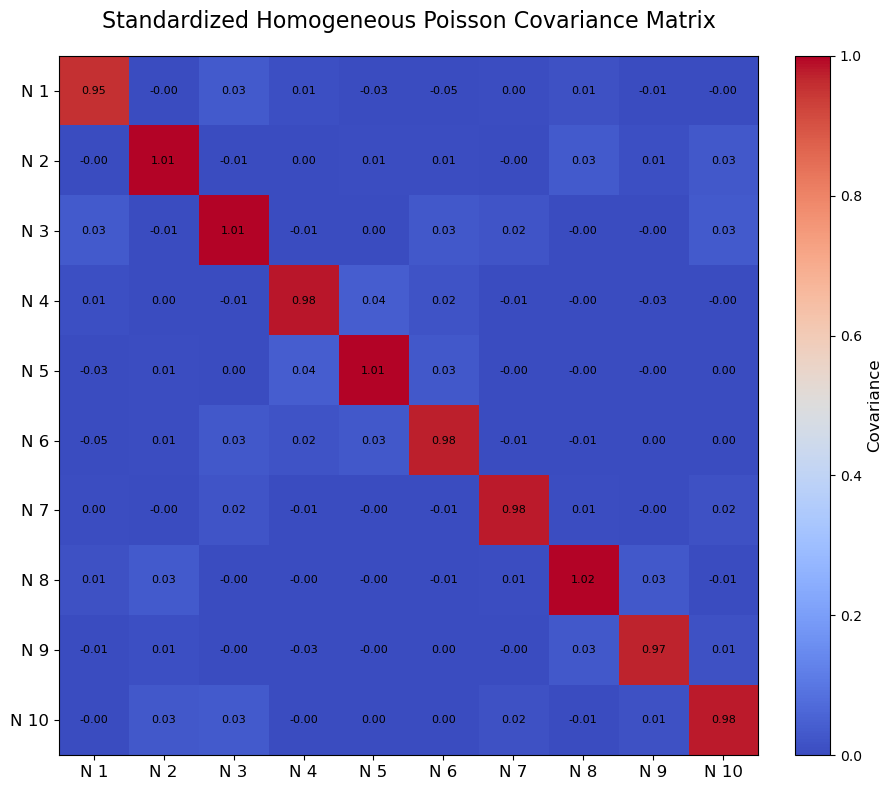

In [86]:
plot_covariance_matrix(cov_matrix, normalize=False, title='Standardized Homogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 9.58493143e-01, -2.68175971e-03,  3.28446941e-02,
         8.70430914e-03, -3.01040459e-02, -4.80404621e-02,
         4.22778049e-03,  1.34150757e-02, -1.16484427e-02,
        -1.68074353e-03],
       [-2.68175971e-03,  9.90994956e-01, -6.35496337e-03,
         1.96919146e-03,  5.78107848e-03,  5.18604623e-03,
         2.28633835e-04,  3.40312823e-02,  8.79416678e-03,
         3.02921330e-02],
       [ 3.28446941e-02, -6.35496337e-03,  9.96487484e-01,
        -1.00298658e-02,  1.10943893e-03,  2.99177421e-02,
         2.08533671e-02, -4.67341493e-03, -4.19958322e-03,
         3.41945478e-02],
       [ 8.70430914e-03,  1.96919146e-03, -1.00298658e-02,
         9.95486024e-01,  4.30171267e-02,  1.67285149e-02,
        -5.16281567e-03, -7.42856688e-04, -3.44791882e-02,
        -4.28977651e-03],
       [-3.01040459e-02,  5.78107848e-03,  1.10943893e-03,
         4.30171267e-02,  9.94724563e-01,  2.82190276e-02,
         1.90619460e-04, -1.37222996e-03, -1.58306519e-03,
         3.

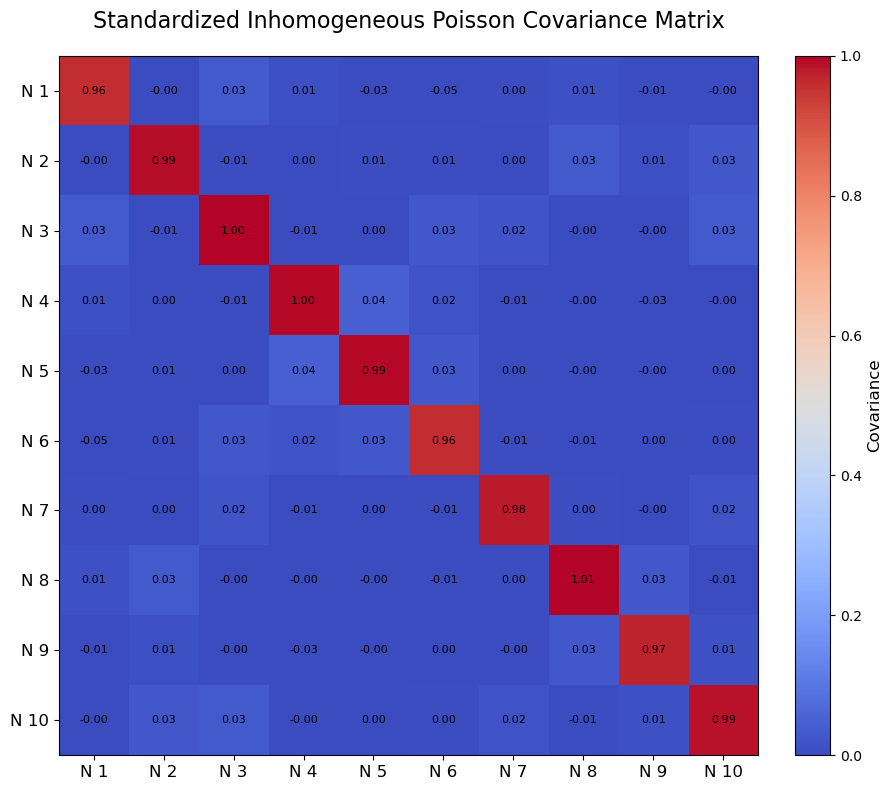

In [87]:
plot_covariance_matrix(cov_matrix_emp, normalize=False, title='Standardized Inhomogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 1.62252613,  0.93391433,  0.60466076,  0.38437578,  0.11566061,
        -0.15124108, -0.38977469, -0.67471291, -0.9247442 , -1.21403808],
       [ 0.93391433,  1.36191971,  0.49992846,  0.35154375,  0.09213068,
        -0.1051047 , -0.33667978, -0.57784557, -0.77049261, -0.97242209],
       [ 0.60466076,  0.49992846,  1.01999435,  0.22161436,  0.0505581 ,
        -0.06218733, -0.2115127 , -0.39663992, -0.49860002, -0.65112633],
       [ 0.38437578,  0.35154375,  0.22161436,  0.95142732,  0.00804844,
        -0.02701245, -0.12191869, -0.2382743 , -0.36113337, -0.43807832],
       [ 0.11566061,  0.09213068,  0.0505581 ,  0.00804844,  0.94831666,
        -0.01178917, -0.01622098, -0.03155975, -0.06440682, -0.14354781],
       [-0.15124108, -0.1051047 , -0.06218733, -0.02701245, -0.01178917,
         0.97440812,  0.03918825,  0.02865689,  0.16039552,  0.16689258],
       [-0.38977469, -0.33667978, -0.2115127 , -0.12191869, -0.01622098,
         0.03918825,  1.29156645,  0.26081365

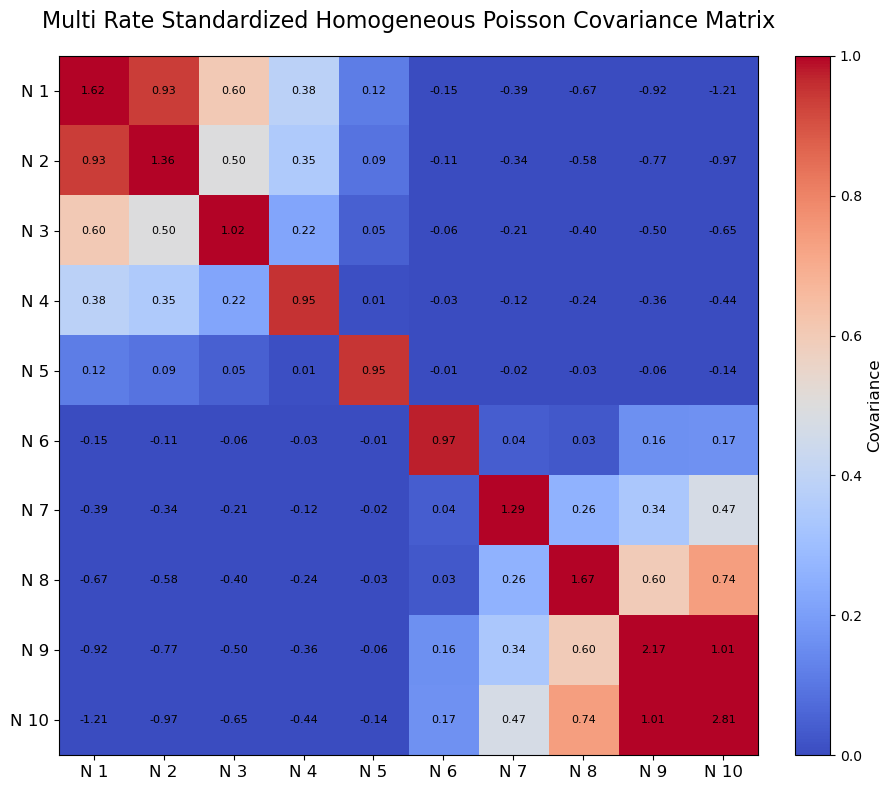

In [88]:
plot_covariance_matrix(multi_rate_cov_matrix, normalize=False, title='Multi Rate Standardized Homogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 1.6118334 ,  0.94381153,  0.61343334,  0.36536808,  0.11972323,
        -0.13630078, -0.3788545 , -0.64865635, -0.91451702, -1.25133836],
       [ 0.94381153,  1.37494282,  0.51864758,  0.34413005,  0.09703484,
        -0.09521613, -0.33490208, -0.56853161, -0.77919322, -1.02674184],
       [ 0.61343334,  0.51864758,  1.024818  ,  0.21742228,  0.05393966,
        -0.05573789, -0.21113766, -0.3919357 , -0.50634546, -0.68972888],
       [ 0.36536808,  0.34413005,  0.21742228,  0.95100409,  0.00829705,
        -0.02011585, -0.11282038, -0.22036235, -0.34576875, -0.43634497],
       [ 0.11972323,  0.09703484,  0.05393966,  0.00829705,  0.93975079,
        -0.01064822, -0.01778586, -0.0328303 , -0.06874993, -0.15309761],
       [-0.13630078, -0.09521613, -0.05573789, -0.02011585, -0.01064822,
         0.95790162,  0.03247846,  0.01818032,  0.14729004,  0.1550233 ],
       [-0.3788545 , -0.33490208, -0.21113766, -0.11282038, -0.01778586,
         0.03247846,  1.29238501,  0.24792499

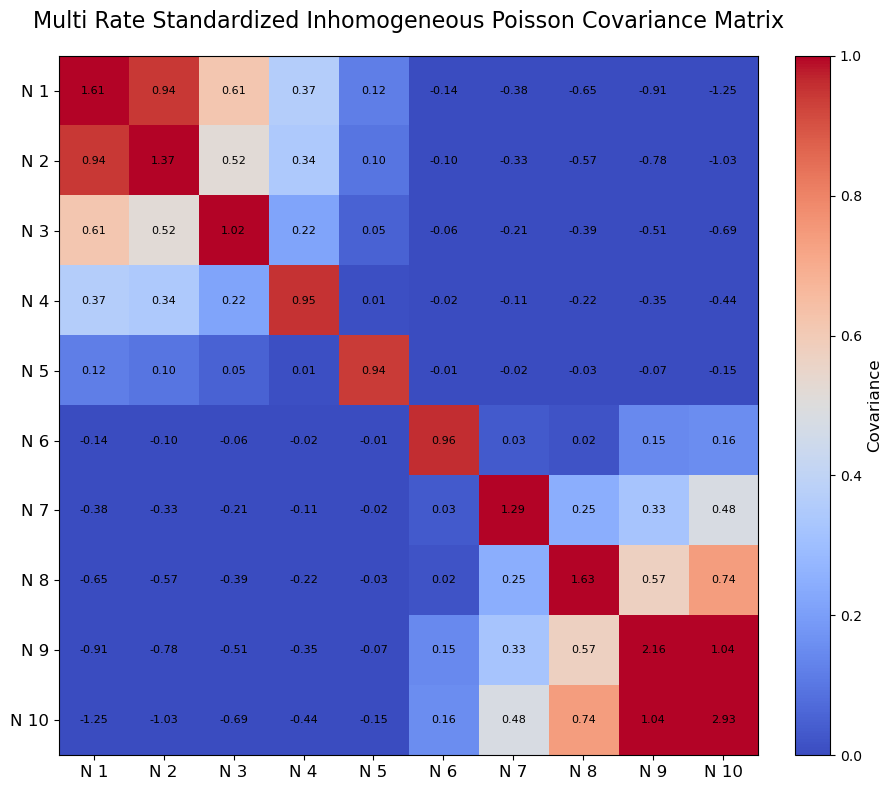

In [89]:
plot_covariance_matrix(multi_rate_cov_matrix_emp, normalize=False, title='Multi Rate Standardized Inhomogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 1.36112377,  1.03852517,  0.5290742 , -0.02594005,  0.32725999,
        -0.32189784, -0.70704555, -0.59063417, -1.53523616, -0.99956753],
       [ 1.03852517,  1.88667015,  0.74735686, -0.03712177,  0.39457901,
        -0.43722485, -0.90241355, -0.78863927, -2.02750507, -1.36214882],
       [ 0.5290742 ,  0.74735686,  1.10083546, -0.03475256,  0.1682645 ,
        -0.23729299, -0.52430222, -0.36430388, -1.08268536, -0.66228735],
       [-0.02594005, -0.03712177, -0.03475256,  1.01574993, -0.03314902,
         0.06151221,  0.03806844,  0.04584473,  0.11289677, -0.01528821],
       [ 0.32725999,  0.39457901,  0.1682645 , -0.03314902,  0.97791698,
        -0.13131516, -0.29609784, -0.18746886, -0.56140603, -0.38563319],
       [-0.32189784, -0.43722485, -0.23729299,  0.06151221, -0.13131516,
         1.28251788,  0.3066764 ,  0.23905384,  0.67099287,  0.48779555],
       [-0.70704555, -0.90241355, -0.52430222,  0.03806844, -0.29609784,
         0.3066764 ,  1.99389082,  0.51570508

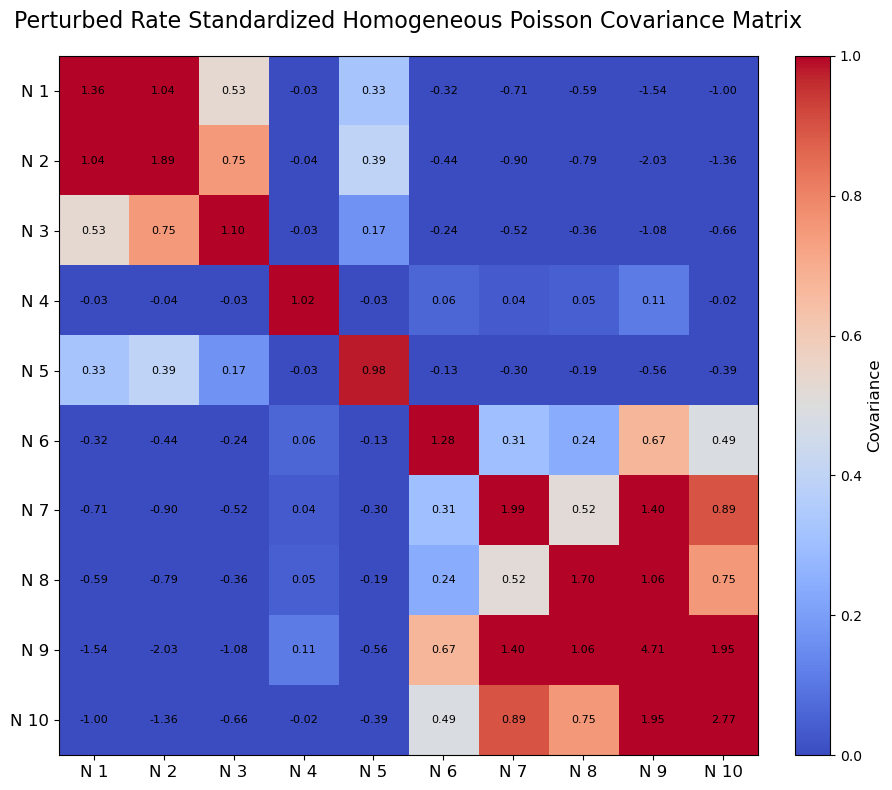

In [90]:
plot_covariance_matrix(perturbed_rate_cov_matrix, normalize=False, title='Perturbed Rate Standardized Homogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 1.35294122,  1.04189649,  0.53517298, -0.03999143,  0.32846773,
        -0.30724224, -0.69381833, -0.56809051, -1.51856713, -1.02867416],
       [ 1.04189649,  1.90772357,  0.76914118, -0.05753948,  0.40389673,
        -0.42494774, -0.90309702, -0.77163067, -2.04381597, -1.42768653],
       [ 0.53517298,  0.76914118,  1.10610665, -0.04566513,  0.17489295,
        -0.23290969, -0.52797326, -0.35899498, -1.09939455, -0.70214921],
       [-0.03999143, -0.05753948, -0.04566513,  1.03247105, -0.03882822,
         0.06680286,  0.0515132 ,  0.05529713,  0.14156739,  0.00529602],
       [ 0.32846773,  0.40389673,  0.17489295, -0.03882822,  0.97099646,
        -0.12746434, -0.29653931, -0.18300767, -0.56644136, -0.40501565],
       [-0.30724224, -0.42494774, -0.23290969,  0.06680286, -0.12746434,
         1.2548208 ,  0.29072699,  0.22214374,  0.64309677,  0.48672657],
       [-0.69381833, -0.90309702, -0.52797326,  0.0515132 , -0.29653931,
         0.29072699,  1.98966899,  0.49404002

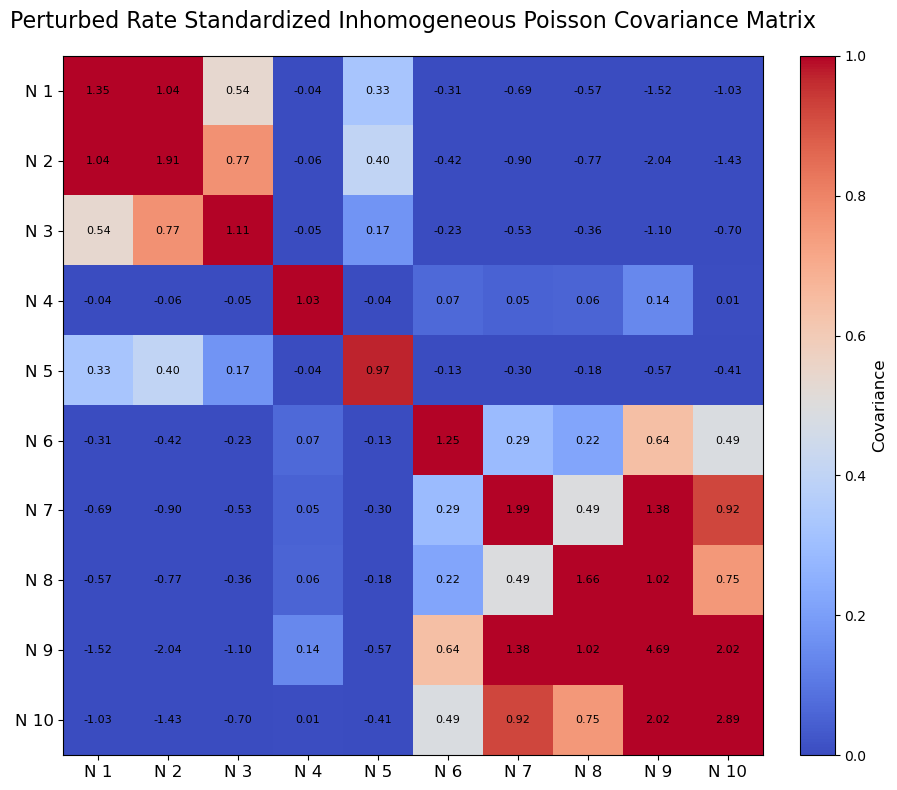

In [91]:
plot_covariance_matrix(perturbed_rate_cov_matrix_emp, normalize=False, title='Perturbed Rate Standardized Inhomogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

In [92]:
#### TESTING END #####

In [93]:
#hotelling_result = hotelling_t2_test(reshaped_stands, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result)
#hotelling_result_emp = hotelling_t2_test(reshaped_stands_emp, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_emp)

In [94]:
#good_result = stats.goodness_of_fit(stats.norm, serialized_count, statistic='ad', n_mc_samples=9999, rng=None)
# Anderson-Darling test (good for normality)
# Number of Monte Carlo samples
# Random number generator (None for fresh results)

#print(f"Statistic: {good_result.statistic}")
#print(f"P-value: {good_result.pvalue}")
#print(f"Location (mean): {good_result.fit_result.params.loc}")
#print(f"Scale (std dev): {good_result.fit_result.params.scale}")

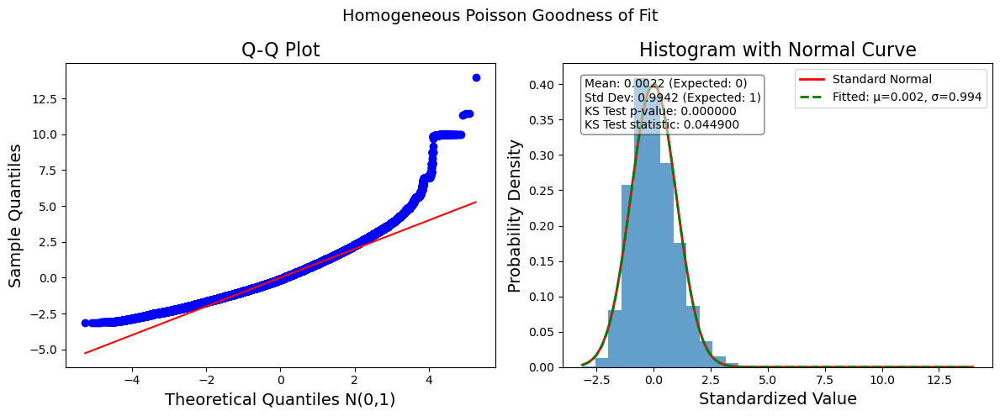

In [95]:
goodness, fig = analyze_poisson_goodness_of_fit(serialized_count, plot_title="Homogeneous Poisson Goodness of Fit", sample_limit=5000)

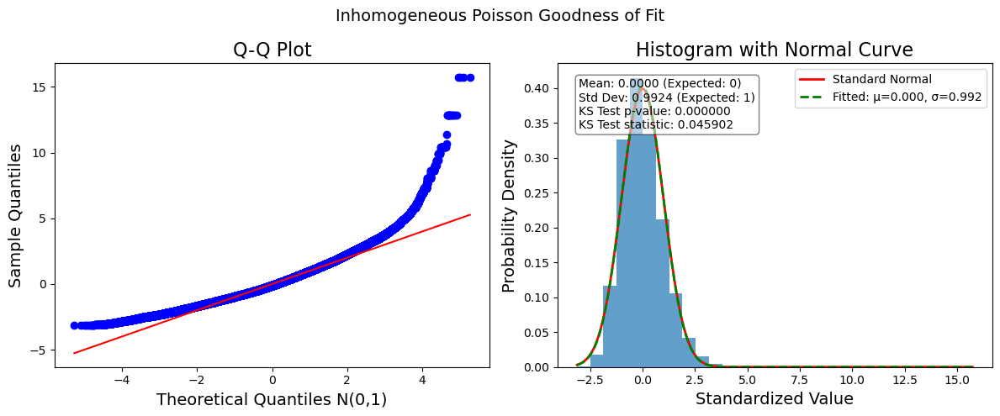

In [96]:
goodness_emp, fig_emp = analyze_poisson_goodness_of_fit(serialized_count_emp, plot_title="Inhomogeneous Poisson Goodness of Fit", sample_limit=5000)

In [97]:
# MULTIVARIATE ANALYSIS
# rv = multivariate_normal(mean=mean, cov=cov, allow_singular=allow_singular)
#rv = multivariate_normal(mean = [0,0], cov = cov_matrix, allow_singular = False)
#rv_emp = multivariate_normal(mean = [0,0], cov = cov_matrix_emp, allow_singular=False)
#print(rv)
#print(rv_emp)

# this is creating its own model, from this we can test if the data has goodness of fit

In [98]:
#cov_matrix, diagonal_ones = covariance_diagonal(reshaped_stands, tol=1e-8)
#print(cov_matrix)
#print(diagonal_ones)
#cov_matrix_emp, diagonal_ones_emp = covariance_diagonal(reshaped_stands_emp, tol=1e-8)
#print(cov_matrix_emp)
#print(diagonal_ones_emp)

In [99]:
#normal_loglikelihood = compute_neural_multivariate_log_likelihood(reshaped_stands)
#print(normal_loglikelihood)

#normal_loglikelihood_emp = compute_neural_multivariate_log_likelihood(reshaped_stands_emp)
#print(normal_loglikelihood_emp)

LogLikelihood experiments, Chi Square statistics, T tests, and zscores

In [101]:
total_log_likelihood, log_likelihood_per_sample = log_likelihood(empirical_mean, theoretical_means)
print(total_log_likelihood)
print(log_likelihood_per_sample)
# normalize data first (so we don't have any negative values, then we can do log likelihood)

#The neural spike patterns that are observed are unlikely to have come from the model...I got around -1600 log likelihood...

-16098.587229020219
[-1603.91127584 -1619.76600975 -1609.52693706 -1604.95834431
 -1610.84362308 -1613.70050682 -1609.95498363 -1610.30609018
 -1608.21220321 -1607.40725514]


In [102]:
test_total_log_likelihood, test_log_likelihood_per_sample = log_likelihood(theoretical_means, theoretical_means)
print(test_total_log_likelihood)
print(test_log_likelihood_per_sample)
# Note: This log likelihood has relative entropy
## Why the log likelihood per sample is different, the data is stochastic! ##
# we are doing this : log_likelihood = k*log(k) - k - log(k!) , so k = λ
#                o.g. log likelihood = k*log(λ) - λ - log(k!)
# even a perfect match is going to vary per sample because each sample is stochastic #

-16088.620646289652
[-1606.28829371 -1611.11193898 -1604.30774522 -1610.87886797
 -1607.04070061 -1607.65118691 -1610.69233181 -1606.9937088
 -1609.43136362 -1614.22450866]


In [103]:
multivar_log_likelihood, multivar_log_likelihood_per_sample, average_log_likelihood = multivariate_log_likelihood(reshaped_stands, mean = np.nan, cov = np.nan)
print(multivar_log_likelihood)
print(multivar_log_likelihood_per_sample)
print(average_log_likelihood)
len(multivar_log_likelihood_per_sample)

# note, there are 99900 samples and the total sum of those is very large.
#print(multivar_log_likelihood/len(multivar_log_likelihood_per_sample))

-14117773.57718494
[ -9.23891533  -9.28844533  -9.33797533 ... -15.56663622 -15.55805416
 -15.61480689]
-1411777.357718494


999000

In [104]:
multivar_log_likelihood_emp, multivar_log_likelihood_per_sample_emp, average_log_likelihood_emp = multivariate_log_likelihood(reshaped_stands_emp, mean = np.nan, cov = np.nan)
print(multivar_log_likelihood_emp)
print(multivar_log_likelihood_per_sample_emp)
print(average_log_likelihood_emp)
len(multivar_log_likelihood_per_sample)

reshaped_stands_emp.shape

-14113375.05663764
[ -9.23588533  -9.28088533  -9.32388533 ... -15.55339987 -15.54683163
 -15.60539194]
-1411337.505663764


(10, 1000000)

In [105]:
## Multivariate LogLikelihood with zero vector of len(num_neurons), aka 10) ##
multivar_log_likelihood_zero, multivar_log_likelihood_per_sample_zero, average_log_likelihood_zero = multivariate_log_likelihood(np.zeros((10, 1)), mean = np.nan, cov = np.nan)
print(multivar_log_likelihood_zero)
print(multivar_log_likelihood_per_sample_zero)
print(average_log_likelihood_zero)
len(multivar_log_likelihood_per_sample)

-9.189385332046726
-9.189385332046726
-0.9189385332046726


999000

In [106]:
# difference between multivariate log likelihood of expected - observed data.
diff = multivar_log_likelihood_emp - multivar_log_likelihood
print(diff)

print(diff/len(multivar_log_likelihood_per_sample)) # small difference per sample, less than 1.

4398.520547300577
0.0044029234707713485


In [107]:
reshaped_stands_resized, reshaped_stands_emp_resized = match_array_shapes(reshaped_stands, reshaped_stands_emp)
# resized makes sure that the standardized observed and expected data are the same shape

Original shapes: (10, 999000) and (10, 1000000)
Trimmed both to shape: (10, 999000)
Final shapes: (10, 999000) and (10, 999000)


In [108]:
### Chi square test can have bins and minimum expected input by the user ###
### bins (resolution): more bins show a detailed comparison, fewer bins show a broader comparison ###
### min_expected: check used to empty bins with less than min_expected counts
### 50 bins is considered a moderate resolution, 5 minimum expected counts per bin

In [109]:
proper_chi_square_test(reshaped_stands_resized, reshaped_stands_emp_resized, n_bins=30, min_expected=5)
# 'chi_square_statistic': 244.68781663684993
# 'p_value': 4.777468454985577e-40 (aka statistically significant p < 0.05)
# 'degrees_of_freedom': 21, (22 - 1 = 21)
# 'bins_created': 30
# 'bins_used': 22
# 'bins_removed': 8 (too few expected counts)
# The frequency distributions of observed and expected standardized data are different

{'chi_square_statistic': 3200.7559189619815,
 'p_value': 0.0,
 'degrees_of_freedom': 22,
 'bins_created': 30,
 'bins_used': 23,
 'bins_removed': 7}

In [110]:
### T test can have 'one_sample', 'two_sample', or 'paired' test type ###

In [111]:
t_test(reshaped_stands_resized, reshaped_stands_emp_resized, test_type='one_sample', target_mean=0)
# 't_statistic': 2.9680692646417373
# 'p_value': 0.00299683895859134
# 'target_mean': 0.0
# 'sample_mean': 0.003010765946416713

## estimated standardized data compared with the estimated mean.

{'t_statistic': 6.905631654469167,
 'p_value': 4.998349352109251e-12,
 'test_type': 'one_sample_vs_mean',
 'target_mean': 0.0,
 'sample_mean': 0.0021722453319353405}

In [112]:
t_test(reshaped_stands_emp_resized, reshaped_stands_emp_resized, test_type='one_sample', target_mean=0)
# 't_statistic': 9.031514925174204e-16
# 'p_value': 0.9999999999999993
# 'target_mean': 0.0
# ''sample_mean': 9.10405106879808e-19

## observed standardized data compared with the known mean.

{'t_statistic': -0.045262894322664504,
 'p_value': 0.9638977640549737,
 'test_type': 'one_sample_vs_mean',
 'target_mean': 0.0,
 'sample_mean': -1.4210911099374086e-05}

In [113]:
### Z stat info ###
#data_flat = reshaped_stands_emp.flatten()
#n = len(data_flat)

#sample_std = np.std(data_flat, ddof=1)
#std_error = sample_std / np.sqrt(n)
#std_error

In [114]:
# z_stat = (sample_mean - population_mean) / std_error
#Zstat = (np.mean(reshaped_stands_emp) - 0)/std_error
#Zstat

In [115]:
# Flatten baseline model
data_flat = reshaped_stands_emp.flatten()
n = len(data_flat)

# Compute cumulative Z-statistics and p-values for baseline (correct distribution)
z_stats_baseline, p_values_baseline = cumulative_z_test(data_flat, population_mean=0)

In [116]:
# Flatten perturbed model
perturbed_data_flat = perturbed_rate_reshaped_stands_emp.flatten()

# Compute cumulative Z-statistics and p-values for perturbed (incorrect distribution)
z_stats_perturbed, p_values_perturbed = cumulative_z_test(perturbed_data_flat, population_mean=0)

In [117]:
z_stats_baseline
p_values_baseline

z_stats_perturbed
p_values_perturbed

array([1.84068865, 1.74999601, 1.67372966, ..., 0.        , 0.        ,
       0.        ], shape=(10000000,))

In [118]:
z_stats_baseline

array([-1.00000000e-01, -1.57313218e-01, -2.05905372e-01, ...,
        8.02558118e-04,  4.01678481e-04,  2.02687087e-12],
      shape=(10000000,))

In [119]:
p_values_baseline

array([1.84068865, 1.74999601, 1.67372966, ..., 1.9987193 , 1.99935901,
       2.        ], shape=(10000000,))

In [120]:
z_stats_perturbed

array([-1.00000000e-01, -1.57313218e-01, -2.05905372e-01, ...,
        5.11229297e+02,  5.11229870e+02,  5.11230442e+02],
      shape=(10000000,))

In [121]:
p_values_perturbed

array([1.84068865, 1.74999601, 1.67372966, ..., 0.        , 0.        ,
       0.        ], shape=(10000000,))

In [122]:
t_test(reshaped_stands_resized, reshaped_stands_emp_resized, test_type='two_sample', target_mean=None)
# Are the group means different?
# 't_statistic': 2.1053251974447873
# 'p_value': 0.03526313467995148 (aka statistically significant p < 0.05)
# The datasets have significantly different means

{'t_statistic': 4.919634831225616,
 'p_value': 8.670651058615496e-07,
 'test_type': 'two_sample'}

In [123]:
t_test(reshaped_stands_resized, reshaped_stands_emp_resized, test_type='paired', target_mean=None)
# Are the paired differences different from zero
# 't_statistic': 36.627117732234396
# 'p_value': 1.6617750264560706e-293 (aka statistically significant p < 0.05)
# The datasets have significantly paired differences

{'t_statistic': 6.005832038874629,
 'p_value': 1.9035970916345825e-09,
 'test_type': 'paired'}

Theoretical and Empirical stats of excitatory counts.

In [125]:
# empirical_mean_ex = empirical_means(count_ex)
empirical_mean_ex = count_ex.mean(axis=0)
#print(empirical_mean_ex)
#print(empirical_mean_ex.shape)
count_rate_ex = empirical_mean_ex[:, -1]

# empirical_std_dev_ex = std_dev_empirical_mean(empirical_mean_ex, num_samples, count_ex)
#empirical_std_dev_ex = count_ex.std(axis=0, ddof=1)
empirical_std_dev_ex = np.sqrt(empirical_mean_ex)
#print(empirical_std_dev_ex)
#print(empirical_std_dev_ex.shape)

empirical_lower_bound_ex, empirical_upper_bound_ex = confidence_intervals(empirical_mean_ex, empirical_std_dev_ex, num_samples, confidence_level=0.95)
# print(empirical_lower_bound_sim_ex)
# print(empirical_upper_bound_sim_ex)

In [126]:
exclude_times_ex, global_exclude_ex = last_zero_std_time(empirical_std_dev_ex, verbose=True)

Neuron 0: last zero std at t=-1, recommended exclude=0
Neuron 1: last zero std at t=-1, recommended exclude=0
Neuron 2: last zero std at t=-1, recommended exclude=0
Neuron 3: last zero std at t=-1, recommended exclude=0
Neuron 4: last zero std at t=-1, recommended exclude=0
Neuron 5: last zero std at t=-1, recommended exclude=0
Neuron 6: last zero std at t=-1, recommended exclude=0
Neuron 7: last zero std at t=-1, recommended exclude=0
Neuron 8: last zero std at t=-1, recommended exclude=0
Neuron 9: last zero std at t=-1, recommended exclude=0

Global exclude (safest): t=0


In [127]:
theoretical_means_sim_ex = calculate_theoretical_mean(count_rate_ex, time)
#print(theoretical_means_sim_ex)
#print(theoretical_means_sim_ex.shape)

theoretical_std_dev_sim_ex = calculate_theoretical_std_dev(theoretical_means_sim_ex)
#print(theoretical_std_dev_sim_ex)
#print(theoretical_std_dev_sim_ex.shape)

theoretical_lower_bound_sim_ex, theoretical_upper_bound_sim_ex = confidence_intervals(theoretical_means_sim_ex, theoretical_std_dev_sim_ex, num_samples, confidence_level=0.95)
# print(theoretical_lower_bound_sim_ex)
# print(theoretical_upper_bound_sim_ex)

In [128]:
res_var_ex = variance_of_residuals(empirical_mean_ex, theoretical_means_sim_ex)
#print(res_var_ex)

In [129]:
stands_ex = standardize_counts_loop(count_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, num_samples, num_neurons, exclude = 1)
#print(stands_ex)
#print(stands_ex.shape)

stands_ex_emp = standardize_counts_loop(count_ex, empirical_mean_ex, empirical_std_dev_ex, num_samples, num_neurons, global_exclude_ex)
#print(stands_ex_emp)
#print(stands_ex_emp.shape)

# WHENEVER WE CHANGE TIME, WE NEED TO HAVE IT BE KNOWN, 

# when i do covariance, i should reshape from num_samples, num_neurons, , assume poisson but not assume independent, the variance and covariance should be equal
# time to something with time as replicate. replicate (num_samples) times time in dimension, num_neurons
# covariance, num_neurons by num_neurons, data to produce this should be num_samples times num_neurons
# reformat the current matrix, use reshape with the matrix, maybe with loops 

standardized_mean_global_ex = np.mean(stands_ex)
standardized_std_global_ex = np.std(stands_ex)

standardized_mean_emp_global_ex = np.mean(stands_ex_emp)
standardized_std_emp_global_ex = np.std(stands_ex_emp)

standardized_mean_ex = np.mean(stands_ex, axis=0)
standardized_std_ex = np.std(stands_ex, axis=0, ddof = 1)

standardized_mean_ex_emp = np.mean(stands_ex_emp, axis = 0)
standardized_std_ex_emp = np.std(stands_ex_emp, axis = 0, ddof = 1)

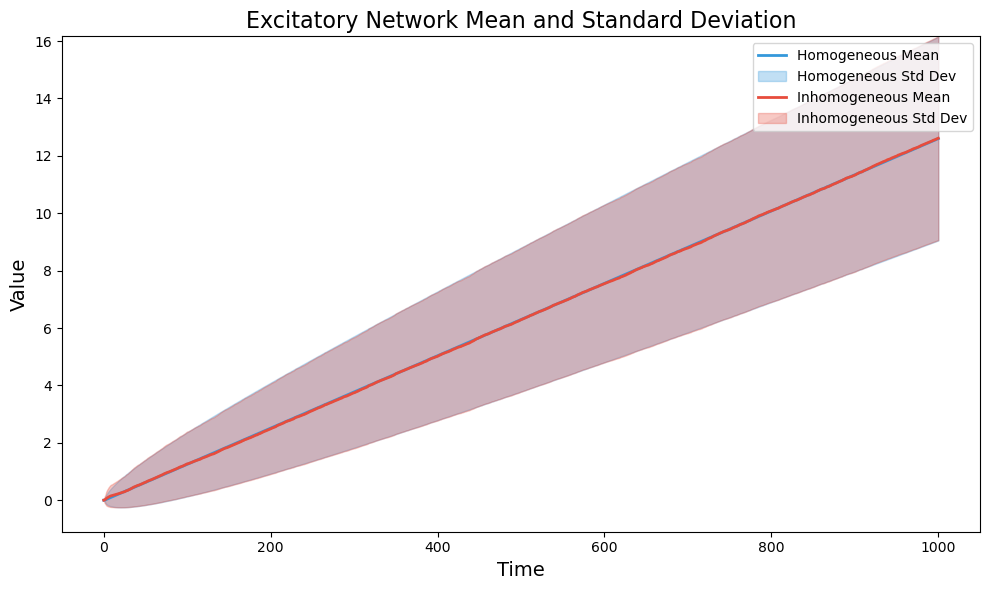

In [130]:
plot_stats(theoretical_means_sim_ex, empirical_mean_ex, theoretical_std_dev_sim_ex, empirical_std_dev_ex, title = 'Excitatory Network Mean and Standard Deviation', show_hline=False, data_type='standardized')

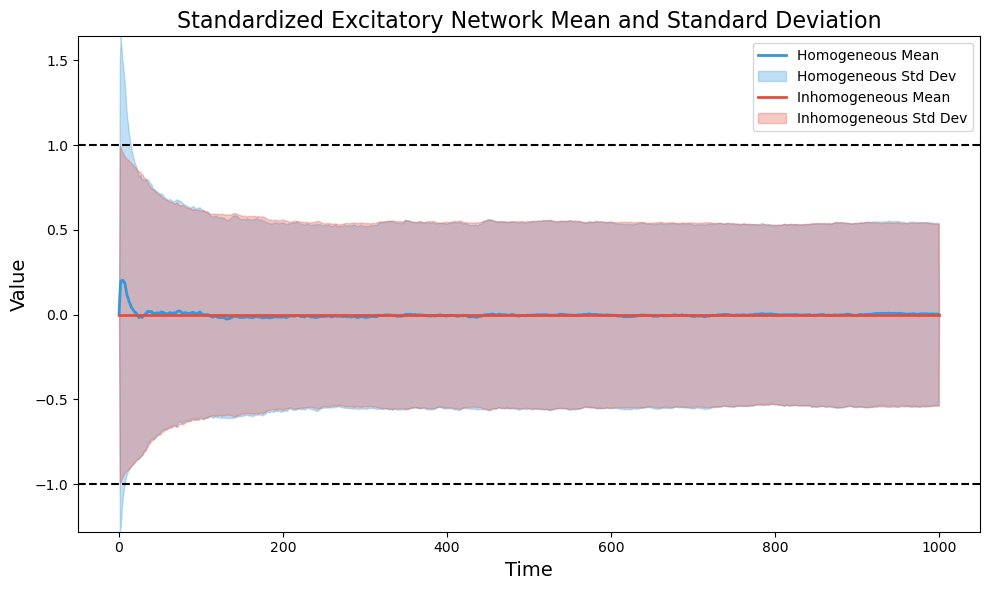

In [131]:
plot_stats(standardized_mean_ex, standardized_mean_ex_emp, standardized_std_ex, standardized_std_ex_emp, title = 'Standardized Excitatory Network Mean and Standard Deviation', show_hline=True, data_type='standardized')

In [132]:
mean_check_ex = check_mean_with_se(stands_ex, expected_mean=0, confidence=0.95)
#print(mean_check_ex)

mean_check_ex_emp = check_mean_with_se(stands_ex_emp, expected_mean=0, confidence=0.95)
#print(mean_check_ex_emp)

In [133]:
serialized_count_ex = serialize_counts(stands_ex) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count_ex.shape)
#print(np.mean(serialized_count_ex))
t_stat_ex, p_val_mean_ex = stats.ttest_1samp(serialized_count_ex, np.mean(serialized_count_ex))
#print(t_stat_ex)
#print(p_val_mean_ex)

    ## per neuron, check that is it doing per neuron
    ## check assumptions if i'm using count, check for data replicate and check for variables

serialized_count_ex_emp = serialize_counts(stands_ex_emp) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count_ex_emp.shape)
#print(np.mean(serialized_count_ex_emp))
t_stat_ex_emp, p_val_mean_ex_emp = stats.ttest_1samp(serialized_count_ex_emp, np.mean(serialized_count_ex_emp))
#print(t_stat_ex_emp)
#print(p_val_mean_ex_emp)

In [134]:
#reshaped_stands_ex = np.reshape(stands_ex, (-1, stands_ex.shape[1]), order='F')
reshaped_stands_ex = np.transpose(stands_ex, (1, 0, 2)).reshape(stands_ex.shape[1], -1)
#print(stands_ex.shape)
#print(reshaped_stands_ex.shape)

#could change the values from num_samples, num_neurons, time to 10 by large number, could transpose it
# make sure coviariance matrix is using row data, don't use np.cov because it throws away the mean
# covariance is the data and the transpose of the data divided sqrt(n-1), lookup how covariance is calculated and make it by hand.
# try to iterate over samples, as in each time point, 

# reshaped_stands_ex_emp = np.reshape(stands_ex_emp, (-1, stands_ex_emp.shape[1]), order='F')
reshaped_stands_ex_emp = np.transpose(stands_ex_emp, (1, 0, 2)).reshape(stands_ex_emp.shape[1], -1)
#print(stands_ex_emp.shape)
#print(stands_ex.shape)
#print(reshaped_stands_ex.shape)
#print(stands_ex[:,:,0])
#print(reshaped_stands[:,0])
#print(stands_ex_emp[:,:,0].shape)
#print(stands_ex_emp[:10,:,0])
#print(reshaped_stands_ex_emp.shape)
#print(reshaped_stands_ex_emp[:10,:])

In [135]:
transpose_stands_ex = np.transpose(stands_ex, (1, 0, 2))
#print(transpose_stands_ex[:,:,0:3])

In [136]:
#print(reshaped_stands_ex[:,:5])

In [137]:
#print("Time point 0:", stands_ex[:,:,0])
#print("Time point 1:", stands_ex[:,:,1])
#print("Time point 100:", stands_ex[:,:,100])

In [138]:
cov_matrix_ex = cov_standardized_data(reshaped_stands_ex)
cov_matrix_ex_emp = cov_standardized_data(reshaped_stands_ex_emp)

array([[0.33451861, 0.03177538, 0.03343465, 0.01939279, 0.03011019,
        0.0242379 , 0.01991295, 0.03253488, 0.0333835 , 0.02049733],
       [0.03177538, 0.13258369, 0.0276321 , 0.0284144 , 0.03014611,
        0.02999835, 0.0218067 , 0.01809566, 0.02346002, 0.02784411],
       [0.03343465, 0.0276321 , 0.19595275, 0.02438989, 0.0244816 ,
        0.0275917 , 0.02818678, 0.01961453, 0.02082249, 0.019756  ],
       [0.01939279, 0.0284144 , 0.02438989, 0.127912  , 0.03180909,
        0.02963949, 0.02182335, 0.02031278, 0.02237269, 0.02398989],
       [0.03011019, 0.03014611, 0.0244816 , 0.03180909, 0.13467412,
        0.02669012, 0.02230904, 0.02434799, 0.02410417, 0.02583379],
       [0.0242379 , 0.02999835, 0.0275917 , 0.02963949, 0.02669012,
        0.12603373, 0.02507996, 0.02643503, 0.02581921, 0.02972041],
       [0.01991295, 0.0218067 , 0.02818678, 0.02182335, 0.02230904,
        0.02507996, 0.18854584, 0.02175599, 0.02368237, 0.02608747],
       [0.03253488, 0.01809566, 0.0196145

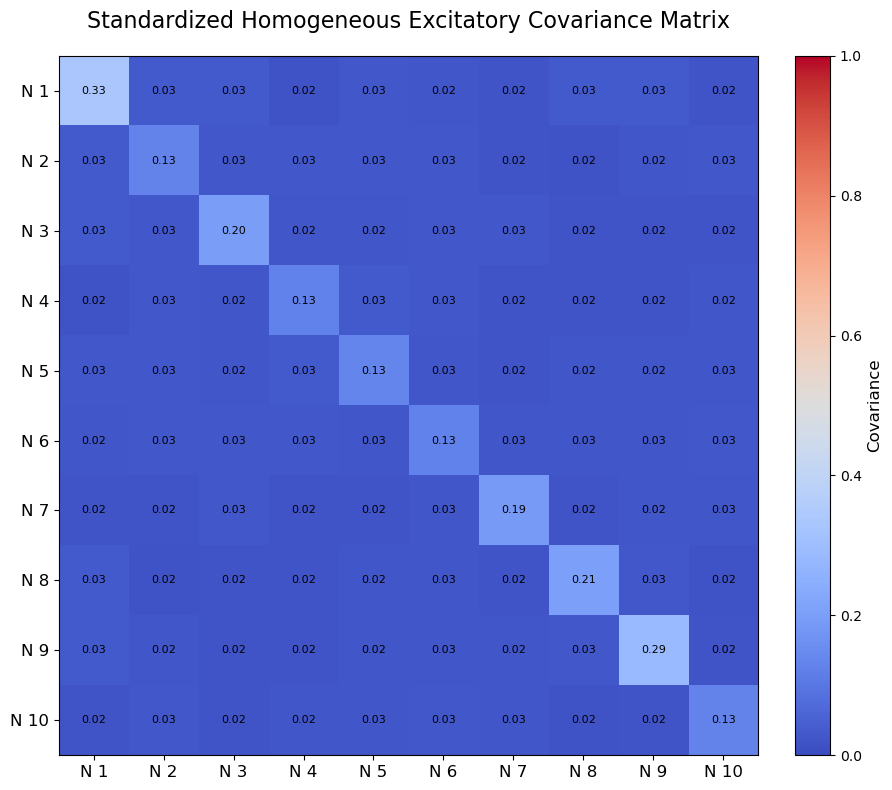

In [139]:
plot_covariance_matrix(cov_matrix_ex, normalize=False, title="Standardized Homogeneous Excitatory Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=None)

array([[0.32753148, 0.03138463, 0.03291651, 0.01898678, 0.02973979,
        0.02380639, 0.0194319 , 0.03221715, 0.03287085, 0.0202221 ],
       [0.03138463, 0.13296377, 0.02758524, 0.02838993, 0.03008039,
        0.02987062, 0.02160333, 0.01806912, 0.02321182, 0.02775027],
       [0.03291651, 0.02758524, 0.19584002, 0.02434633, 0.02448773,
        0.02750515, 0.02793098, 0.01947034, 0.02080997, 0.01963593],
       [0.01898678, 0.02838993, 0.02434633, 0.12727517, 0.03163206,
        0.02922846, 0.0213508 , 0.02018579, 0.02189306, 0.02379029],
       [0.02973979, 0.03008039, 0.02448773, 0.03163206, 0.13480122,
        0.02647536, 0.02201663, 0.02431787, 0.02382052, 0.02570293],
       [0.02380639, 0.02987062, 0.02750515, 0.02922846, 0.02647536,
        0.12527014, 0.02431437, 0.02627717, 0.02529164, 0.02939103],
       [0.0194319 , 0.02160333, 0.02793098, 0.0213508 , 0.02201663,
        0.02431437, 0.18283595, 0.02136904, 0.022909  , 0.02560245],
       [0.03221715, 0.01806912, 0.0194703

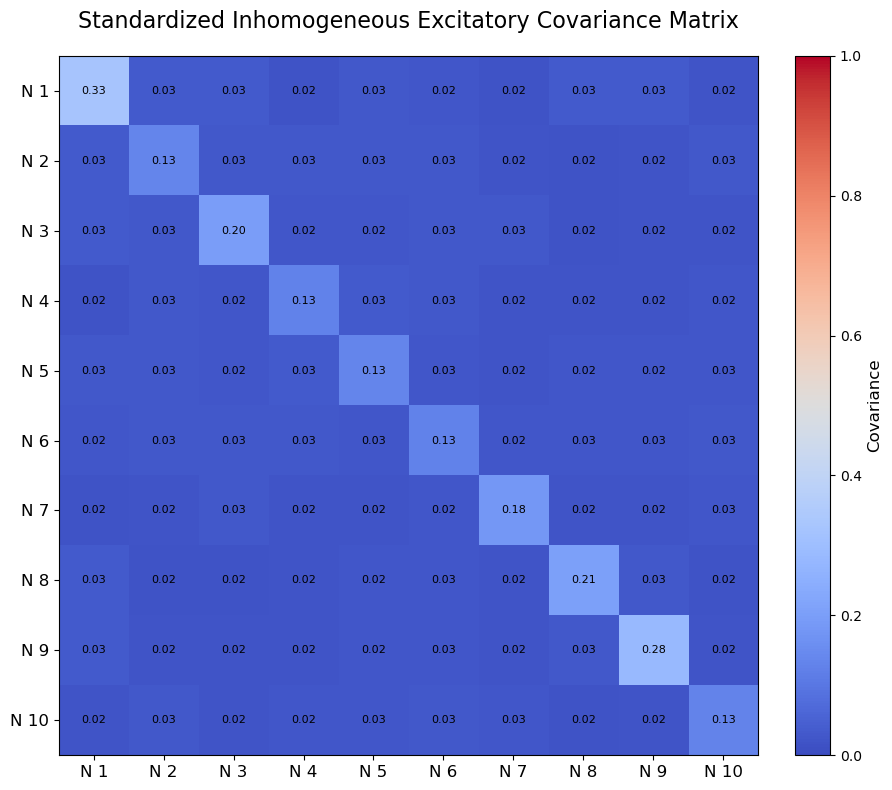

In [140]:
plot_covariance_matrix(cov_matrix_ex_emp, normalize=False, title="Standardized Inhomogeneous Excitatory Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=None)

In [141]:
#hotelling_result_ex = hotelling_t2_test(reshaped_stands_ex, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_ex)
#hotelling_result_ex_emp = hotelling_t2_test(reshaped_stands_ex_emp, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_ex_emp)

In [142]:
#cov_matrix_ex, diagonal_ones_ex = covariance_diagonal(reshaped_stands_ex, tol=1e-8)
#print(cov_matrix_ex)
#print(diagonal_ones_ex)
#cov_matrix_ex_emp, diagonal_ones_ex_emp = covariance_diagonal(reshaped_stands_ex_emp, tol=1e-8)
#print(cov_matrix_ex_emp)
#print(diagonal_ones_ex_emp)

In [143]:
#### TESTING #####
#plot_covariance_matrix(reshaped_data, normalize=False, title="Excitatory Theoretical Covariance Matrix", cmap='coolwarm', annot=True)

In [144]:
#### TESTING ####
#plot_covariance_matrix(reshaped_data_emp, normalize=False, title="Excitatory Empirical Covariance Matrix", cmap='coolwarm', annot=True)

In [145]:
# MULTIVARIATE ANALYSIS
# rv = multivariate_normal(mean=mean, cov=cov, allow_singular=allow_singular)

# rv_ex = multivariate_normal(mean = theoretical_means_sim_ex, cov = cov_matrix_ex, allow_singular=allow_singular)
# rv_ex_emp = multivariate_normal(mean = empirical_mean_ex, cov = cov_matrix_ex_emp, allow_singular=allow_singular)

# this is creating its own model, from this we can test if the data has goodness of fit

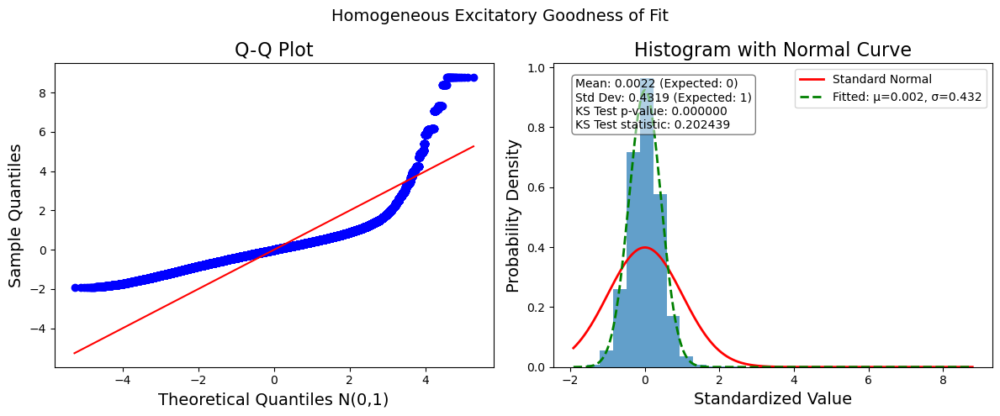

In [146]:
goodness_ex, fig_ex = analyze_poisson_goodness_of_fit(serialized_count_ex, plot_title="Homogeneous Excitatory Goodness of Fit", sample_limit=5000)

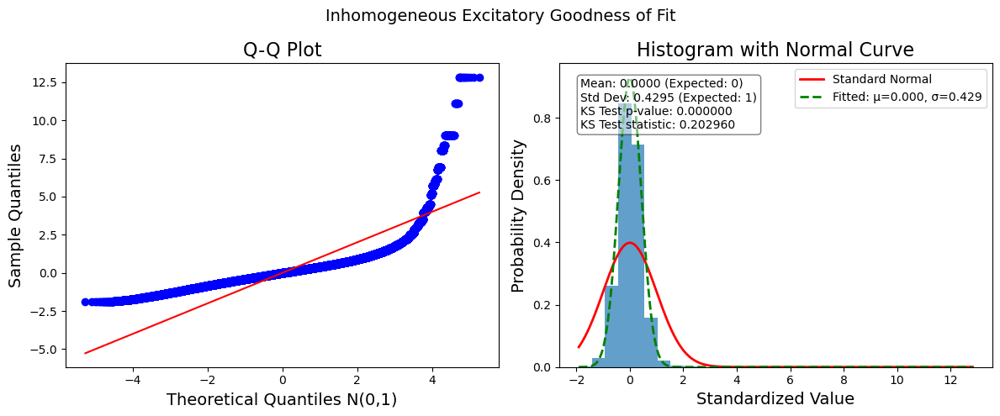

In [147]:
goodness_ex_emp, fig_ex_emp = analyze_poisson_goodness_of_fit(serialized_count_ex_emp, plot_title="Inhomogeneous Excitatory Goodness of Fit", sample_limit=5000)

Theoretical and Empirical stats of inhibitory counts.

In [149]:
# empirical_mean_in = empirical_means(count_in)
empirical_mean_in = count_in.mean(axis=0)
#print(empirical_mean_in)
#print(empirical_mean_in.shape)
count_rate_in = empirical_mean_in[:, -1]

#empirical_std_dev_in = std_dev_empirical_mean(empirical_mean_in, num_samples, count_in)
#empirical_std_dev_in = count_in.std(axis=0, ddof=1)
empirical_std_dev_in = np.sqrt(empirical_mean_in)
#print(empirical_std_dev_in)
#print(empirical_std_dev_in.shape)

empirical_lower_bound_in, empirical_upper_bound_in = confidence_intervals(empirical_mean_in, empirical_std_dev_in, num_samples, confidence_level=0.95)
# print(empirical_lower_bound_sim_in)
# print(empirical_upper_bound_sim_in)

In [150]:
exclude_times_in, global_exclude_in = last_zero_std_time(empirical_std_dev_in, verbose=True)

Neuron 0: last zero std at t=-1, recommended exclude=0
Neuron 1: last zero std at t=-1, recommended exclude=0
Neuron 2: last zero std at t=-1, recommended exclude=0
Neuron 3: last zero std at t=-1, recommended exclude=0
Neuron 4: last zero std at t=-1, recommended exclude=0
Neuron 5: last zero std at t=-1, recommended exclude=0
Neuron 6: last zero std at t=-1, recommended exclude=0
Neuron 7: last zero std at t=-1, recommended exclude=0
Neuron 8: last zero std at t=-1, recommended exclude=0
Neuron 9: last zero std at t=-1, recommended exclude=0

Global exclude (safest): t=0


In [151]:
theoretical_means_sim_in = calculate_theoretical_mean(count_rate_in, time)
#print(theoretical_means_sim_in)
#print(theoretical_means_sim_in.shape)

theoretical_std_dev_sim_in = calculate_theoretical_std_dev(theoretical_means_sim_in)
#print(theoretical_std_dev_sim_in)
#print(theoretical_std_dev_sim_in.shape)

theoretical_lower_bound_sim_in, theoretical_upper_bound_sim_in = confidence_intervals(theoretical_means_sim_in, theoretical_std_dev_sim_in, num_samples, confidence_level=0.95)
# print(theoretical_lower_bound_sim_in)
# print(theoretical_upper_bound_sim_in)

In [152]:
res_var_in = variance_of_residuals(empirical_mean_in, theoretical_means_sim_in)
#print(res_var_in)

In [153]:
stands_in = standardize_counts_loop(count_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, num_samples, num_neurons, exclude = 1)
#print(stands_in)
#print(stands_in.shape)

stands_in_emp = standardize_counts_loop(count_in, empirical_mean_in, empirical_std_dev_in, num_samples, num_neurons, global_exclude_in)
#print(stands_in_emp)
#print(stands_in_emp.shape)

# WHENEVER WE CHANGE TIME, WE NEED TO HAVE IT BE KNOWN, 

# when i do covariance, i should reshape from num_samples, num_neurons, , assume poisson but not assume independent, the variance and covariance should be equal
# time to something with time as replicate. replicate (num_samples) times time in dimension, num_neurons
# covariance, num_neurons by num_neurons, data to produce this should be num_samples times num_neurons
# reformat the current matrix, use reshape with the matrix, maybe with loops 

standardized_mean_global_in = np.mean(stands_in)
standardized_std_global_in = np.std(stands_in)

standardized_mean_emp_global_in = np.mean(stands_in_emp)
standardized_std_emp_global_in = np.std(stands_in_emp)

standardized_mean_in = np.mean(stands_in, axis=0)
standardized_std_in = np.std(stands_in, axis=0, ddof = 1)

standardized_mean_in_emp = np.mean(stands_in_emp, axis = 0)
standardized_std_in_emp = np.std(stands_in_emp, axis = 0, ddof = 1)

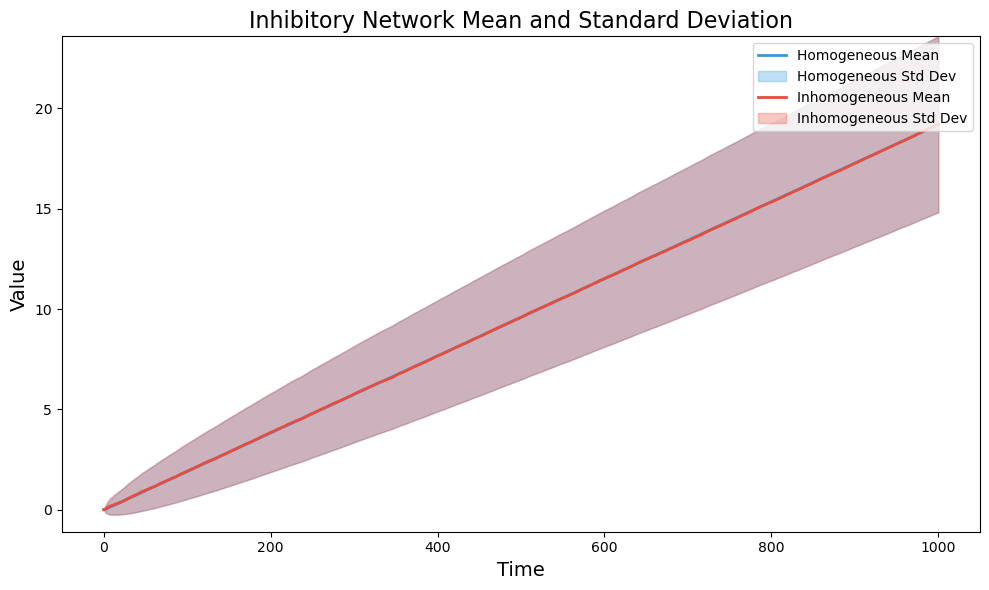

In [154]:
plot_stats(theoretical_means_sim_in , empirical_mean_in, theoretical_std_dev_sim_in, empirical_std_dev_in, title = 'Inhibitory Network Mean and Standard Deviation', show_hline=False, data_type='standardized')

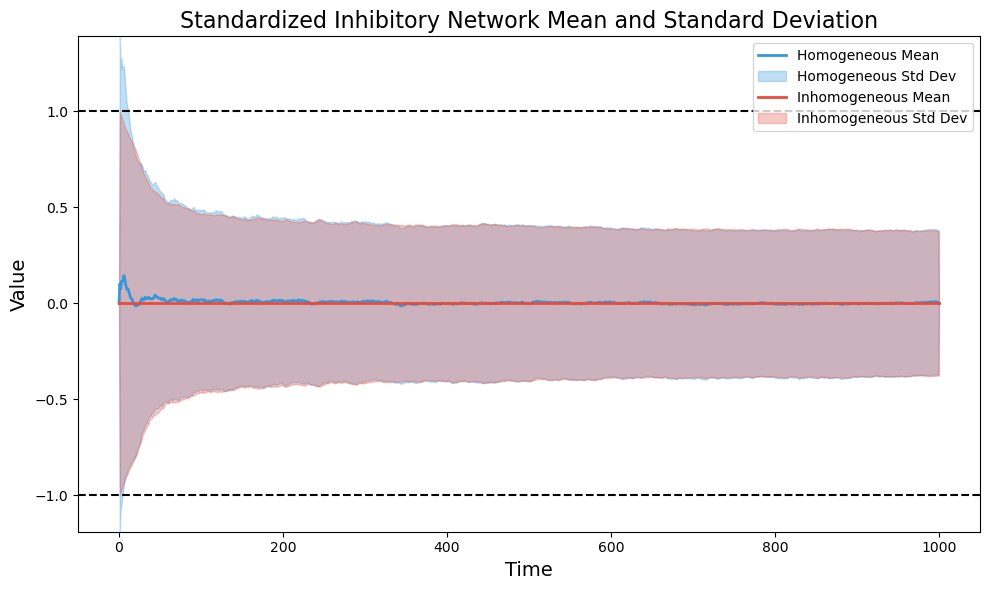

In [155]:
plot_stats(standardized_mean_in, standardized_mean_in_emp, standardized_std_in, standardized_std_in_emp, title = 'Standardized Inhibitory Network Mean and Standard Deviation', show_hline=True, data_type='standardized')

In [156]:
mean_check_in = check_mean_with_se(stands_in, expected_mean=0, confidence=0.95)
#print(mean_check_in)

mean_check_in_emp = check_mean_with_se(stands_in_emp, expected_mean=0, confidence=0.95)
#print(mean_check_in_emp)

In [157]:
serialized_count_in = serialize_counts(stands_in) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count_in.shape)
#print(np.mean(serialized_count_in))
t_stat_in, p_val_mean_in = stats.ttest_1samp(serialized_count_in, np.mean(serialized_count_in))
#print(t_stat_in)
#print(p_val_mean_in)
    ## per neuron, check that is it doing per neuron
    ## check assumptions if i'm using count, check for data replicate and check for variables


serialized_count_in_emp = serialize_counts(stands_in_emp) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count_in_emp.shape)
#print(np.mean(serialized_count_in_emp))
t_stat_in_emp, p_val_mean_in_emp = stats.ttest_1samp(serialized_count_in_emp, np.mean(serialized_count_in_emp))
#print(t_stat_in_emp)
#print(p_val_mean_in_emp)

In [158]:
#reshaped_stands_in = np.reshape(stands_in, (-1, stands_in.shape[1]), order='F')
reshaped_stands_in = np.transpose(stands_in, (1, 0, 2)).reshape(stands_in.shape[1], -1)
#print(stands_in.shape)
#print(reshaped_stands_in.shape)

#reshaped_stands_in_emp = np.reshape(stands_in_emp, (-1, stands_in_emp.shape[1]), order='F')
reshaped_stands_in_emp = np.transpose(stands_in_emp, (1, 0, 2)).reshape(stands_in_emp.shape[1], -1)
#print(stands_in_emp.shape)
#print(reshaped_stands_in_emp.shape)

In [159]:
cov_matrix_in = cov_standardized_data(reshaped_stands_in)
cov_matrix_in_emp = cov_standardized_data(reshaped_stands_in_emp)

array([[0.19016006, 0.0137273 , 0.01703075, 0.02215457, 0.01951979,
        0.01689474, 0.02468792, 0.03846106, 0.02172061, 0.01483235],
       [0.0137273 , 0.11473984, 0.01929557, 0.02486368, 0.00760801,
        0.01265442, 0.02408223, 0.01173256, 0.02453514, 0.01665212],
       [0.01703075, 0.01929557, 0.16852816, 0.00734086, 0.0087622 ,
        0.01274238, 0.01726636, 0.01272048, 0.01583812, 0.01243105],
       [0.02215457, 0.02486368, 0.00734086, 0.16772249, 0.02311263,
        0.01793745, 0.01869486, 0.01884001, 0.02132167, 0.02039332],
       [0.01951979, 0.00760801, 0.0087622 , 0.02311263, 0.32387658,
        0.02276324, 0.02010058, 0.02308263, 0.01080312, 0.00526717],
       [0.01689474, 0.01265442, 0.01274238, 0.01793745, 0.02276324,
        0.26796517, 0.01102009, 0.01713386, 0.01263909, 0.01098757],
       [0.02468792, 0.02408223, 0.01726636, 0.01869486, 0.02010058,
        0.01102009, 0.13246237, 0.00855449, 0.01676134, 0.018568  ],
       [0.03846106, 0.01173256, 0.0127204

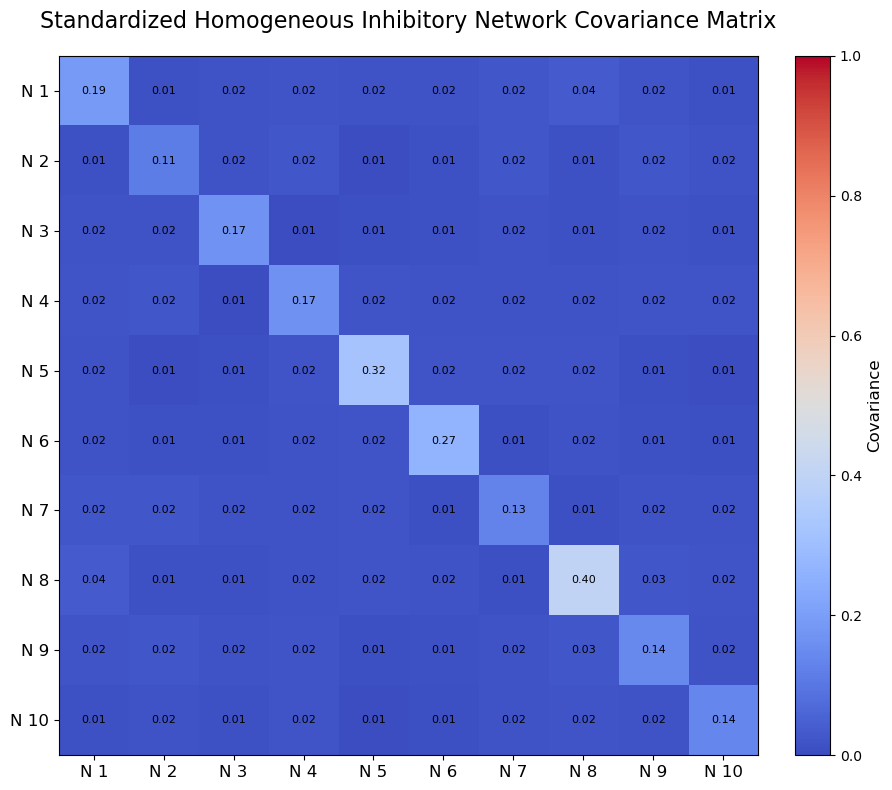

In [160]:
plot_covariance_matrix(cov_matrix_in, normalize=False, title="Standardized Homogeneous Inhibitory Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=None)

array([[0.18658681, 0.01363944, 0.01657539, 0.02180575, 0.01917869,
        0.01675033, 0.02424735, 0.03821256, 0.02129051, 0.01459919],
       [0.01363944, 0.11576459, 0.01897791, 0.02469187, 0.00747997,
        0.01257018, 0.02400205, 0.01178771, 0.02423349, 0.01644605],
       [0.01657539, 0.01897791, 0.16586122, 0.00701032, 0.00857044,
        0.01268505, 0.01681556, 0.01285231, 0.01526255, 0.01208457],
       [0.02180575, 0.02469187, 0.00701032, 0.16571847, 0.02295372,
        0.01778579, 0.01833144, 0.01887031, 0.02083732, 0.0200227 ],
       [0.01917869, 0.00747997, 0.00857044, 0.02295372, 0.31744517,
        0.02246821, 0.01958829, 0.02277217, 0.0103356 , 0.00503104],
       [0.01675033, 0.01257018, 0.01268505, 0.01778579, 0.02246821,
        0.26567503, 0.0108804 , 0.01690035, 0.01264179, 0.01083555],
       [0.02424735, 0.02400205, 0.01681556, 0.01833144, 0.01958829,
        0.0108804 , 0.12999948, 0.00844106, 0.0163452 , 0.01808369],
       [0.03821256, 0.01178771, 0.0128523

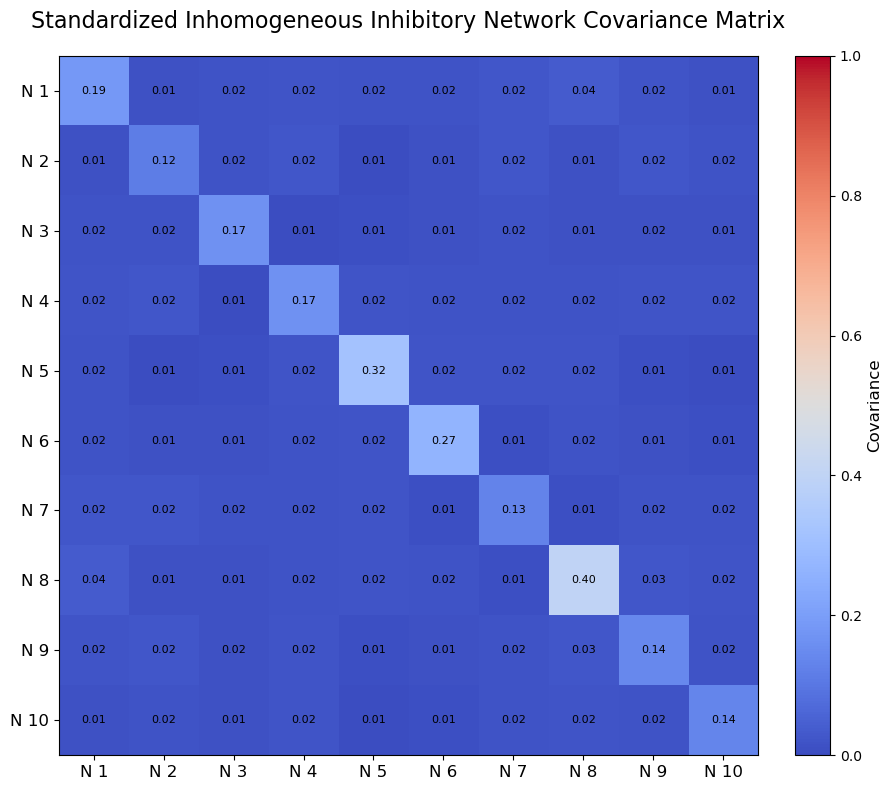

In [161]:
plot_covariance_matrix(cov_matrix_in_emp, normalize=False, title="Standardized Inhomogeneous Inhibitory Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=None)

In [162]:
#hotelling_result_in = hotelling_t2_test(reshaped_stands_in, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_in)
#hotelling_result_in_emp = hotelling_t2_test(reshaped_stands_in_emp, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_in_emp)

In [163]:
#cov_matrix_in, diagonal_ones_in = covariance_diagonal(reshaped_stands_in, tol=1e-8)
#print(cov_matrix_in)
#print(diagonal_ones_in)
#cov_matrix_in_emp, diagonal_ones_in_emp = covariance_diagonal(reshaped_stands_in_emp, tol=1e-8)
#print(cov_matrix_in_emp)
#print(diagonal_ones_in_emp)

In [164]:
# MULTIVARIATE ANALYSIS
# rv = multivariate_normal(mean=mean, cov=cov, allow_singular=allow_singular)

# rv_in = multivariate_normal(mean = theoretical_means_sim_in, cov = cov_matrix_in, allow_singular=allow_singular)
# rv_in_emp = multivariate_normal(mean = empirical_mean_in, cov = cov_matrix_in_emp, allow_singular=allow_singular)

# this is creating its own model, from this we can test if the data has goodness of fit

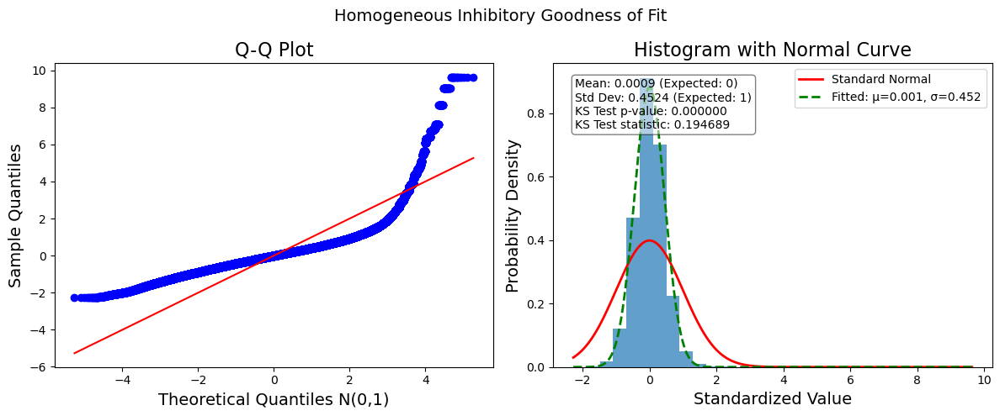

In [165]:
goodness_in, fig_in = analyze_poisson_goodness_of_fit(serialized_count_in, plot_title="Homogeneous Inhibitory Goodness of Fit", sample_limit=5000)

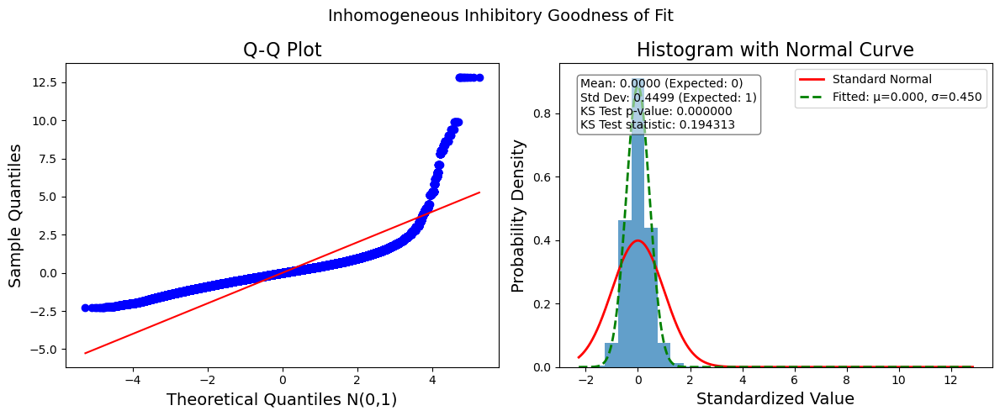

In [166]:
goodness_in_emp, fig_in_emp = analyze_poisson_goodness_of_fit(serialized_count_in_emp, plot_title="Inhomogeneous Inhibitory Goodness of Fit", sample_limit=5000)

Balanced Excitatory and Inhibitory Experiments

In [168]:
# Original excitatory and inhibitory data shapes
print(reshaped_stands_ex.shape)
print(reshaped_stands_in.shape)

print(reshaped_stands_ex_emp.shape)
print(reshaped_stands_in_emp.shape)

(10, 999000)
(10, 999000)
(10, 1000000)
(10, 1000000)


In [169]:
balanced_data, labels, types = create_balanced_ei_dataset(reshaped_stands_ex, reshaped_stands_in, n_neurons_each=5)
print(f"\nBalanced dataset shape: {balanced_data.shape}")
print(f"Neuron labels: {labels}")
print(f"Neuron types: {types}")

balanced_data_emp, labels_emp, types_emp = create_balanced_ei_dataset(reshaped_stands_ex_emp, reshaped_stands_in_emp, n_neurons_each=5)
print(f"\nBalanced Empirical dataset shape: {balanced_data_emp.shape}")
print(f"Neuron Empirical labels: {labels_emp}")
print(f"Neuron Empirical types: {types_emp}")
# Balanced = Joint, don't use balance because it could be interpreted as something it isn't
# add option to randomize joint excitatory and inhibitory neurons
# Get neuron id from spike train instead of label


Balanced dataset shape: (10, 999000)
Neuron labels: ['E0', 'E1', 'E2', 'E3', 'E4', 'I0', 'I1', 'I2', 'I3', 'I4']
Neuron types: ['E', 'E', 'E', 'E', 'E', 'I', 'I', 'I', 'I', 'I']

Balanced Empirical dataset shape: (10, 1000000)
Neuron Empirical labels: ['E0', 'E1', 'E2', 'E3', 'E4', 'I0', 'I1', 'I2', 'I3', 'I4']
Neuron Empirical types: ['E', 'E', 'E', 'E', 'E', 'I', 'I', 'I', 'I', 'I']


In [170]:
cov_matrix_balance = cov_standardized_data(balanced_data)
cov_matrix_balance_emp = cov_standardized_data(balanced_data_emp)

array([[0.33451861, 0.03177538, 0.03343465, 0.01939279, 0.03011019,
        0.02839732, 0.01735085, 0.01186603, 0.01566714, 0.02360244],
       [0.03177538, 0.13258369, 0.0276321 , 0.0284144 , 0.03014611,
        0.02464946, 0.02911025, 0.01610372, 0.01828596, 0.0106778 ],
       [0.03343465, 0.0276321 , 0.19595275, 0.02438989, 0.0244816 ,
        0.02998436, 0.01973195, 0.02478368, 0.01909415, 0.01041705],
       [0.01939279, 0.0284144 , 0.02438989, 0.127912  , 0.03180909,
        0.02104216, 0.03466626, 0.02490075, 0.02494502, 0.01861905],
       [0.03011019, 0.03014611, 0.0244816 , 0.03180909, 0.13467412,
        0.02797174, 0.02325406, 0.01896613, 0.02222686, 0.01572298],
       [0.02839732, 0.02464946, 0.02998436, 0.02104216, 0.02797174,
        0.19016006, 0.0137273 , 0.01703075, 0.02215457, 0.01951979],
       [0.01735085, 0.02911025, 0.01973195, 0.03466626, 0.02325406,
        0.0137273 , 0.11473984, 0.01929557, 0.02486368, 0.00760801],
       [0.01186603, 0.01610372, 0.0247836

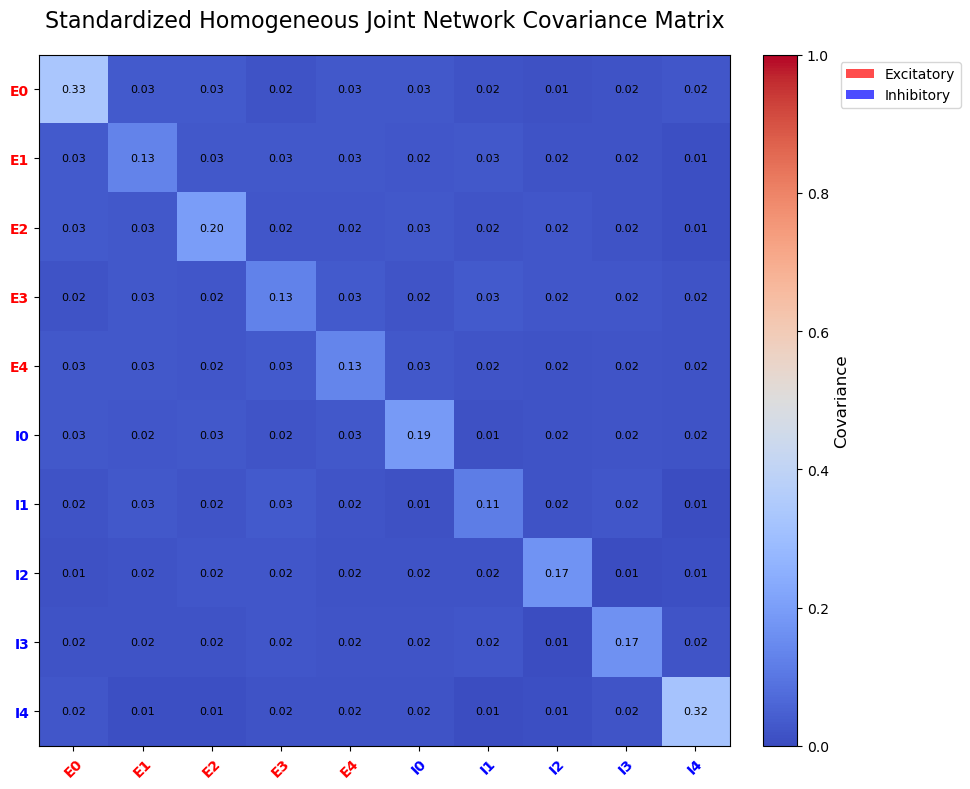

In [171]:
plot_covariance_matrix(cov_matrix_balance, normalize=False, title="Standardized Homogeneous Joint Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=labels)

array([[0.32753148, 0.03138463, 0.03291651, 0.01898678, 0.02973979,
        0.02779388, 0.01711268, 0.0114998 , 0.0152714 , 0.02284484],
       [0.03138463, 0.13296377, 0.02758524, 0.02838993, 0.03008039,
        0.02450762, 0.02903402, 0.01595402, 0.01820173, 0.01037882],
       [0.03291651, 0.02758524, 0.19584002, 0.02434633, 0.02448773,
        0.02989695, 0.01964829, 0.02468116, 0.01890842, 0.00994817],
       [0.01898678, 0.02838993, 0.02434633, 0.12727517, 0.03163206,
        0.02076634, 0.03445689, 0.02445082, 0.02463353, 0.0182691 ],
       [0.02973979, 0.03008039, 0.02448773, 0.03163206, 0.13480122,
        0.02772139, 0.0231954 , 0.01873159, 0.02202878, 0.0155272 ],
       [0.02779388, 0.02450762, 0.02989695, 0.02076634, 0.02772139,
        0.18658681, 0.01363944, 0.01657539, 0.02180575, 0.01917869],
       [0.01711268, 0.02903402, 0.01964829, 0.03445689, 0.0231954 ,
        0.01363944, 0.11576459, 0.01897791, 0.02469187, 0.00747997],
       [0.0114998 , 0.01595402, 0.0246811

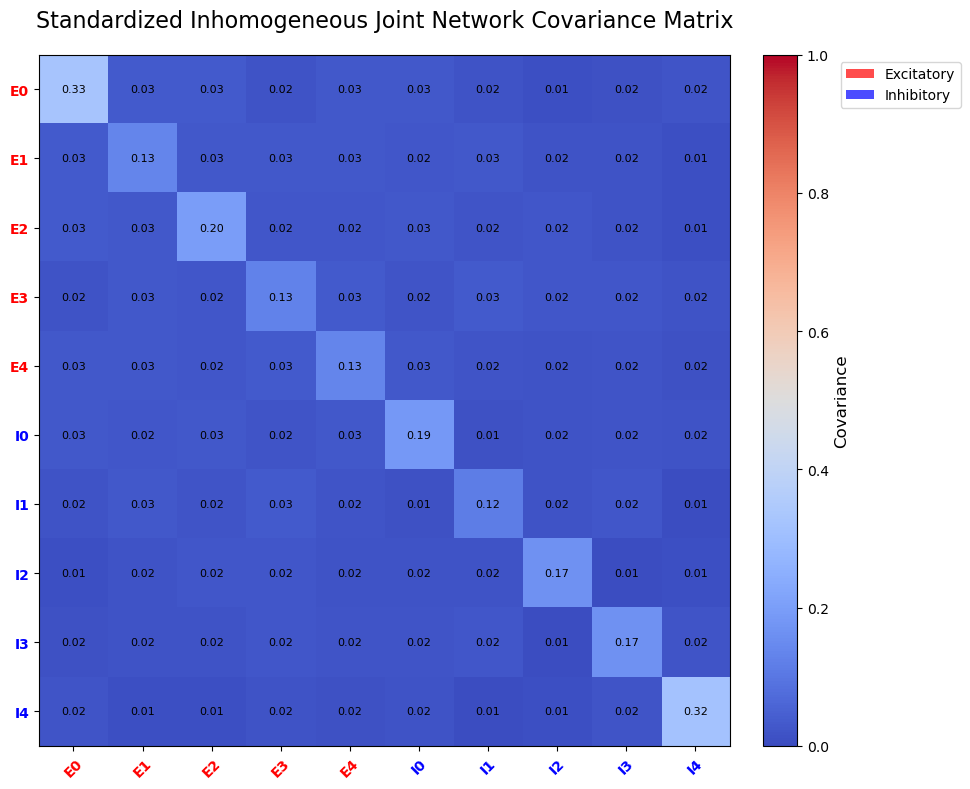

In [172]:
plot_covariance_matrix(cov_matrix_balance_emp, normalize=False, title="Standardized Inhomogeneous Joint Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=labels_emp)

In [173]:
#interleaved_data, int_labels, int_types = create_interleaved_ei_dataset(reshaped_stands_ex, reshaped_stands_in, n_neurons_each=5)
#print(f"\nInterleaved dataset shape: {interleaved_data.shape}")
#print(f"Neuron labels: {int_labels}")
#print(f"Neuron types: {int_types}")

#interleaved_data_emp, int_labels_emp, int_types_emp = create_interleaved_ei_dataset(reshaped_stands_ex_emp, reshaped_stands_in_emp, n_neurons_each=5)
#print(f"\nInterleaved Empirical dataset shape: {interleaved_data_emp.shape}")
#print(f"Neuron Empirical labels: {int_labels_emp}")
#print(f"Neuron Empirical types: {int_types_emp}")

In [174]:
#cov_matrix_interleaved = cov_standardized_data(interleaved_data)
#cov_matrix_interleaved_emp = cov_standardized_data(interleaved_data_emp)

In [175]:
#plot_covariance_matrix(cov_matrix_interleaved, normalize=False, title="Standardized Homogeneous Interleaved Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=int_labels)

In [176]:
#plot_covariance_matrix(cov_matrix_interleaved_emp, normalize=False, title="Standardized Inhomogeneous Interleaved Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=int_labels_emp)

In [177]:
#random_data, rand_labels, rand_types = create_random_ei_dataset(reshaped_stands_ex, reshaped_stands_in, n_neurons_each=5)
#print(f"\nRandom dataset shape: {random_data.shape}")
#print(f"Neuron labels: {rand_labels}")
#print(f"Neuron types: {rand_types}")

#random_data_emp, rand_labels_emp, rand_types_emp = create_random_ei_dataset(reshaped_stands_ex_emp, reshaped_stands_in_emp, n_neurons_each=5)
#print(f"\nRandom Empirical dataset shape: {random_data_emp.shape}")
#print(f"Neuron Empirical labels: {rand_labels_emp}")
#print(f"Neuron Empirical types: {rand_types_emp}")

In [178]:
#cov_matrix_random = cov_standardized_data(random_data)
#cov_matrix_random_emp = cov_standardized_data(random_data_emp)

In [179]:
#plot_covariance_matrix(cov_matrix_random, normalize=False, title="Standardized Homogeneous Random Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=rand_labels)

In [180]:
#plot_covariance_matrix(cov_matrix_random_emp, normalize=False, title="Standardized Inhomogeneous Random Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=rand_labels_emp)

Plots of raw counts, excitatory counts, and inhibitory counts centered and standardized.

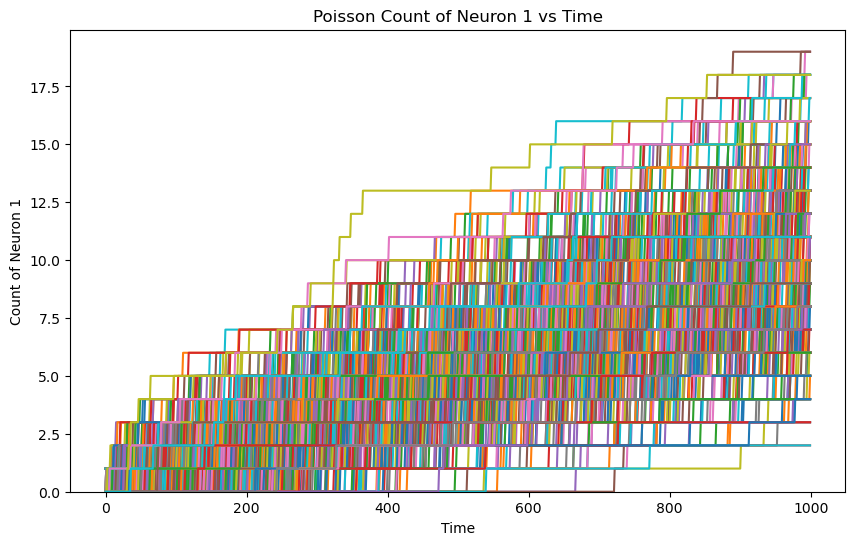

In [182]:
# plot_count_neuron1_vs_time(random_samples, num_samples = 5)
plot_count_neuron1_vs_time(count, num_samples, title = 'Poisson Count of Neuron 1 vs Time')

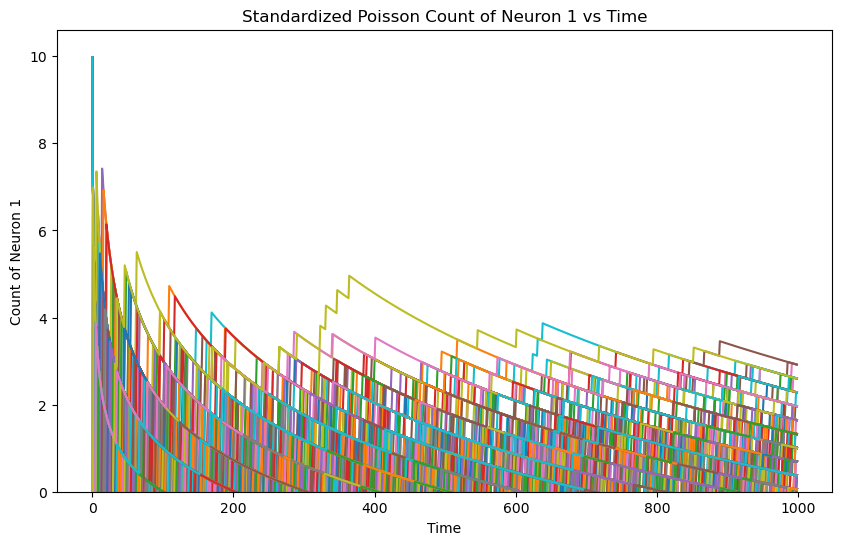

In [183]:
plot_count_neuron1_vs_time(stands, num_samples, title = 'Standardized Poisson Count of Neuron 1 vs Time')

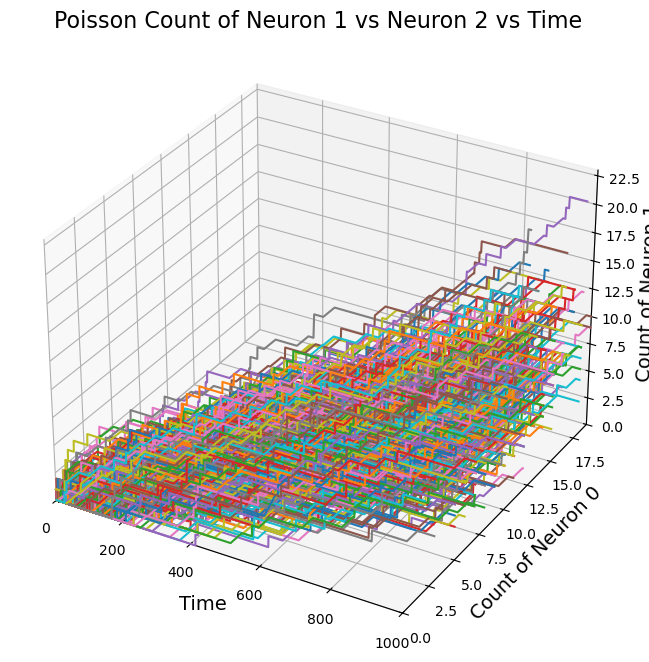

In [184]:
plot_count_neuron1_vs_neuron2_vs_time(count, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Poisson Count of Neuron 1 vs Neuron 2 vs Time' )

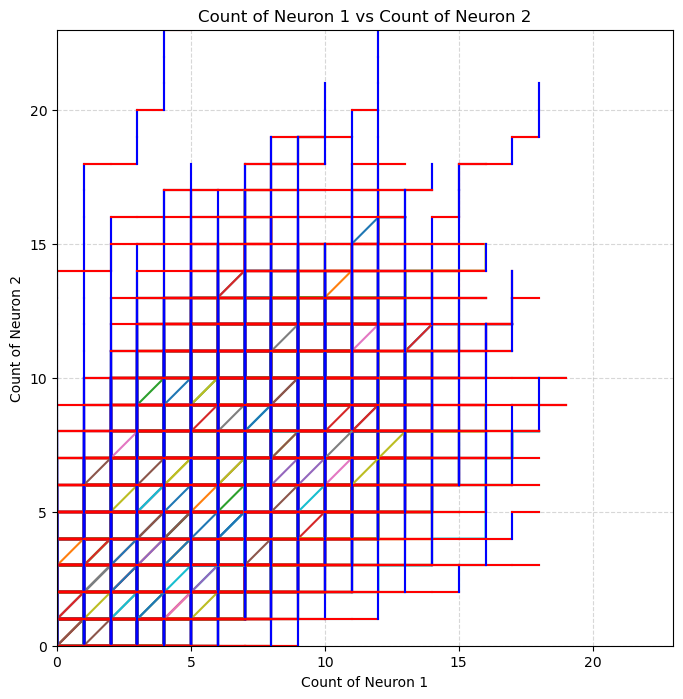

In [185]:
plot_count_neuron1_vs_count_neuron2(count, num_samples)

In [186]:
# plot_count_neuron1_vs_count_neuron2_vs_count_neuron3(count, num_samples)

In [187]:
# combined_poisson_plot(spike_train, count, theoretical_means, empirical_mean, colors=None, figsize=(12, 10))

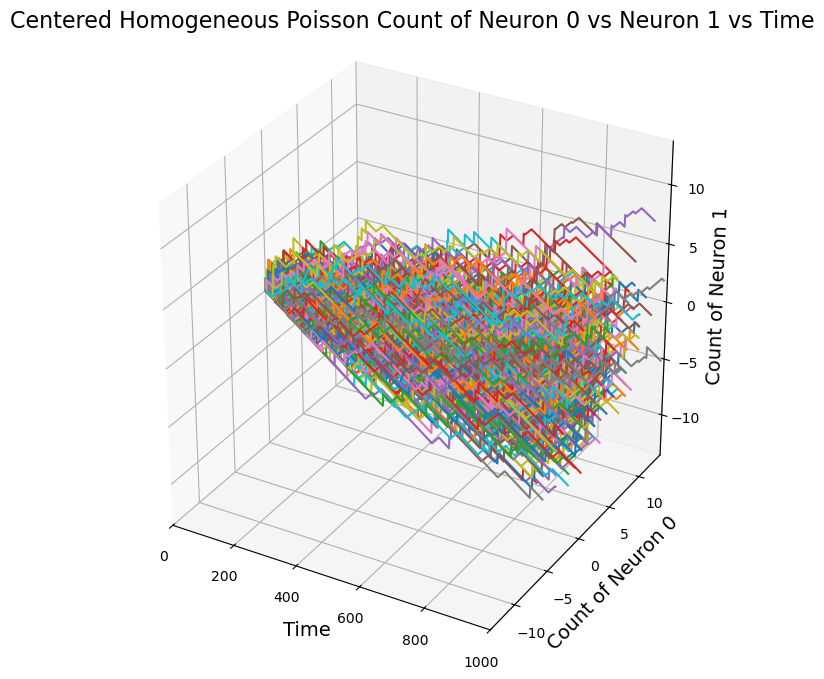

In [188]:
#plot_centered_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, num_samples=5)
plot_centered_staircase_3d(count, theoretical_means, theoretical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Homogeneous Poisson Count of Neuron 0 vs Neuron 1 vs Time' )

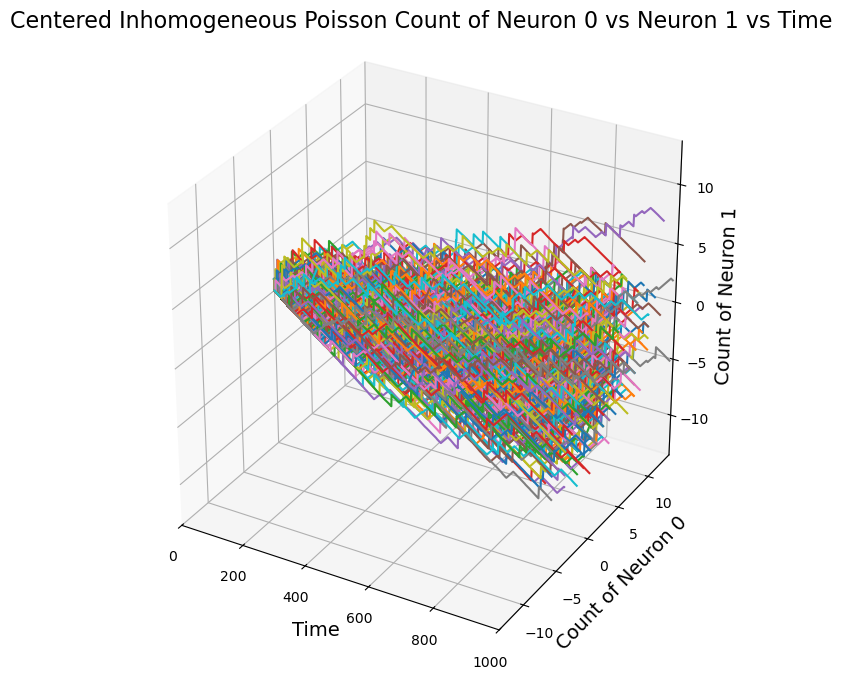

In [189]:
#plot_centered_staircase_3d(random_samples, empirical_mean, empirical_std_dev, num_samples= 5)
plot_centered_staircase_3d(count, empirical_mean, empirical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Inhomogeneous Poisson Count of Neuron 0 vs Neuron 1 vs Time')

WARNING    C:\Users\agreg\neural_simulation_functions.py:345: RuntimeWarning: invalid value encountered in divide
  neuron1_data = (count[i][neuron1_idx] - theoretical_means[neuron1_idx]) / (theoretical_std_dev[neuron1_idx])
 [py.warnings]
WARNING    C:\Users\agreg\neural_simulation_functions.py:346: RuntimeWarning: invalid value encountered in divide
  neuron2_data = (count[i][neuron2_idx] - theoretical_means[neuron2_idx]) / (theoretical_std_dev[neuron2_idx])
 [py.warnings]
WARNING    C:\Users\agreg\neural_simulation_functions.py:345: RuntimeWarning: divide by zero encountered in divide
  neuron1_data = (count[i][neuron1_idx] - theoretical_means[neuron1_idx]) / (theoretical_std_dev[neuron1_idx])
 [py.warnings]
WARNING    C:\Users\agreg\neural_simulation_functions.py:346: RuntimeWarning: divide by zero encountered in divide
  neuron2_data = (count[i][neuron2_idx] - theoretical_means[neuron2_idx]) / (theoretical_std_dev[neuron2_idx])
 [py.warnings]


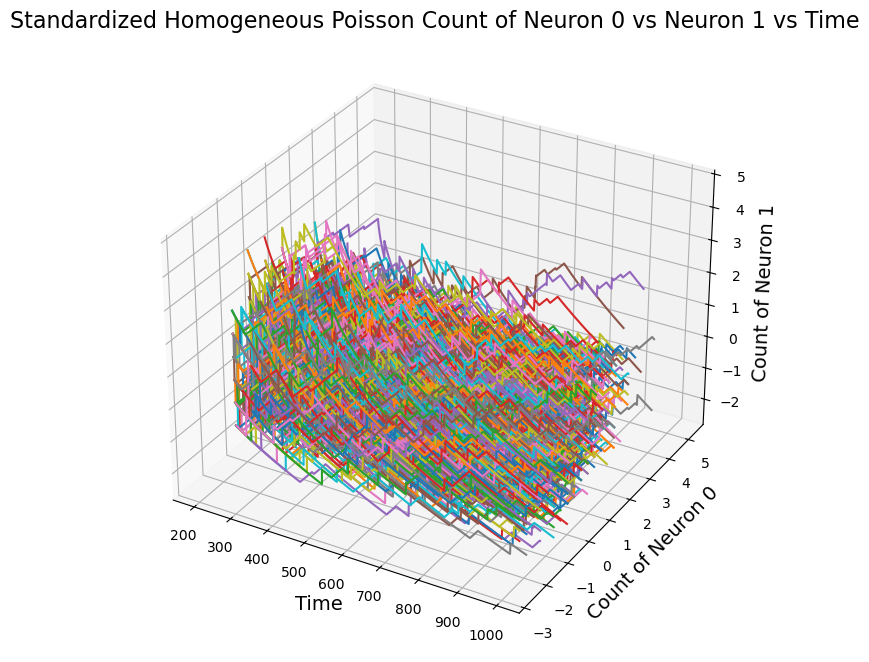

In [190]:
#plot_standardized_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, t0, num_samples=5)
plot_standardized_staircase_3d(count, theoretical_means, theoretical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Homogeneous Poisson Count of Neuron 0 vs Neuron 1 vs Time')

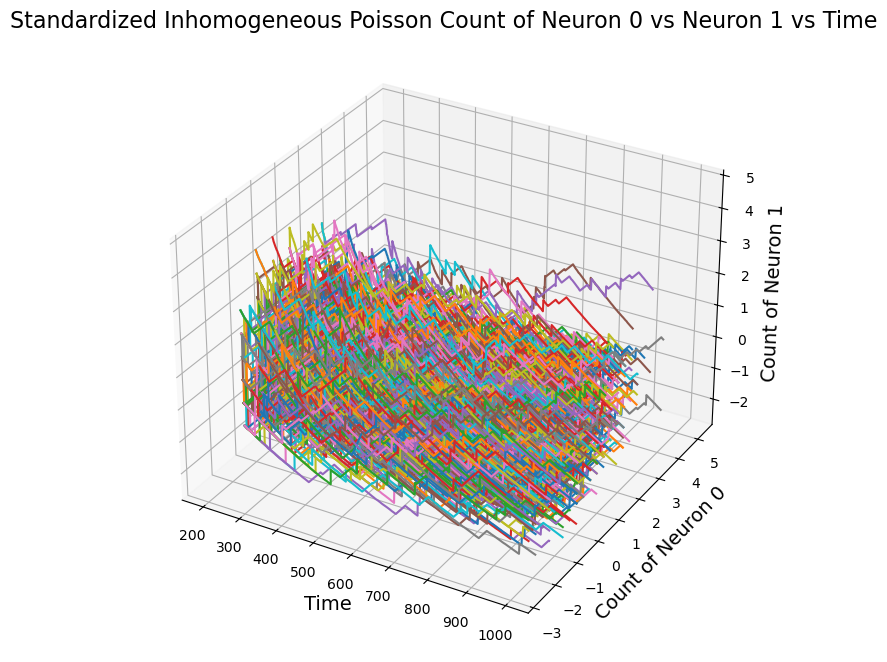

In [191]:
#plot_standardized_staircase_3d(random_samples, empirical_mean, empirical_std_dev, t0, num_samples=5)
plot_standardized_staircase_3d(count, empirical_mean, empirical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Inhomogeneous Poisson Count of Neuron 0 vs Neuron 1 vs Time')

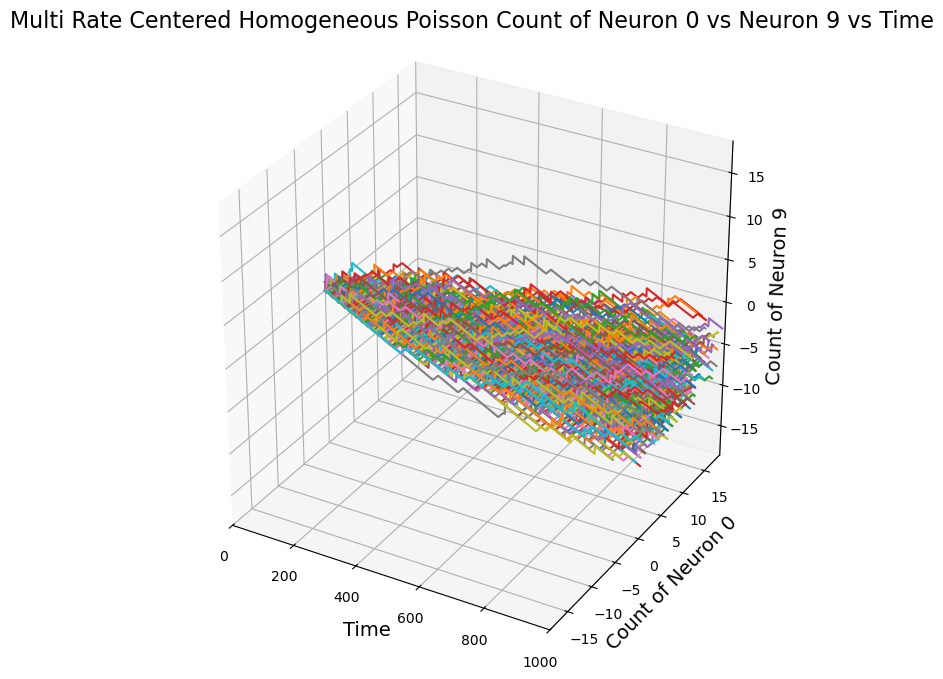

In [192]:
#plot_centered_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, num_samples=5)
# plot_centered_staircase_3d(multi_rate_count, multi_rate_theoretical_means, multi_rate_theoretical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Centered Homogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time' )
plot_centered_staircase_3d(multi_rate_count, theoretical_means, theoretical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Centered Homogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time' )

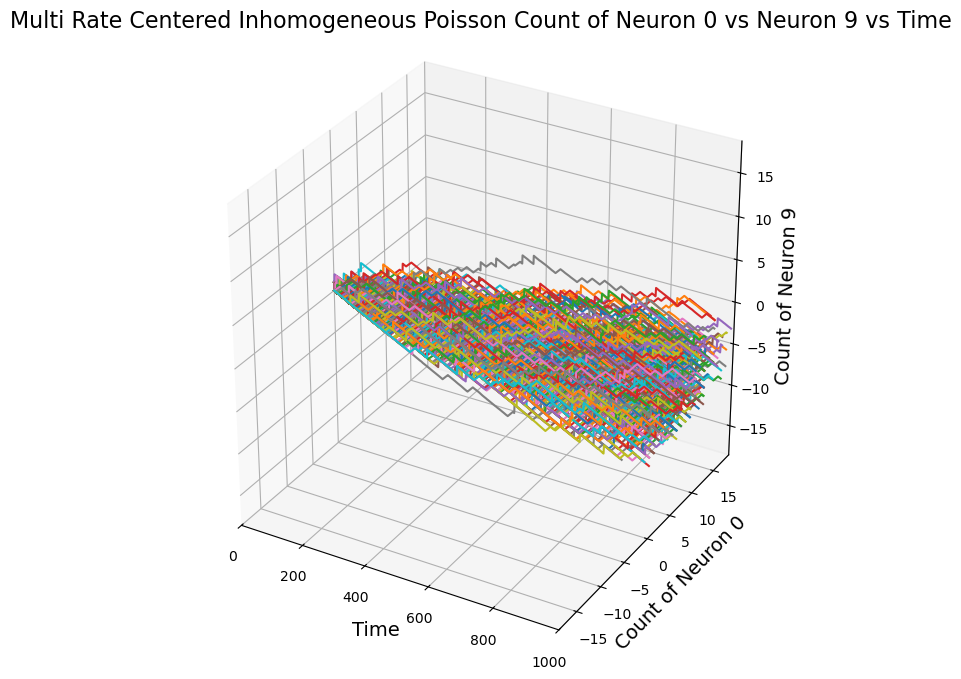

In [193]:
#plot_centered_staircase_3d(random_samples, empirical_mean, empirical_std_dev, num_samples= 5)
# plot_centered_staircase_3d(multi_rate_count, multi_rate_empirical_mean, multi_rate_empirical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Centered Inhomogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')
plot_centered_staircase_3d(multi_rate_count, empirical_mean, empirical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Centered Inhomogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')

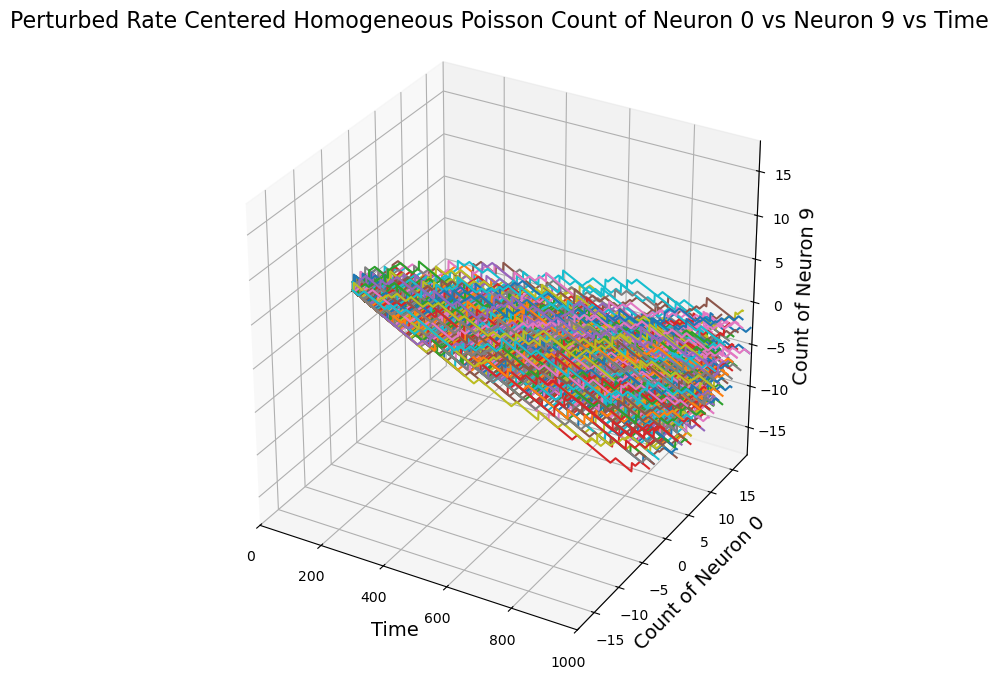

In [194]:
#plot_centered_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, num_samples=5)
# plot_centered_staircase_3d(perturbed_rate_count, perturbed_rate_theoretical_means, perturbed_rate_theoretical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Perturbed Rate Centered Homogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time' )
plot_centered_staircase_3d(perturbed_rate_count, theoretical_means, theoretical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Perturbed Rate Centered Homogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time' )

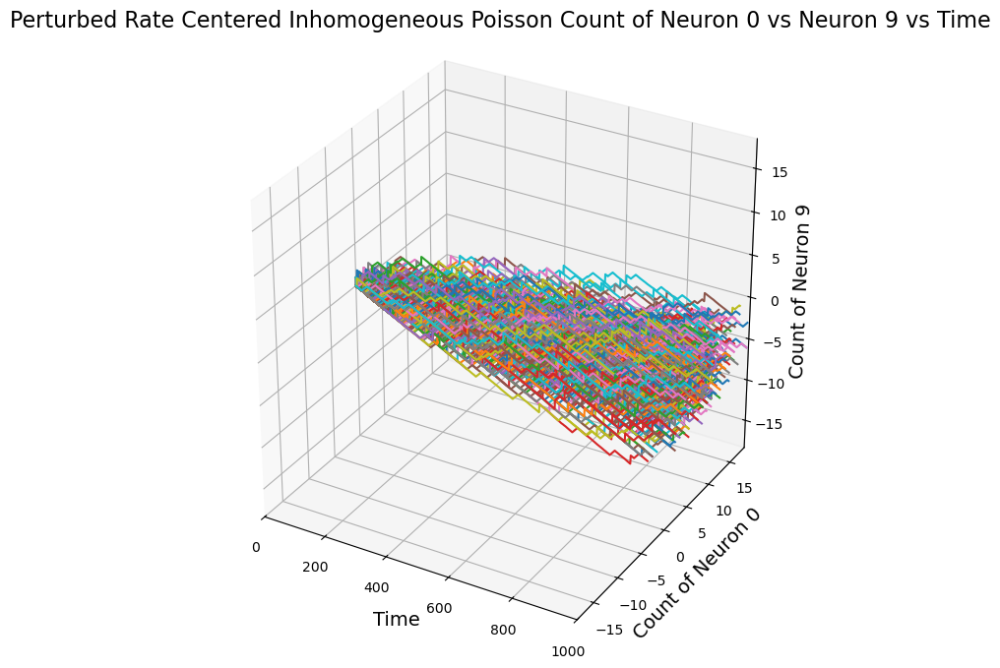

In [195]:
#plot_centered_staircase_3d(random_samples, empirical_mean, empirical_std_dev, num_samples= 5)
# plot_centered_staircase_3d(perturbed_rate_count, perturbed_rate_empirical_mean, perturbed_rate_empirical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Perturbed Rate Centered Inhomogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')
plot_centered_staircase_3d(perturbed_rate_count, empirical_mean, empirical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Perturbed Rate Centered Inhomogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')

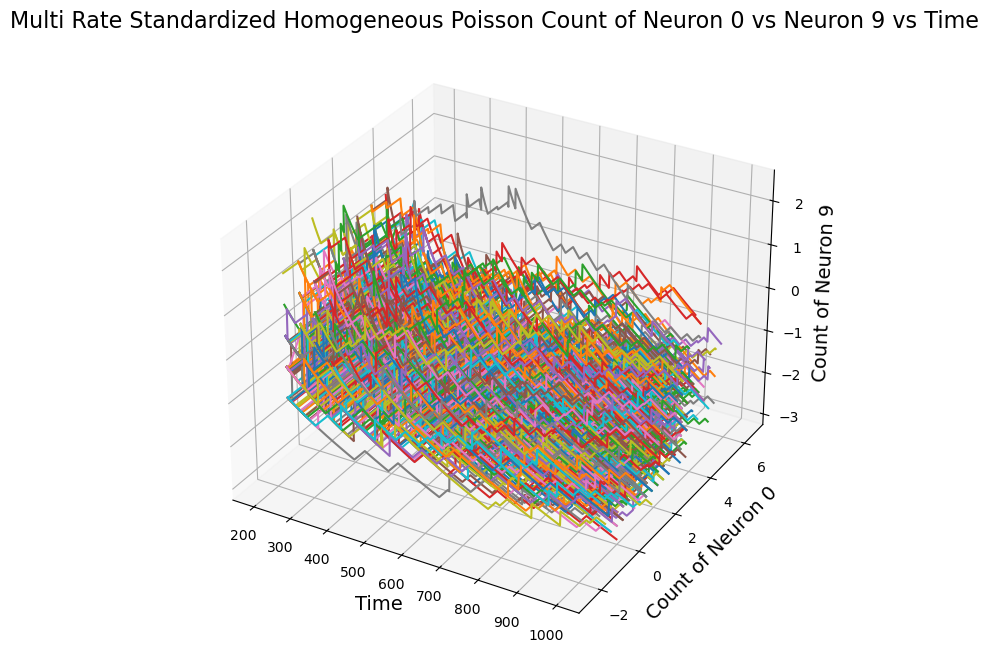

In [196]:
#plot_standardized_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, t0, num_samples=5)
# plot_standardized_staircase_3d(multi_rate_count, multi_rate_theoretical_means, multi_rate_theoretical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Standardized Homogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')
plot_standardized_staircase_3d(multi_rate_count, theoretical_means, theoretical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Standardized Homogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')

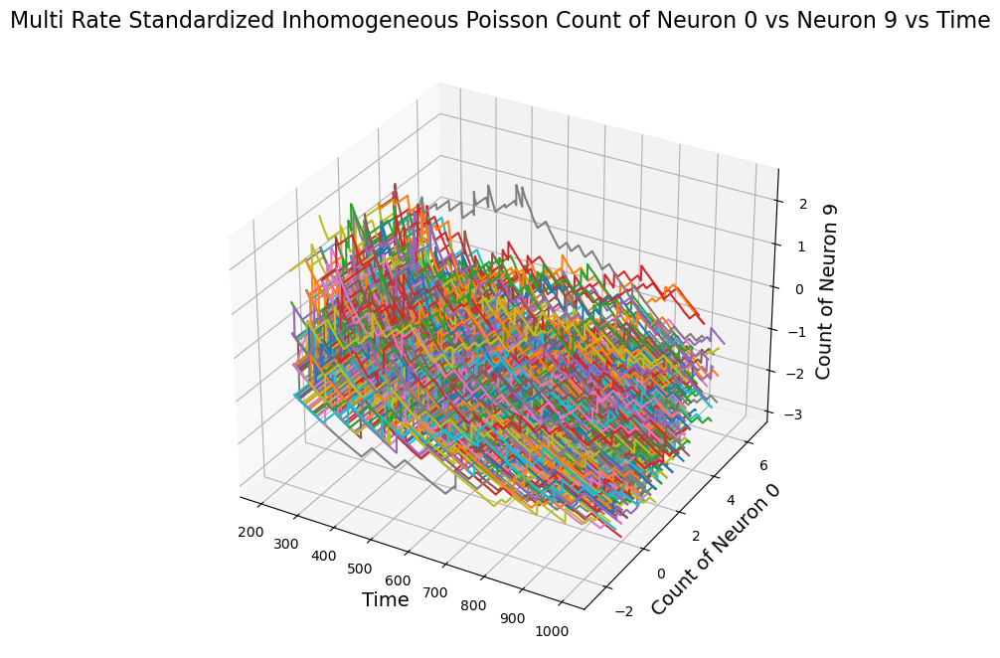

In [197]:
#plot_standardized_staircase_3d(random_samples, empirical_mean, empirical_std_dev, t0, num_samples=5)
# plot_standardized_staircase_3d(multi_rate_count, multi_rate_empirical_mean, multi_rate_empirical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Standardized Inhomogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')
plot_standardized_staircase_3d(multi_rate_count, empirical_mean, empirical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Standardized Inhomogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')

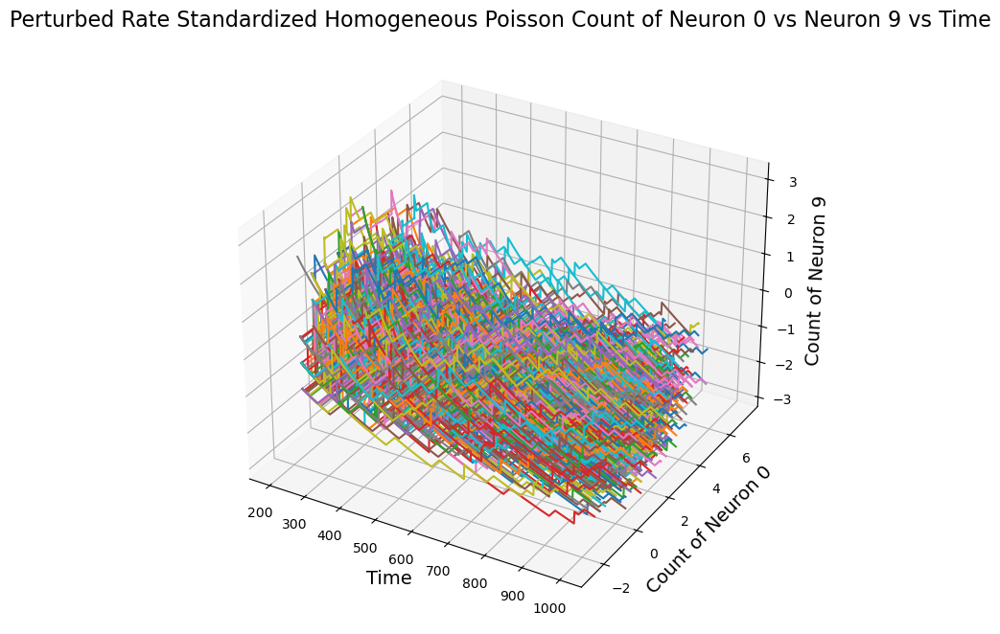

In [198]:
#plot_standardized_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, t0, num_samples=5)
# plot_standardized_staircase_3d(perturbed_rate_count, perturbed_rate_theoretical_means, perturbed_rate_theoretical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Perturbed Rate Standardized Homogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')
plot_standardized_staircase_3d(perturbed_rate_count, theoretical_means, theoretical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Perturbed Rate Standardized Homogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')

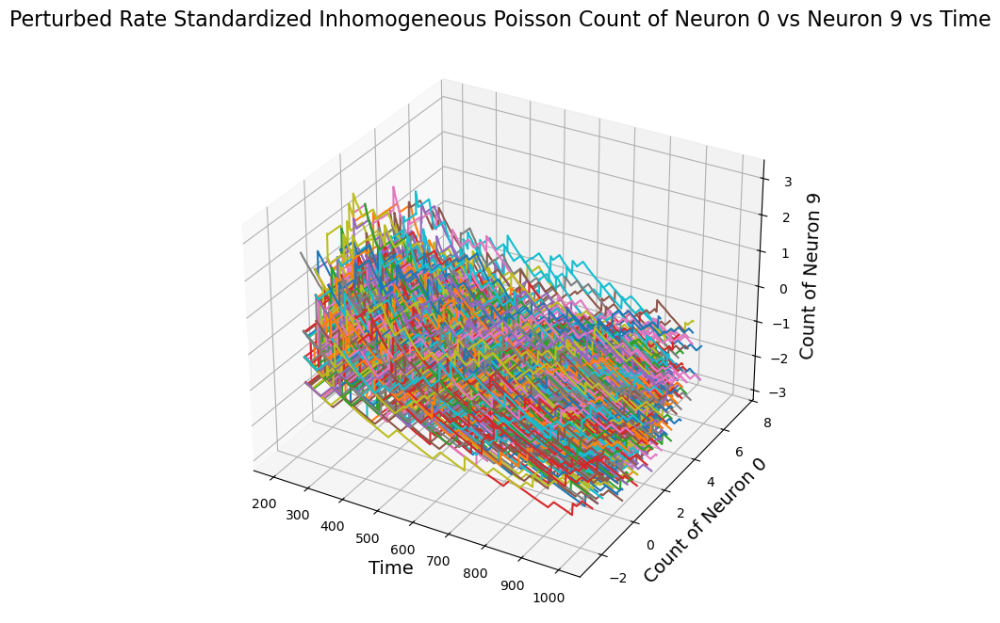

In [199]:
#plot_standardized_staircase_3d(random_samples, empirical_mean, empirical_std_dev, t0, num_samples=5)
# plot_standardized_staircase_3d(perturbed_rate_count, perturbed_rate_empirical_mean, perturbed_rate_empirical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Perturbed Rate Standardized Inhomogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')
plot_standardized_staircase_3d(perturbed_rate_count, empirical_mean, empirical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Perturbed Rate Standardized Inhomogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')

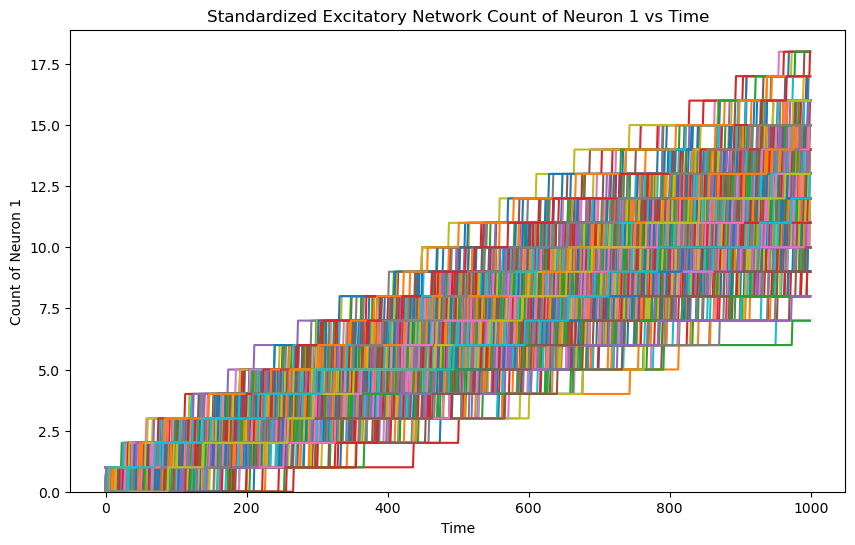

In [200]:
#plot_count_neuron1_vs_time(random_samples_ex, num_samples = 5)
plot_count_neuron1_vs_time(count_ex, num_samples, title = 'Standardized Excitatory Network Count of Neuron 1 vs Time')

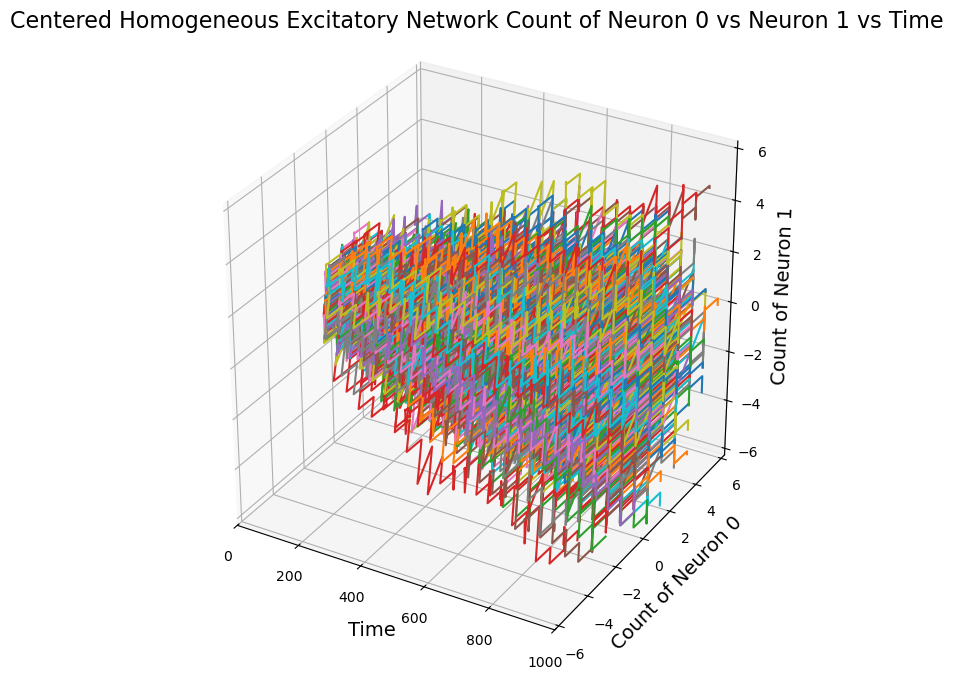

In [201]:
#plot_centered_staircase_3d(random_samples_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, num_samples= 5)
plot_centered_staircase_3d(count_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Homogeneous Excitatory Network Count of Neuron 0 vs Neuron 1 vs Time')

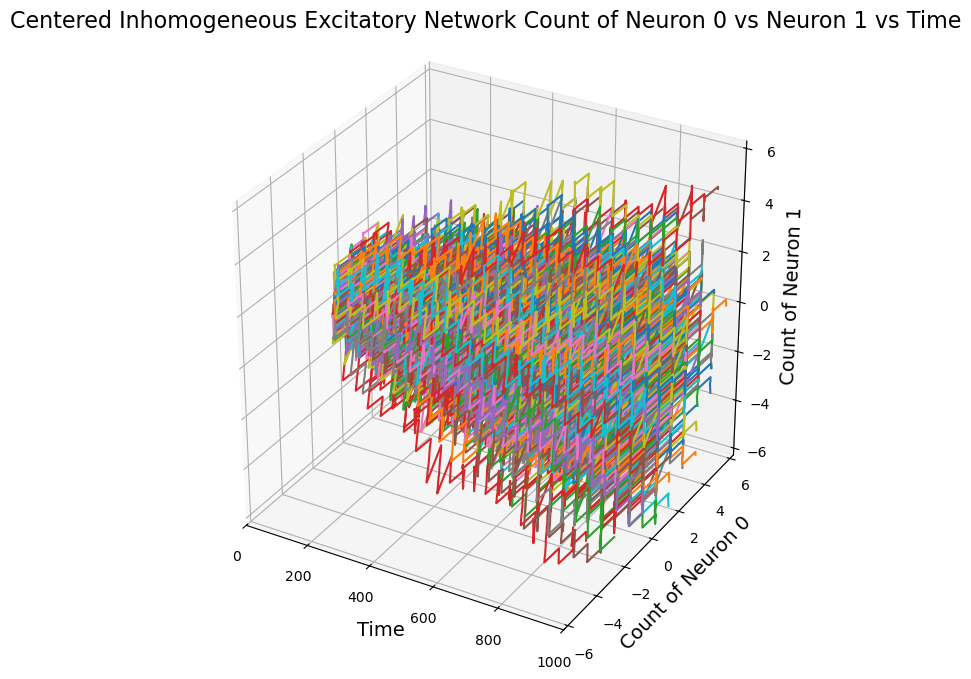

In [202]:
#plot_centered_staircase_3d(random_samples_ex, empirical_mean_ex, empirical_std_dev_ex, num_samples= 5)
plot_centered_staircase_3d(count_ex, empirical_mean_ex, empirical_std_dev_ex, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Inhomogeneous Excitatory Network Count of Neuron 0 vs Neuron 1 vs Time')

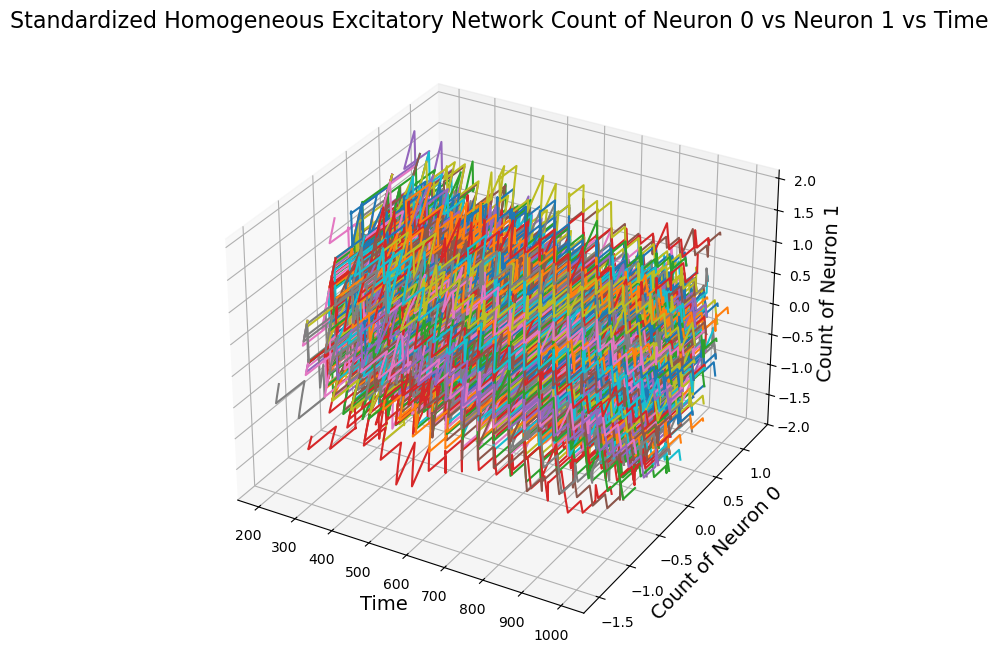

In [203]:
#plot_standardized_staircase_3d(random_samples_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, t0, num_samples=5)
plot_standardized_staircase_3d(count_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Homogeneous Excitatory Network Count of Neuron 0 vs Neuron 1 vs Time')

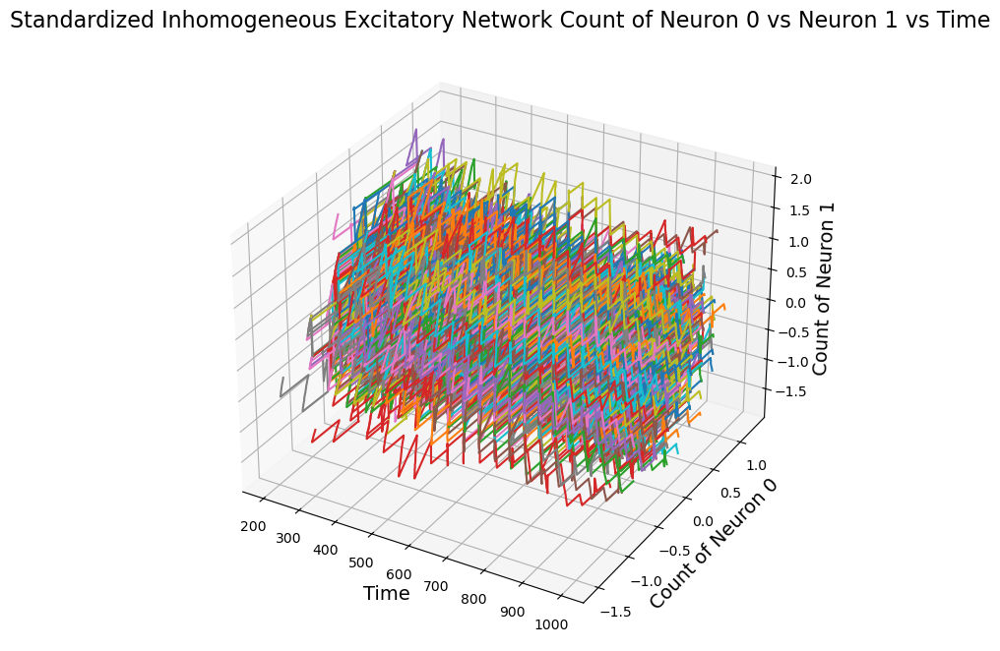

In [204]:
#plot_standardized_staircase_3d(random_samples_ex, empirical_mean_ex, empirical_std_dev_ex, t0, num_samples=5)
plot_standardized_staircase_3d(count_ex, empirical_mean_ex, empirical_std_dev_ex, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Inhomogeneous Excitatory Network Count of Neuron 0 vs Neuron 1 vs Time')

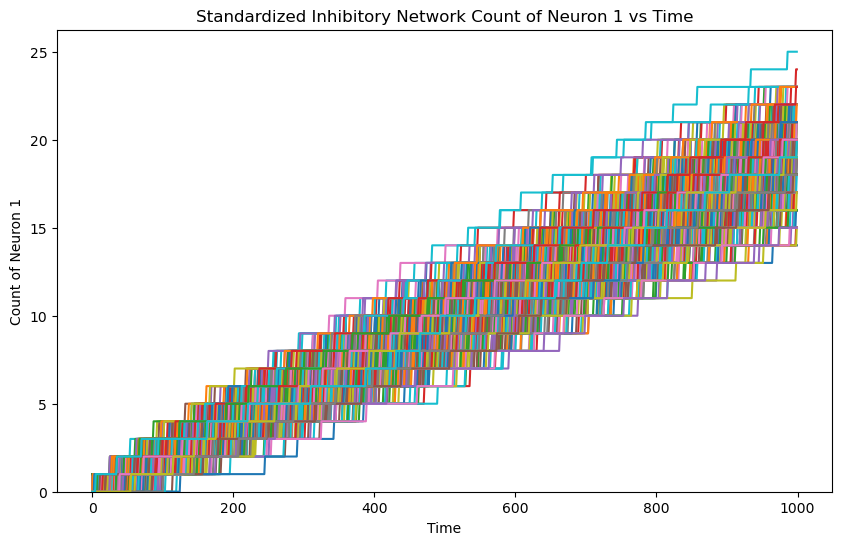

In [205]:
#plot_count_neuron1_vs_time(random_samples_in, num_samples = 5)
plot_count_neuron1_vs_time(count_in, num_samples, title = 'Standardized Inhibitory Network Count of Neuron 1 vs Time')

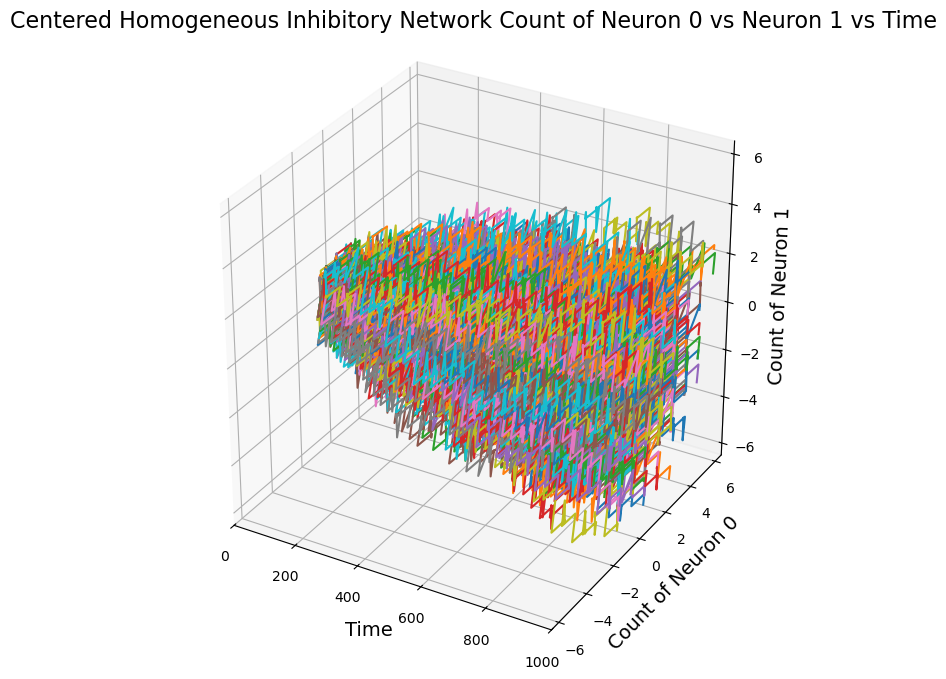

In [206]:
#plot_centered_staircase_3d(random_samples_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, num_samples= 5)
plot_centered_staircase_3d(count_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Homogeneous Inhibitory Network Count of Neuron 0 vs Neuron 1 vs Time')

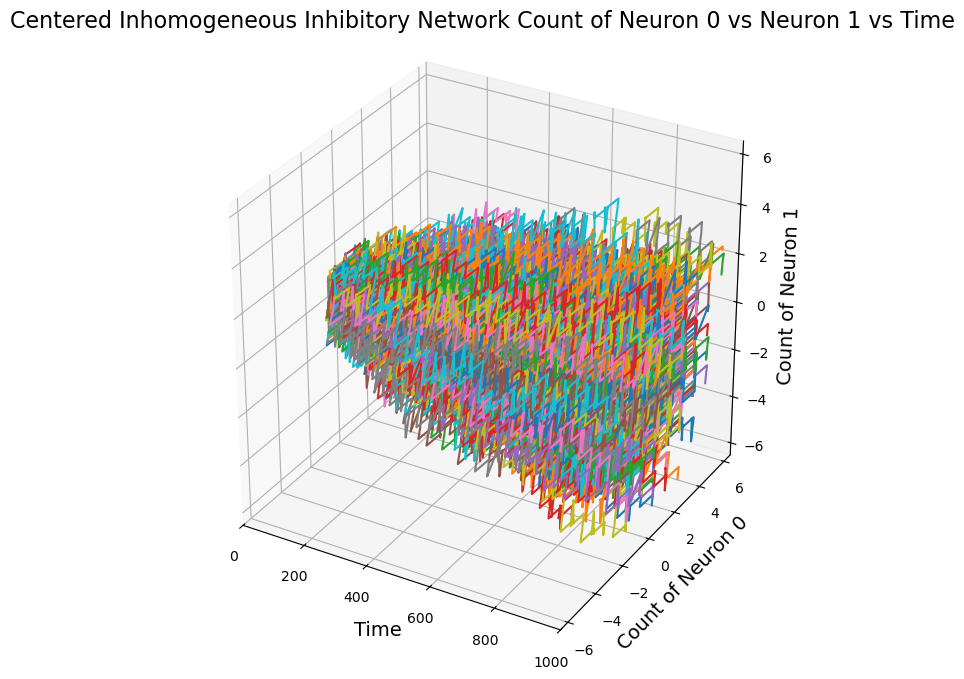

In [207]:
#plot_centered_staircase_3d(random_samples_in, empirical_mean_in, empirical_std_dev_in, num_samples= 5)
plot_centered_staircase_3d(count_in, empirical_mean_in, empirical_std_dev_in, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Inhomogeneous Inhibitory Network Count of Neuron 0 vs Neuron 1 vs Time')

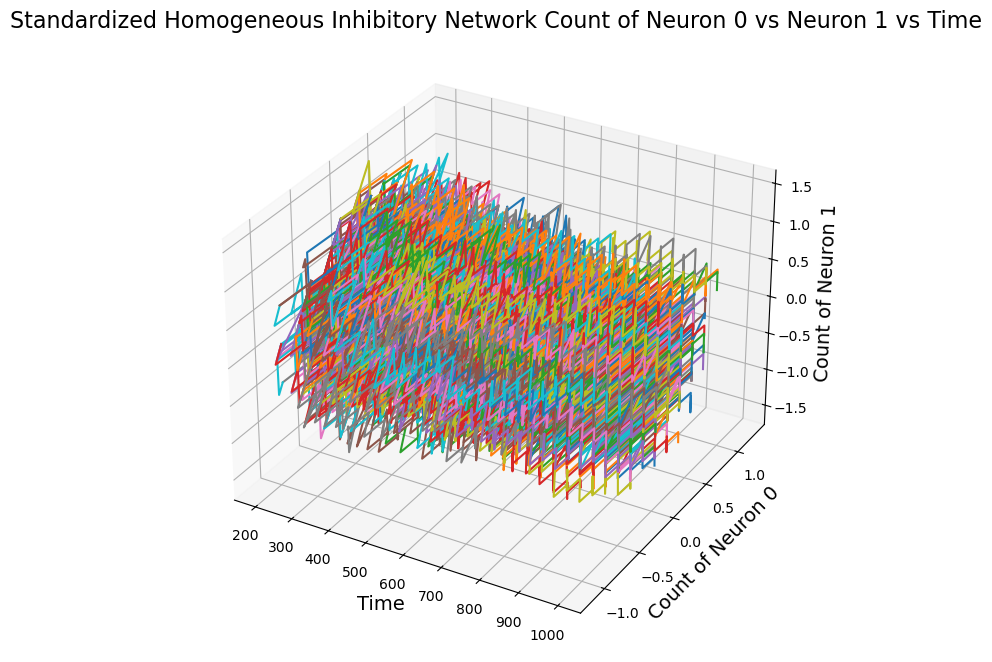

In [208]:
#plot_standardized_staircase_3d(random_samples_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, t0, num_samples=5)
plot_standardized_staircase_3d(count_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Homogeneous Inhibitory Network Count of Neuron 0 vs Neuron 1 vs Time')

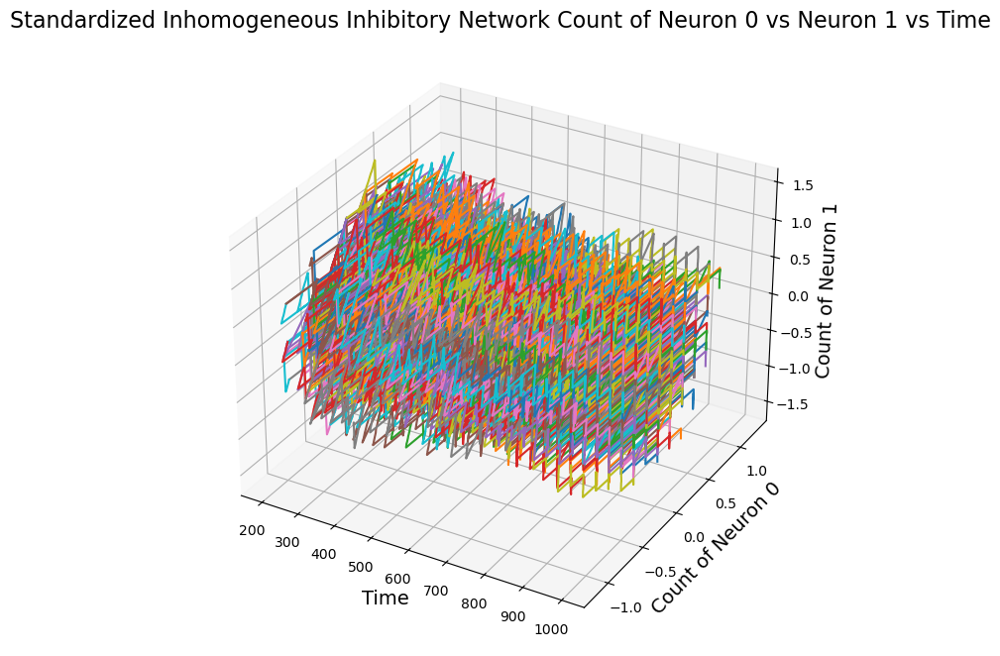

In [209]:
#plot_standardized_staircase_3d(random_samples_in, empirical_mean_in, empirical_std_dev_in, t0, num_samples=5)
plot_standardized_staircase_3d(count_in, empirical_mean_in, empirical_std_dev_in, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Inhomogeneous Inhibitory Network Count of Neuron 0 vs Neuron 1 vs Time')

(<Figure size 1200x700 with 2 Axes>,
 <Axes: title={'center': 'Standardized Poisson Count with Mean and Standard Deviation'}, xlabel='Time', ylabel='Statistical Values'>,
 <Axes: ylabel='Standardized Count'>)

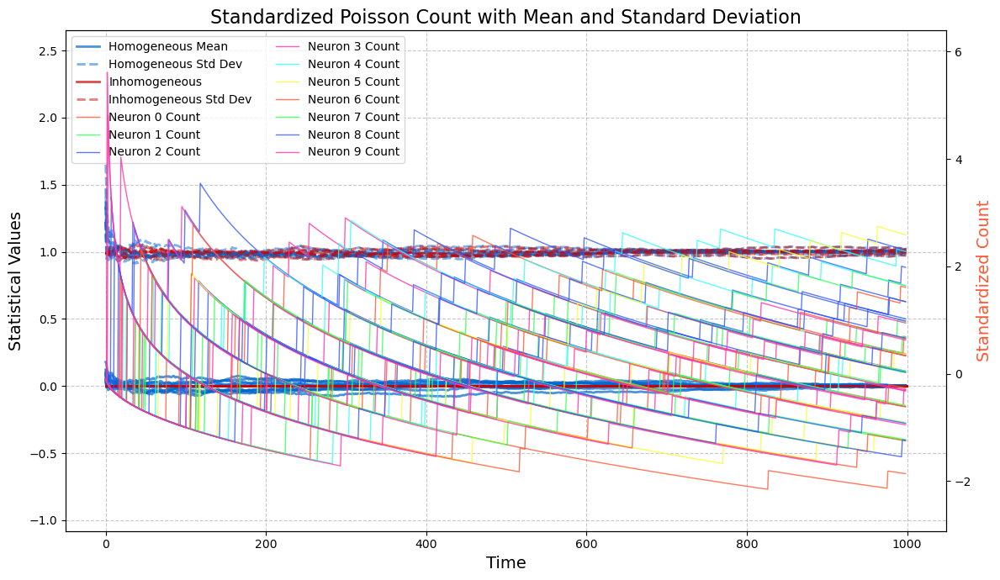

In [210]:
data_plot(stands, num_samples, standardized_mean, standardized_mean_emp, 
              standardized_std, standardized_std_emp, num_neurons, title= 'Standardized Poisson Count with Mean and Standard Deviation',
              figsize=(12, 7), max_samples_to_show=5)

(<Figure size 1200x700 with 2 Axes>,
 <Axes: title={'center': 'Standardized Exctitatory Count with Mean and Standard Deviation'}, xlabel='Time', ylabel='Statistical Values'>,
 <Axes: ylabel='Standardized Count'>)

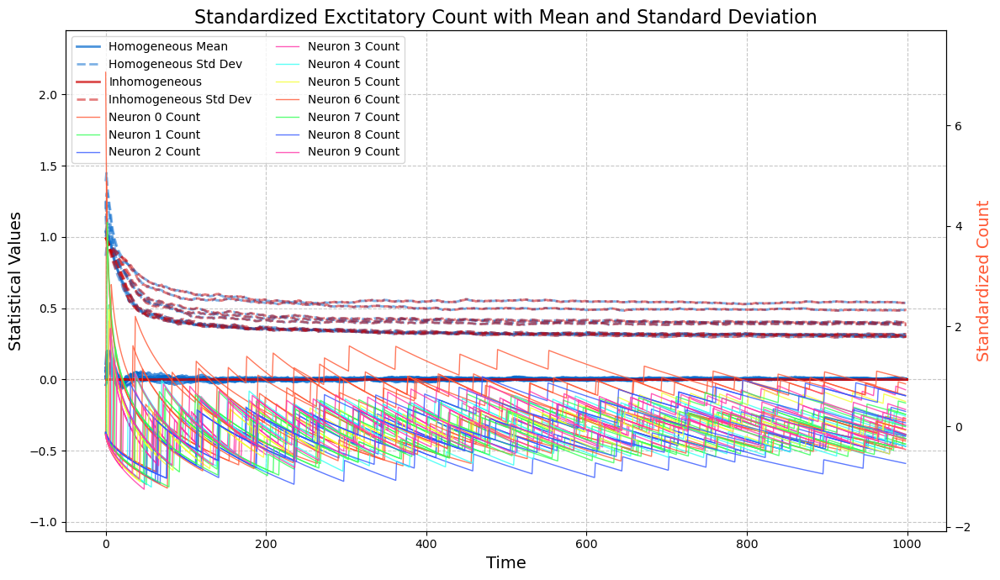

In [211]:
data_plot(stands_ex, num_samples, standardized_mean_ex, standardized_mean_ex_emp, 
              standardized_std_ex, standardized_std_ex_emp, num_neurons, title='Standardized Exctitatory Count with Mean and Standard Deviation',
              figsize=(12, 7), max_samples_to_show=5)

(<Figure size 1200x700 with 2 Axes>,
 <Axes: title={'center': 'Standardized Inhibitory Count with Mean and Standard Deviation'}, xlabel='Time', ylabel='Statistical Values'>,
 <Axes: ylabel='Standardized Count'>)

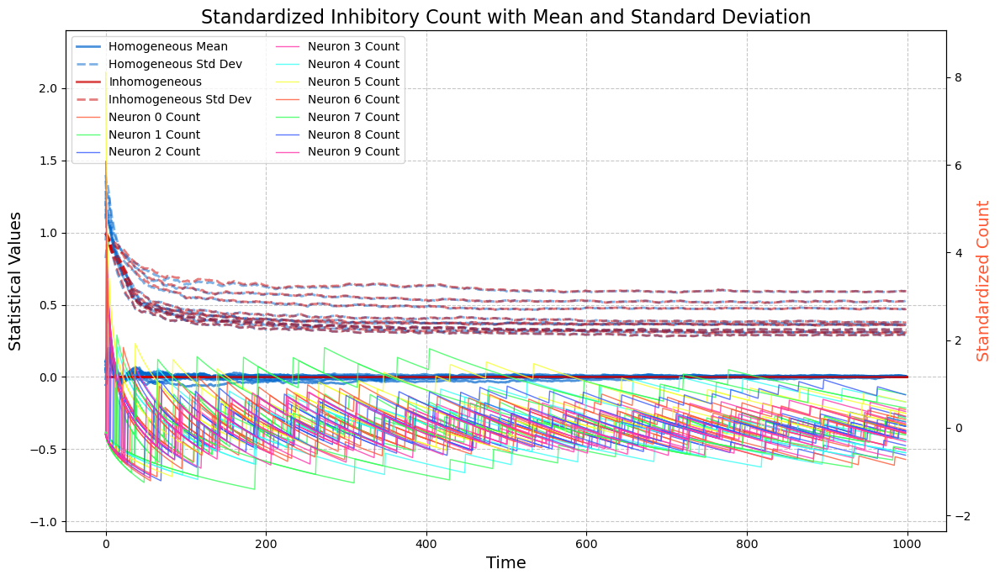

In [212]:
data_plot(stands_in, num_samples, standardized_mean_in, standardized_mean_in_emp, 
              standardized_std_in, standardized_std_in_emp, num_neurons, title='Standardized Inhibitory Count with Mean and Standard Deviation',
              figsize=(12, 7), max_samples_to_show=5)